In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torchvision import datasets, transforms

from utils import mnist, plot_graphs, plot_mnist
import numpy as np
import os 

%matplotlib inline

In [2]:
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline

In [3]:
root_folder = 'FC_GAN_results'
fixed_folder = root_folder + '/Fixed_results'

In [4]:
mnist_tanh = transforms.Compose([
             transforms.ToTensor(),
             transforms.Normalize((0.5,), (0.5,)),
             ])

# Задание 1. Сделать условный GAN — класс подается на вход Генератору и Дискриминатору.

In [5]:
with torch.cuda.device(0):
    lr = 0.0001
    prior_size = 100
    train_epoch = 1000
    batch_size = 250
    num_classes = 10
    
    train_loader, valid_loader, test_loader = mnist(batch_size=batch_size, valid=10000, transform=mnist_tanh)
    
    _, fixed_loader, _ = mnist(batch_size=50, valid=10000, transform=mnist_tanh)
    fixed_data, labels = next(iter(fixed_loader))
    
    fixed_z = torch.randn((50, 100))
    fixed_y = torch.eye(10)[labels]
    batch_zeros = torch.zeros((batch_size, 1))
    batch_ones = torch.ones((batch_size, 1))

In [6]:
class FullyConnected(nn.Module):
    def __init__(self, sizes, dropout=False, activation_fn=nn.Tanh(), flatten=False, last_fn=None):
        super(FullyConnected, self).__init__()
        layers = []
        self.flatten = flatten
        for i in range(len(sizes) - 2):
            layers.append(nn.Linear(sizes[i], sizes[i+1]))
            if dropout:
                layers.append(nn.Dropout(dropout))
            layers.append(activation_fn)
        else: 
            layers.append(nn.Linear(sizes[-2], sizes[-1]))
        if last_fn is not None:
            layers.append(last_fn)
        self.model = nn.Sequential(*layers)
        
    def forward(self, x):
        if self.flatten:
            x = x.view(x.shape[0], -1)
        return self.model(x)

In [7]:
with torch.cuda.device(0):
    G = FullyConnected([prior_size + num_classes, 256, 512, 1024, 28*28], activation_fn=nn.LeakyReLU(0.2), last_fn=nn.Tanh())
    D = FullyConnected([28*28 + num_classes, 1024, 512, 256, 1], dropout=0.3, activation_fn=nn.LeakyReLU(0.2), flatten=True)

    G_optimizer = optim.Adam(G.parameters(), lr=lr)
    D_optimizer = optim.Adam(D.parameters(), lr=lr)

In [8]:
train_log = {'G': [], 'D': []}
test_log = {'G': [], 'D': []}

In [9]:
def train(epoch, G, D, log=None):
    with torch.cuda.device(0):
        train_size = len(train_loader.sampler)
        for batch_idx, (data, labels) in enumerate(train_loader):
            # train D
            y_oh = torch.eye(10)[labels]
            D.zero_grad()
            G.zero_grad()
            z = torch.randn((batch_size, prior_size))
            
            fake_pred = D(torch.cat((G(torch.cat((z, y_oh), 1)), y_oh), 1))
            data = data.view(-1, 28*28)
            true_pred = D(torch.cat((data, y_oh), 1))

            fake_loss = F.binary_cross_entropy_with_logits(fake_pred, batch_zeros)
            true_loss = F.binary_cross_entropy_with_logits(true_pred, batch_ones)

            D_loss = 0.5*(fake_loss + true_loss)

            D_loss.backward()
            D_optimizer.step()

            # train G
            D.zero_grad()
            G.zero_grad()
            z = torch.randn((batch_size, prior_size))
            fake_pred = D(torch.cat((G(torch.cat((z, y_oh), 1)), y_oh), 1))
            G_loss = F.binary_cross_entropy_with_logits(fake_pred, batch_ones)

            G_loss.backward()

            G_optimizer.step()

            if batch_idx % 100 == 0:
                line = 'Train Epoch: {} [{}/{} ({:.0f}%)]\tLosses '.format(
                    epoch, batch_idx * len(data), train_size, 100. * batch_idx / len(train_loader))
                losses = 'G: {:.4f}, D: {:.4f}'.format(G_loss.item(), D_loss.item())
                print(line + losses)

        else:
            batch_idx += 1
            line = 'Train Epoch: {} [{}/{} ({:.0f}%)]\tLosses '.format(
                epoch, batch_idx * len(data), train_size, 100. * batch_idx / len(train_loader))
            losses = 'G: {:.4f}, D: {:.4f}'.format(G_loss.item(), D_loss.item())
            print(line + losses)
            log['G'].append(G_loss.item())
            log['D'].append(D_loss.item())

In [10]:
def test(G, D, loader, epoch, log=None):
    with torch.cuda.device(0):
        test_size = len(loader)
        G_loss = 0.
        D_loss = 0.
        test_loss = {'G': 0., 'D': 0.}
        with torch.no_grad():
            for data, labels in loader:
                z = torch.randn((batch_size, prior_size))
                y_oh = torch.eye(10)[labels]
                
                fake_pred = D(torch.cat((G(torch.cat((z, y_oh), 1)), y_oh), 1))
                data = data.view(-1, 28*28)
                true_pred = D(torch.cat((data, y_oh), 1))

                fake_loss = F.binary_cross_entropy_with_logits(fake_pred, batch_zeros).item()
                true_loss = F.binary_cross_entropy_with_logits(true_pred, batch_ones).item()

                D_loss += 0.5*(fake_loss + true_loss)
                G_loss += F.binary_cross_entropy_with_logits(fake_pred, batch_ones).item()

        G_loss /= test_size
        D_loss /= test_size

        fixed_gen = G(torch.cat((fixed_z, fixed_y), 1)).data.numpy().reshape(50, 1, 28, 28)
        plot_mnist(fixed_data, (5, 10), 'Dataset numbers')
        plot_mnist(fixed_gen, (5, 10), 'Reconstructed numbers', True, fixed_folder + '/%03d.png' % epoch)
        report = 'Test losses. G: {:.4f}, D: {:.4f}'.format(G_loss, D_loss)
        print(report)

Train Epoch: 1 [0/50000 (0%)]	Losses G: 0.7080, D: 0.6855
Train Epoch: 1 [25000/50000 (50%)]	Losses G: 1.1184, D: 0.3354
Train Epoch: 1 [50000/50000 (100%)]	Losses G: 1.0711, D: 0.5776


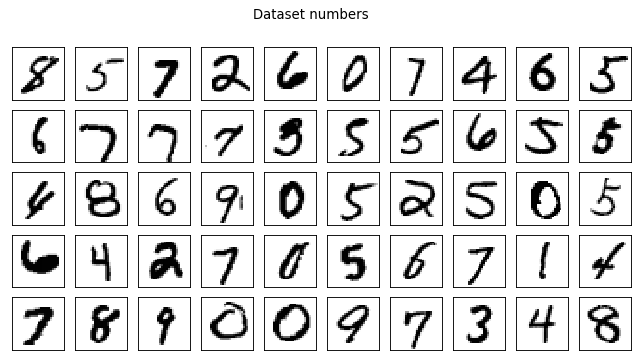

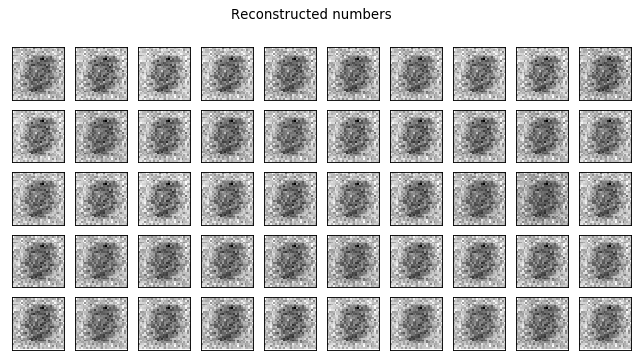

Test losses. G: 0.5069, D: 0.5619
Train Epoch: 2 [0/50000 (0%)]	Losses G: 0.9956, D: 0.6026
Train Epoch: 2 [25000/50000 (50%)]	Losses G: 1.7130, D: 0.4841
Train Epoch: 2 [50000/50000 (100%)]	Losses G: 2.8289, D: 0.4911


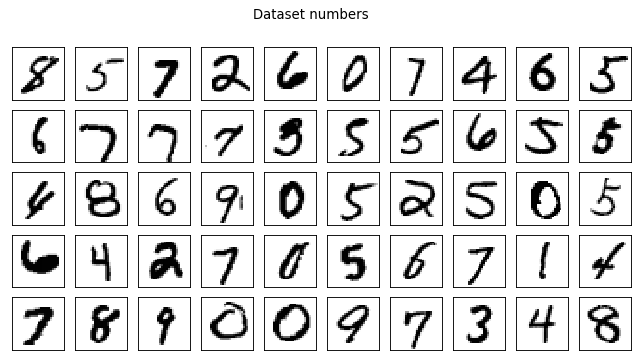

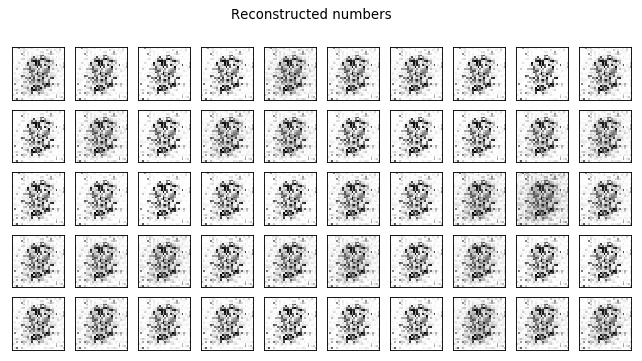

Test losses. G: 1.3257, D: 0.4406
Train Epoch: 3 [0/50000 (0%)]	Losses G: 2.8122, D: 0.5377
Train Epoch: 3 [25000/50000 (50%)]	Losses G: 4.3363, D: 0.1180
Train Epoch: 3 [50000/50000 (100%)]	Losses G: 1.8153, D: 0.7099


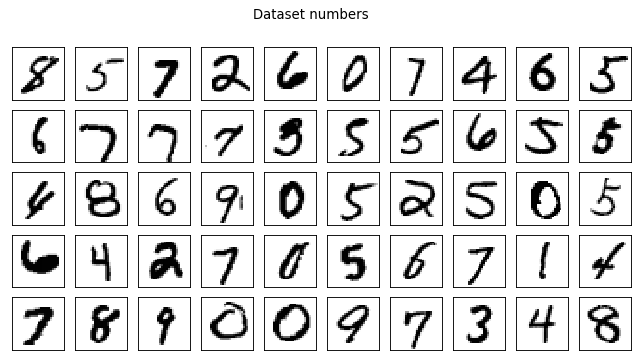

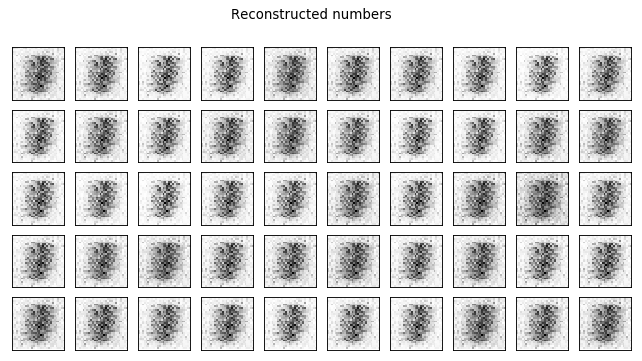

Test losses. G: 1.0749, D: 0.5810
Train Epoch: 4 [0/50000 (0%)]	Losses G: 2.1384, D: 0.6004
Train Epoch: 4 [25000/50000 (50%)]	Losses G: 1.2116, D: 0.6316
Train Epoch: 4 [50000/50000 (100%)]	Losses G: 4.3742, D: 0.1499


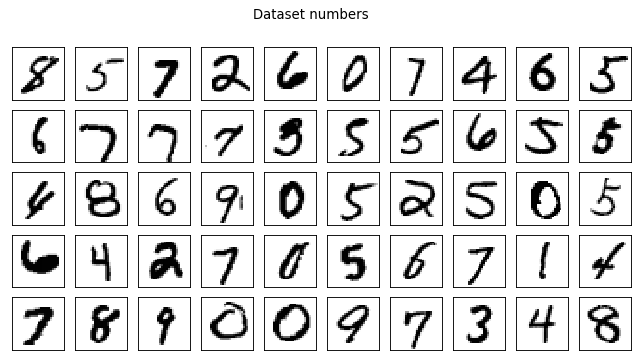

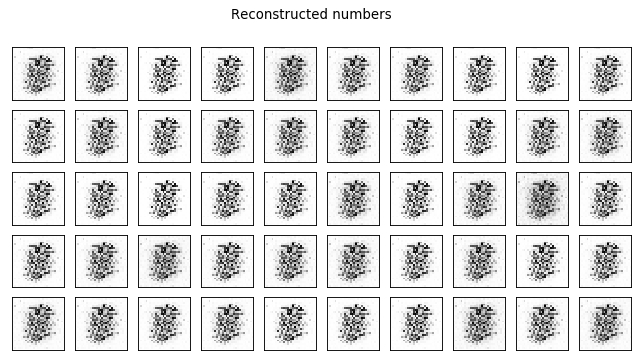

Test losses. G: 2.8916, D: 0.0901
Train Epoch: 5 [0/50000 (0%)]	Losses G: 4.2875, D: 0.1414
Train Epoch: 5 [25000/50000 (50%)]	Losses G: 1.4357, D: 0.3717
Train Epoch: 5 [50000/50000 (100%)]	Losses G: 2.9617, D: 0.1743


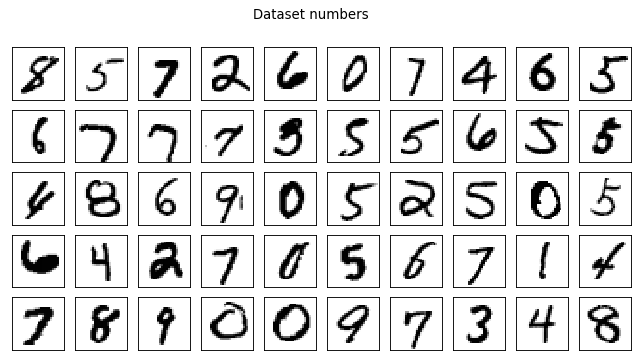

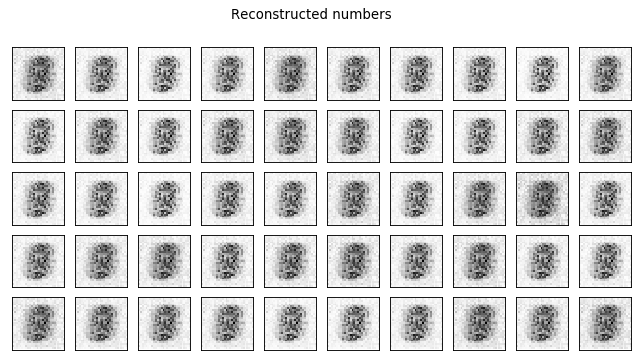

Test losses. G: 2.1121, D: 0.1497
Train Epoch: 6 [0/50000 (0%)]	Losses G: 2.5003, D: 0.2321
Train Epoch: 6 [25000/50000 (50%)]	Losses G: 3.3549, D: 0.0878
Train Epoch: 6 [50000/50000 (100%)]	Losses G: 1.7775, D: 0.3169


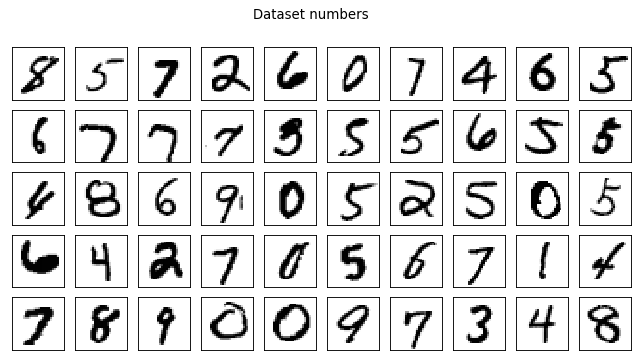

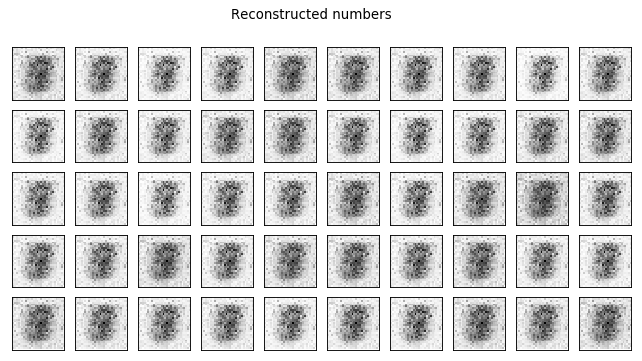

Test losses. G: 1.5105, D: 0.2145
Train Epoch: 7 [0/50000 (0%)]	Losses G: 1.7777, D: 0.2972
Train Epoch: 7 [25000/50000 (50%)]	Losses G: 4.0042, D: 0.0336
Train Epoch: 7 [50000/50000 (100%)]	Losses G: 5.3467, D: 0.0245


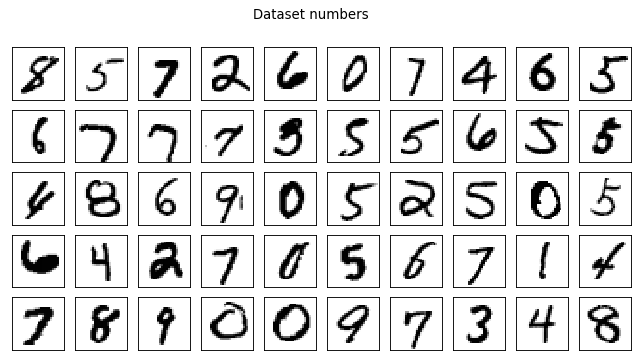

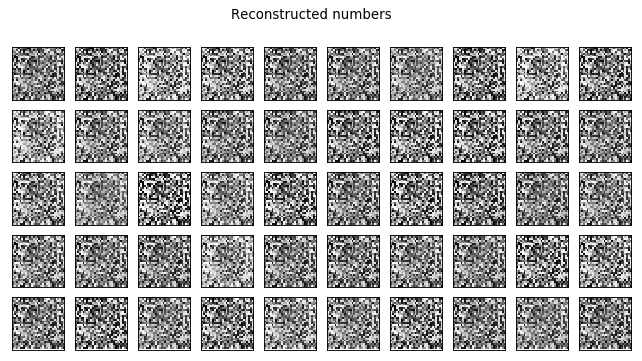

Test losses. G: 3.7270, D: 0.0144
Train Epoch: 8 [0/50000 (0%)]	Losses G: 5.3185, D: 0.0311
Train Epoch: 8 [25000/50000 (50%)]	Losses G: 4.5282, D: 0.0549
Train Epoch: 8 [50000/50000 (100%)]	Losses G: 4.0629, D: 0.0462


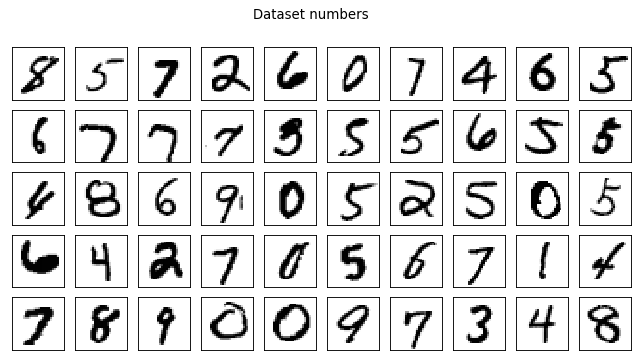

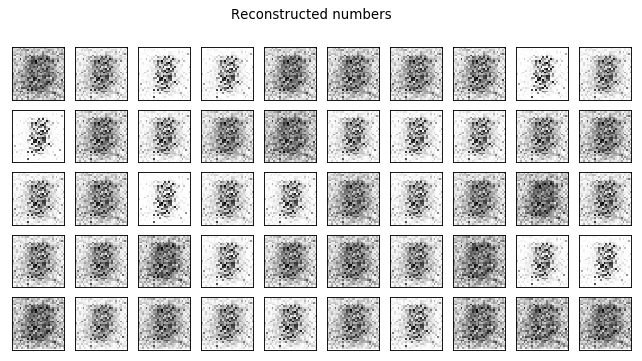

Test losses. G: 3.4856, D: 0.0272
Train Epoch: 9 [0/50000 (0%)]	Losses G: 3.7430, D: 0.0663
Train Epoch: 9 [25000/50000 (50%)]	Losses G: 5.9611, D: 0.1570
Train Epoch: 9 [50000/50000 (100%)]	Losses G: 4.8920, D: 0.0679


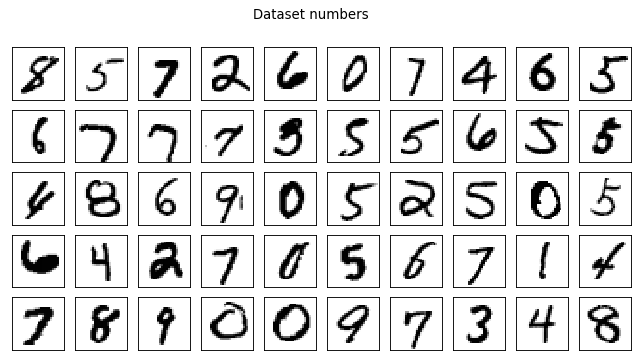

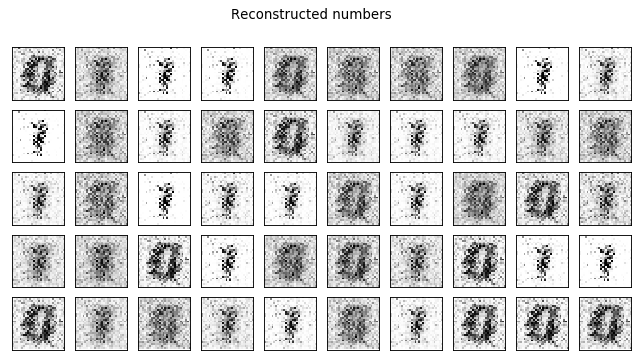

Test losses. G: 4.0862, D: 0.0226
Train Epoch: 10 [0/50000 (0%)]	Losses G: 4.8750, D: 0.0716
Train Epoch: 10 [25000/50000 (50%)]	Losses G: 5.3254, D: 0.0930
Train Epoch: 10 [50000/50000 (100%)]	Losses G: 4.6000, D: 0.1141


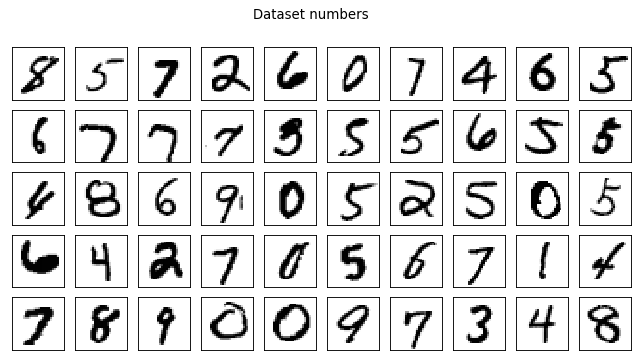

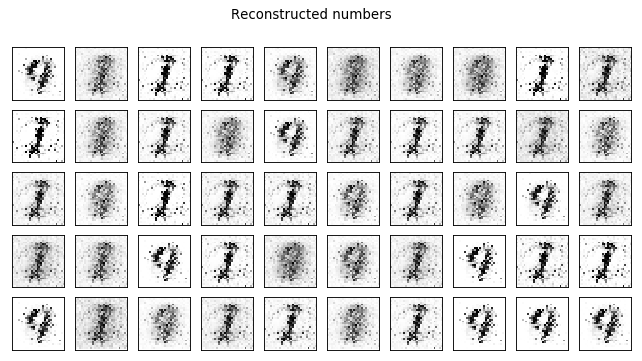

Test losses. G: 3.5040, D: 0.0463
Train Epoch: 11 [0/50000 (0%)]	Losses G: 4.9612, D: 0.1145
Train Epoch: 11 [25000/50000 (50%)]	Losses G: 4.4416, D: 0.1268
Train Epoch: 11 [50000/50000 (100%)]	Losses G: 4.3154, D: 0.1528


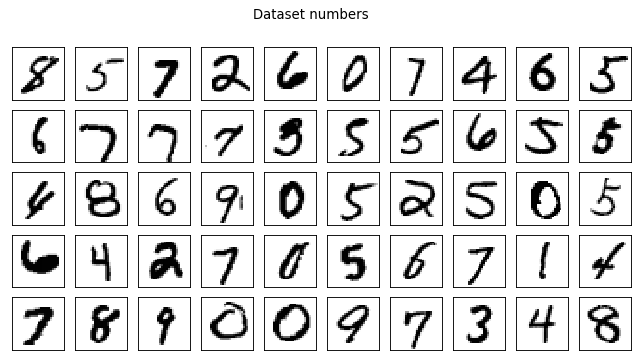

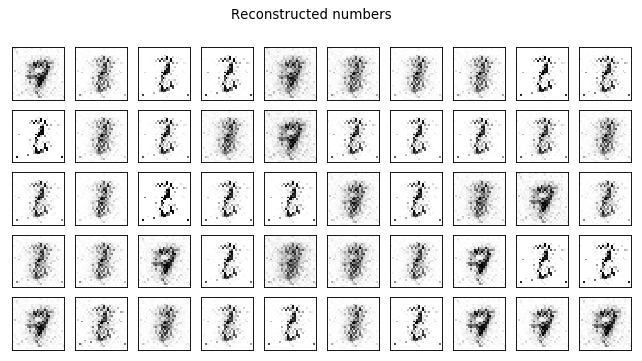

Test losses. G: 3.6012, D: 0.0705
Train Epoch: 12 [0/50000 (0%)]	Losses G: 4.1101, D: 0.2054
Train Epoch: 12 [25000/50000 (50%)]	Losses G: 4.9421, D: 0.0666
Train Epoch: 12 [50000/50000 (100%)]	Losses G: 5.8308, D: 0.0465


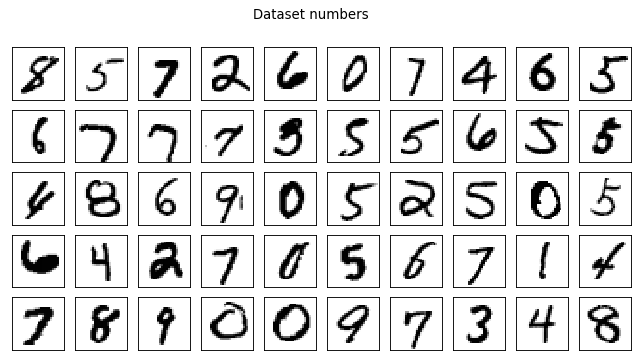

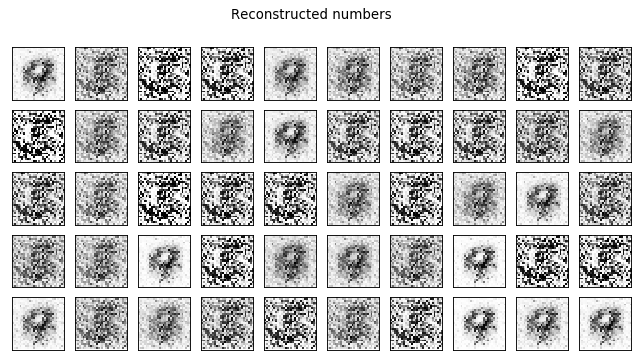

Test losses. G: 4.2778, D: 0.0116
Train Epoch: 13 [0/50000 (0%)]	Losses G: 6.2192, D: 0.0505
Train Epoch: 13 [25000/50000 (50%)]	Losses G: 6.8951, D: 0.0489
Train Epoch: 13 [50000/50000 (100%)]	Losses G: 6.2796, D: 0.1174


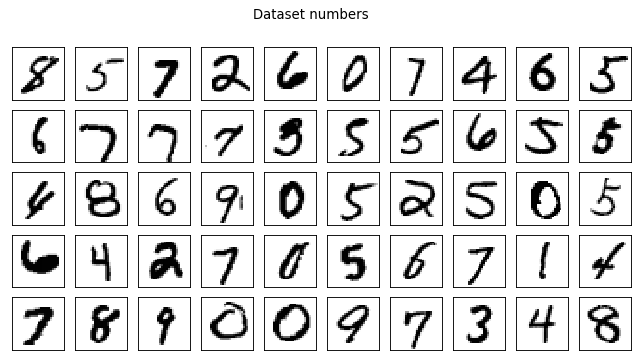

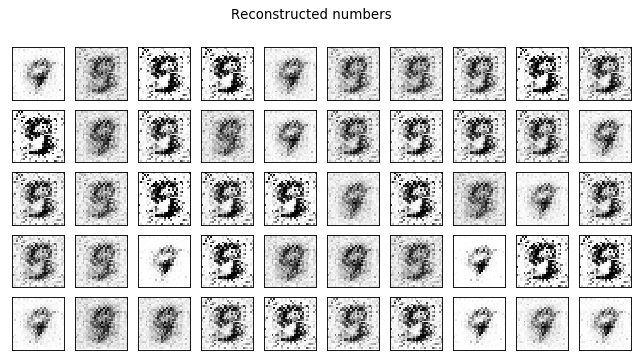

Test losses. G: 4.9406, D: 0.0208
Train Epoch: 14 [0/50000 (0%)]	Losses G: 5.3834, D: 0.0967
Train Epoch: 14 [25000/50000 (50%)]	Losses G: 6.6641, D: 0.0486
Train Epoch: 14 [50000/50000 (100%)]	Losses G: 6.1038, D: 0.0484


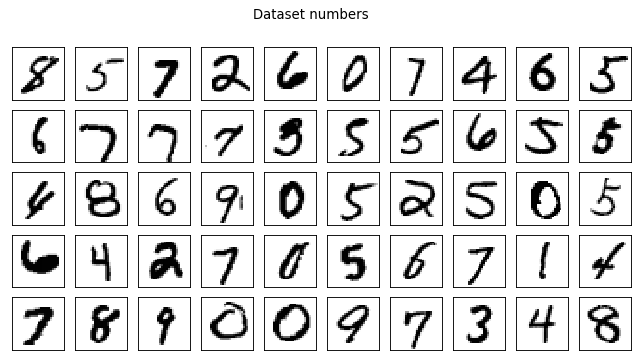

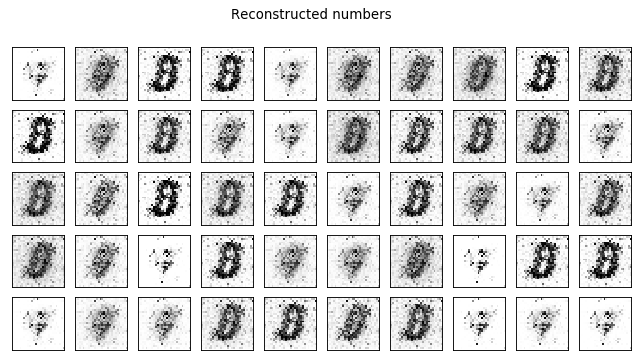

Test losses. G: 5.3742, D: 0.0129
Train Epoch: 15 [0/50000 (0%)]	Losses G: 6.2268, D: 0.0499
Train Epoch: 15 [25000/50000 (50%)]	Losses G: 5.7484, D: 0.1195
Train Epoch: 15 [50000/50000 (100%)]	Losses G: 6.5289, D: 0.0894


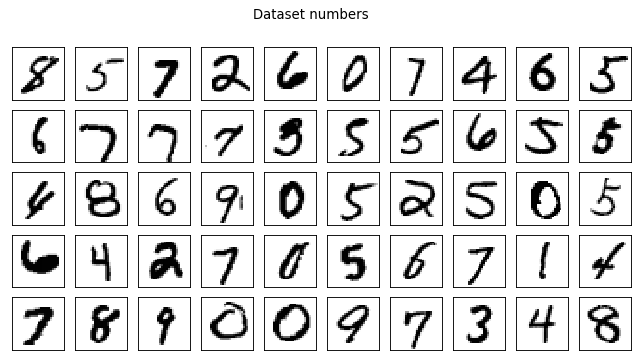

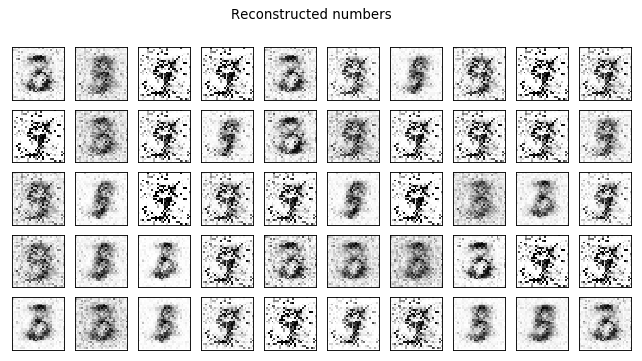

Test losses. G: 5.2123, D: 0.0110
Train Epoch: 16 [0/50000 (0%)]	Losses G: 6.2695, D: 0.0698
Train Epoch: 16 [25000/50000 (50%)]	Losses G: 5.2228, D: 0.0944
Train Epoch: 16 [50000/50000 (100%)]	Losses G: 5.8762, D: 0.0548


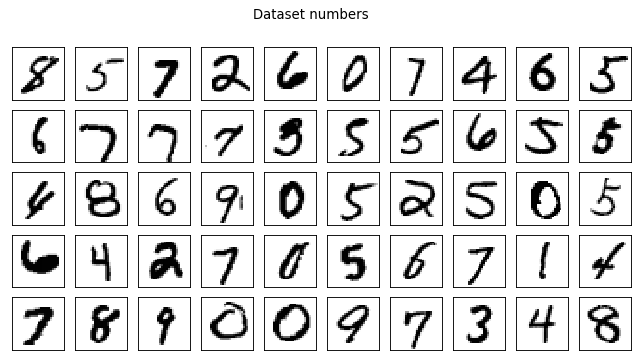

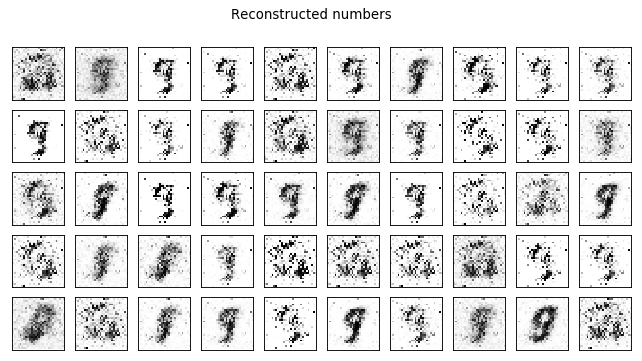

Test losses. G: 5.0897, D: 0.0189
Train Epoch: 17 [0/50000 (0%)]	Losses G: 5.8099, D: 0.0694
Train Epoch: 17 [25000/50000 (50%)]	Losses G: 6.2487, D: 0.0555
Train Epoch: 17 [50000/50000 (100%)]	Losses G: 4.9614, D: 0.0385


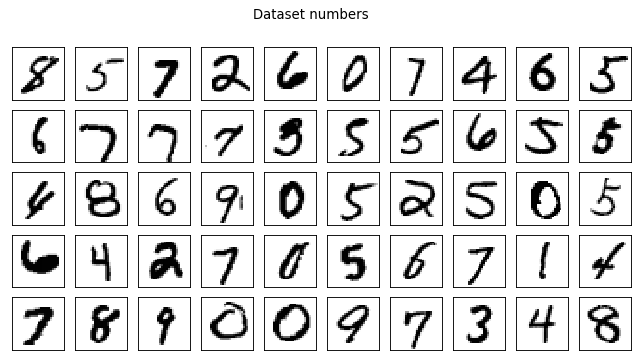

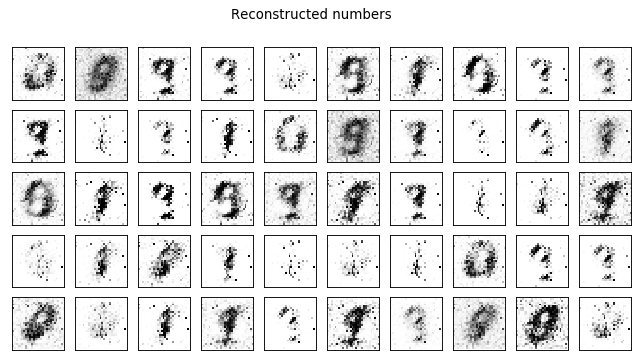

Test losses. G: 4.5352, D: 0.0126
Train Epoch: 18 [0/50000 (0%)]	Losses G: 5.1186, D: 0.0658
Train Epoch: 18 [25000/50000 (50%)]	Losses G: 5.1078, D: 0.0901
Train Epoch: 18 [50000/50000 (100%)]	Losses G: 5.7252, D: 0.1008


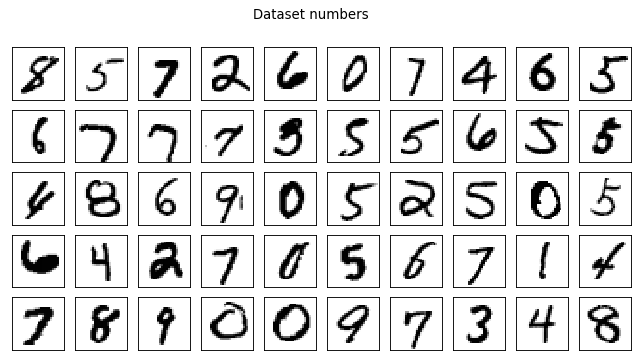

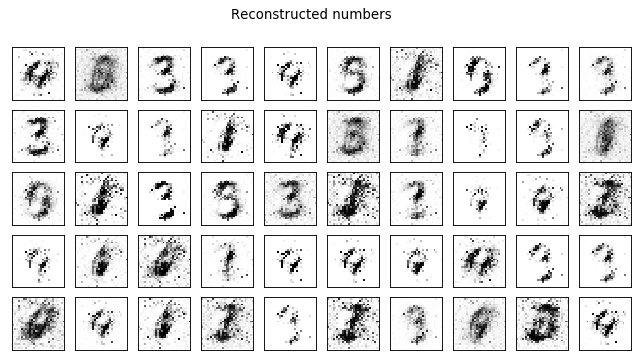

Test losses. G: 5.0141, D: 0.0339
Train Epoch: 19 [0/50000 (0%)]	Losses G: 5.4896, D: 0.1118
Train Epoch: 19 [25000/50000 (50%)]	Losses G: 6.2279, D: 0.0693
Train Epoch: 19 [50000/50000 (100%)]	Losses G: 5.8883, D: 0.0660


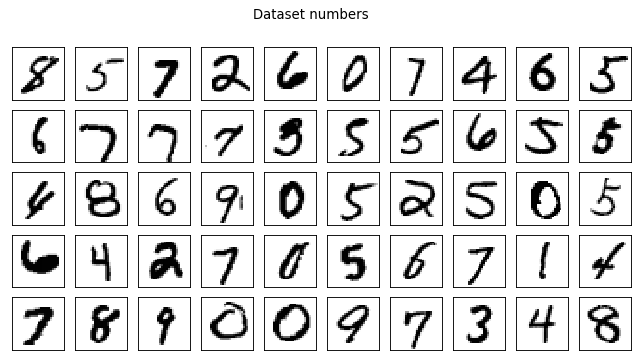

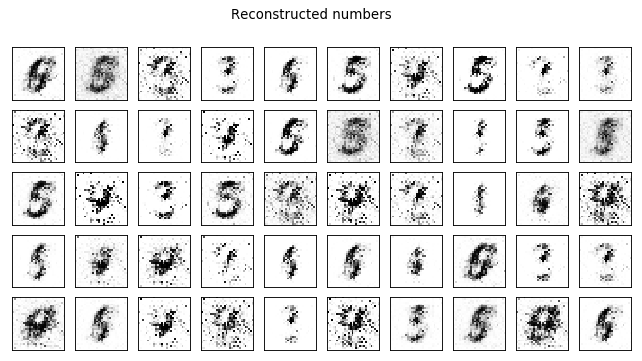

Test losses. G: 5.1811, D: 0.0171
Train Epoch: 20 [0/50000 (0%)]	Losses G: 5.8994, D: 0.0768
Train Epoch: 20 [25000/50000 (50%)]	Losses G: 6.6001, D: 0.0451
Train Epoch: 20 [50000/50000 (100%)]	Losses G: 5.7830, D: 0.0590


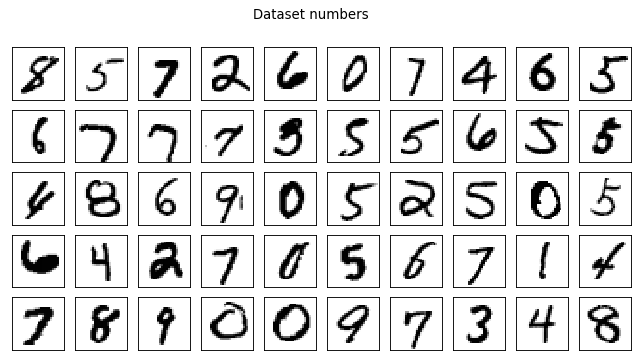

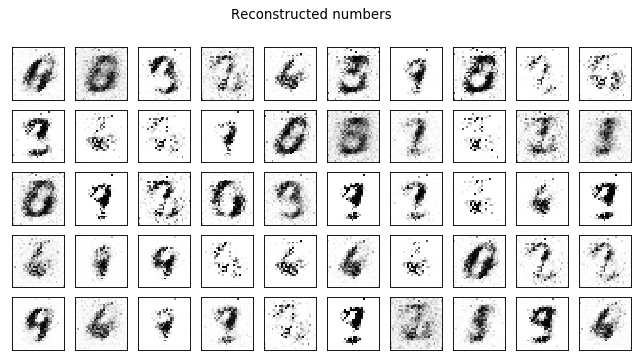

Test losses. G: 5.0454, D: 0.0239
Train Epoch: 21 [0/50000 (0%)]	Losses G: 6.8377, D: 0.1076
Train Epoch: 21 [25000/50000 (50%)]	Losses G: 4.0635, D: 0.1367
Train Epoch: 21 [50000/50000 (100%)]	Losses G: 5.6264, D: 0.0610


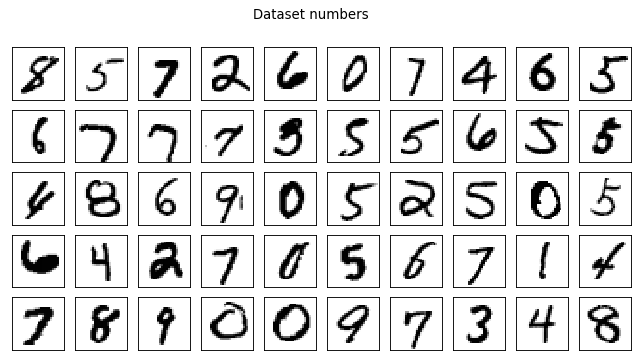

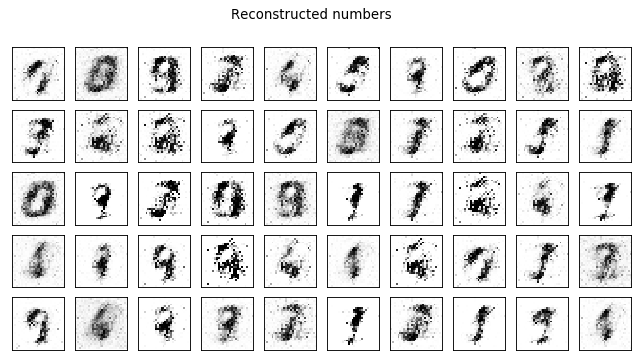

Test losses. G: 4.9410, D: 0.0183
Train Epoch: 22 [0/50000 (0%)]	Losses G: 5.5469, D: 0.1027
Train Epoch: 22 [25000/50000 (50%)]	Losses G: 6.5001, D: 0.1104
Train Epoch: 22 [50000/50000 (100%)]	Losses G: 6.3375, D: 0.1474


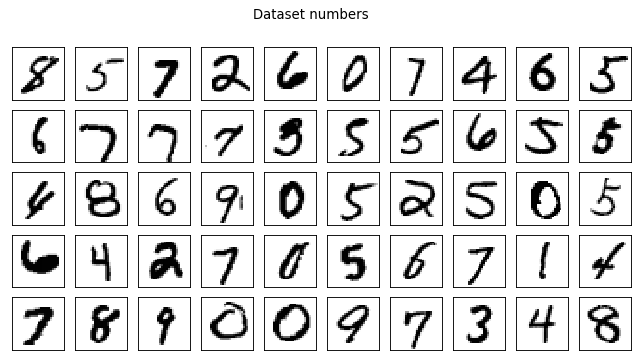

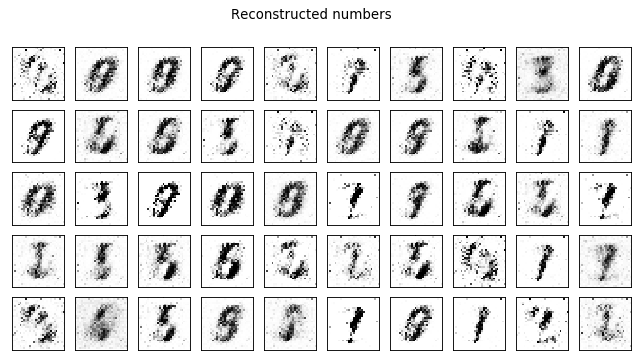

Test losses. G: 5.5311, D: 0.0494
Train Epoch: 23 [0/50000 (0%)]	Losses G: 4.8852, D: 0.1170
Train Epoch: 23 [25000/50000 (50%)]	Losses G: 6.8826, D: 0.1242
Train Epoch: 23 [50000/50000 (100%)]	Losses G: 5.7817, D: 0.0893


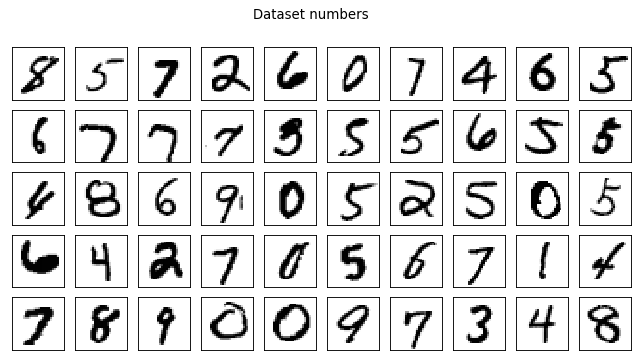

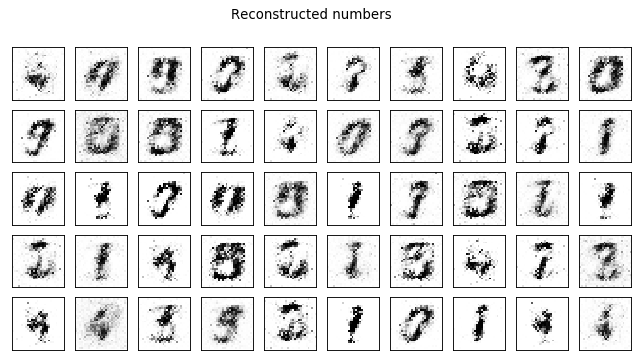

Test losses. G: 5.1432, D: 0.0229
Train Epoch: 24 [0/50000 (0%)]	Losses G: 5.8199, D: 0.0780
Train Epoch: 24 [25000/50000 (50%)]	Losses G: 5.6445, D: 0.0683
Train Epoch: 24 [50000/50000 (100%)]	Losses G: 5.2133, D: 0.0689


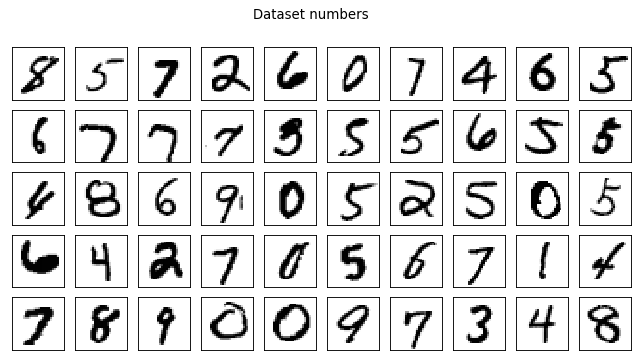

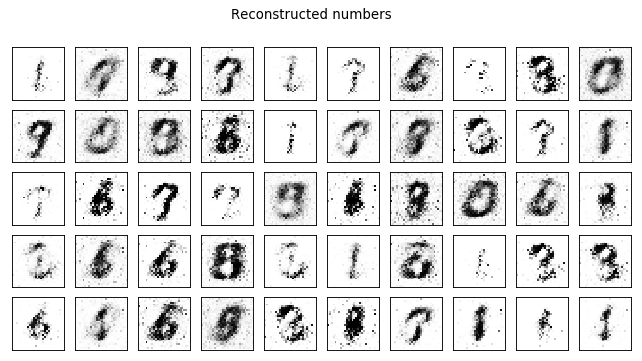

Test losses. G: 4.7835, D: 0.0241
Train Epoch: 25 [0/50000 (0%)]	Losses G: 5.0468, D: 0.0678
Train Epoch: 25 [25000/50000 (50%)]	Losses G: 6.3854, D: 0.0863
Train Epoch: 25 [50000/50000 (100%)]	Losses G: 4.0143, D: 0.0860


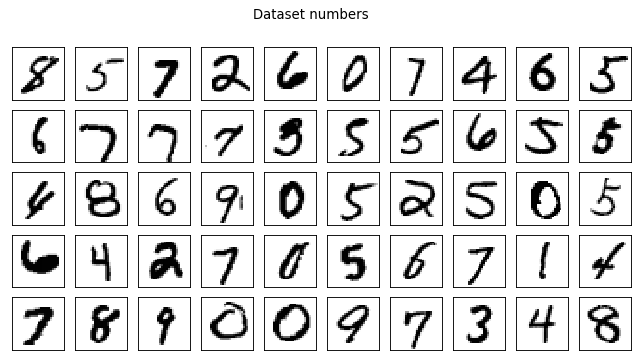

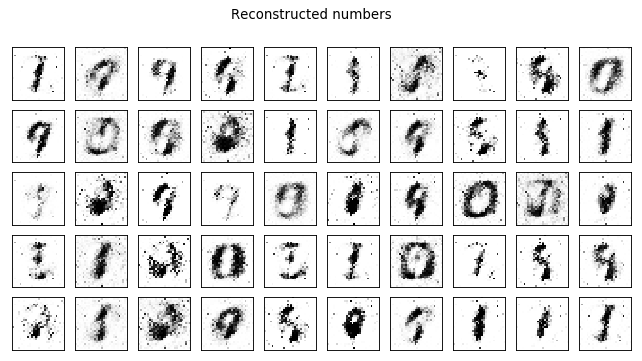

Test losses. G: 3.4015, D: 0.0484
Train Epoch: 26 [0/50000 (0%)]	Losses G: 5.1096, D: 0.1782
Train Epoch: 26 [25000/50000 (50%)]	Losses G: 5.6503, D: 0.0638
Train Epoch: 26 [50000/50000 (100%)]	Losses G: 6.2521, D: 0.0844


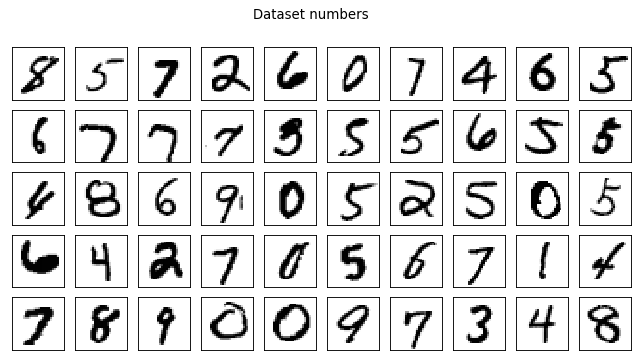

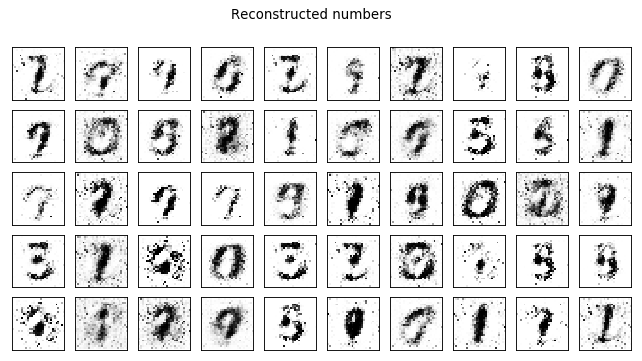

Test losses. G: 5.7378, D: 0.0254
Train Epoch: 27 [0/50000 (0%)]	Losses G: 6.1124, D: 0.0586
Train Epoch: 27 [25000/50000 (50%)]	Losses G: 7.1141, D: 0.0753
Train Epoch: 27 [50000/50000 (100%)]	Losses G: 5.5922, D: 0.1084


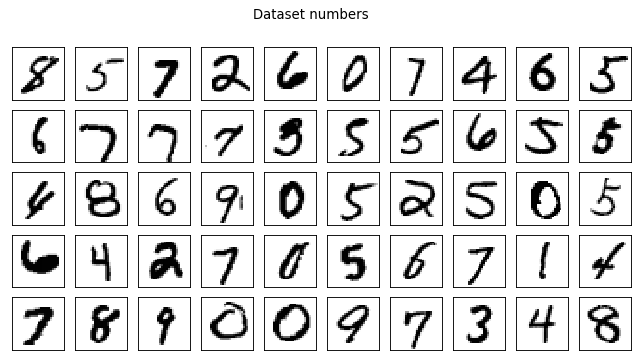

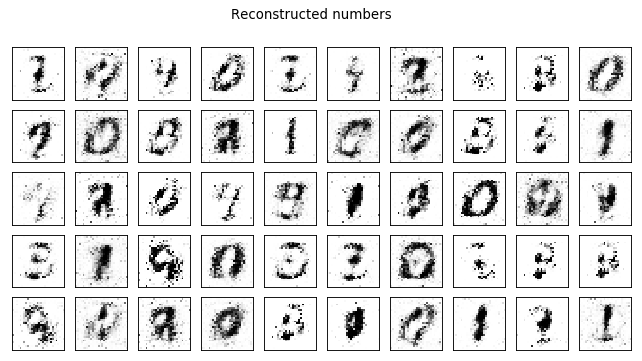

Test losses. G: 4.8654, D: 0.0275
Train Epoch: 28 [0/50000 (0%)]	Losses G: 6.3593, D: 0.0819
Train Epoch: 28 [25000/50000 (50%)]	Losses G: 5.9754, D: 0.1508
Train Epoch: 28 [50000/50000 (100%)]	Losses G: 5.7498, D: 0.0914


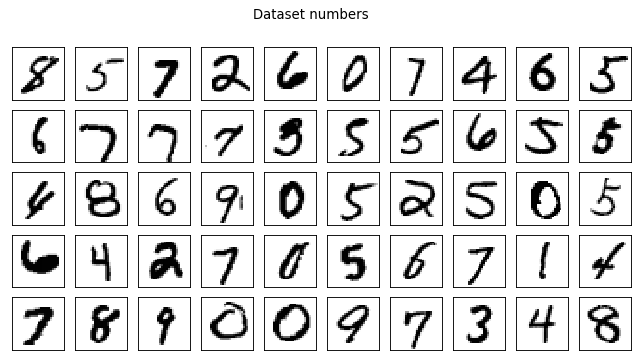

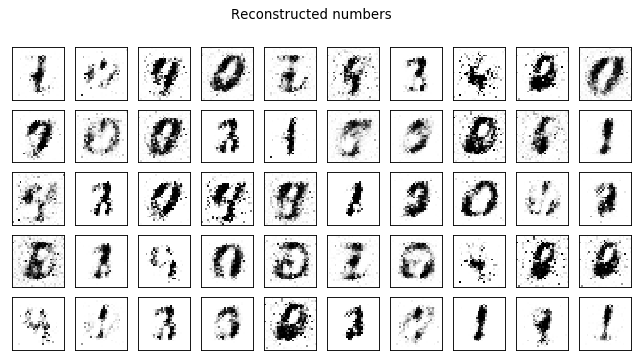

Test losses. G: 5.0024, D: 0.0298
Train Epoch: 29 [0/50000 (0%)]	Losses G: 4.7305, D: 0.0863
Train Epoch: 29 [25000/50000 (50%)]	Losses G: 5.7560, D: 0.0682
Train Epoch: 29 [50000/50000 (100%)]	Losses G: 5.8658, D: 0.0896


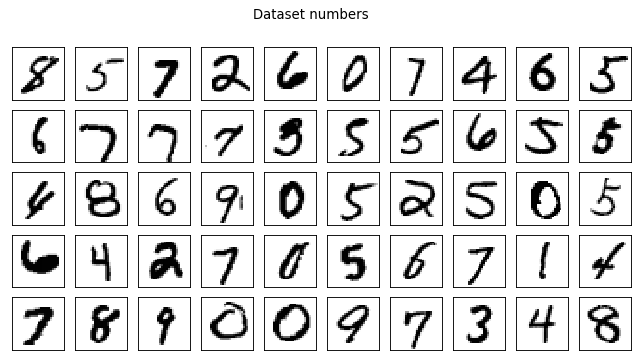

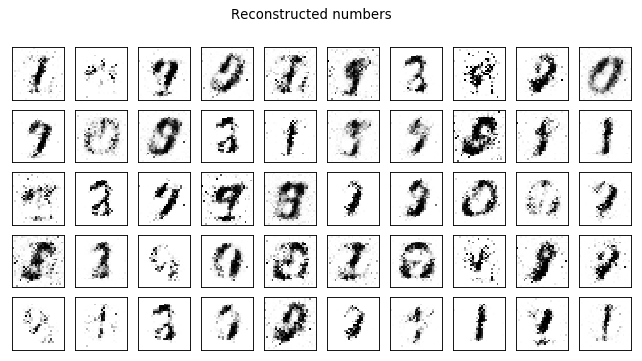

Test losses. G: 5.2900, D: 0.0269
Train Epoch: 30 [0/50000 (0%)]	Losses G: 6.5729, D: 0.0601
Train Epoch: 30 [25000/50000 (50%)]	Losses G: 5.3452, D: 0.0893
Train Epoch: 30 [50000/50000 (100%)]	Losses G: 4.9077, D: 0.0917


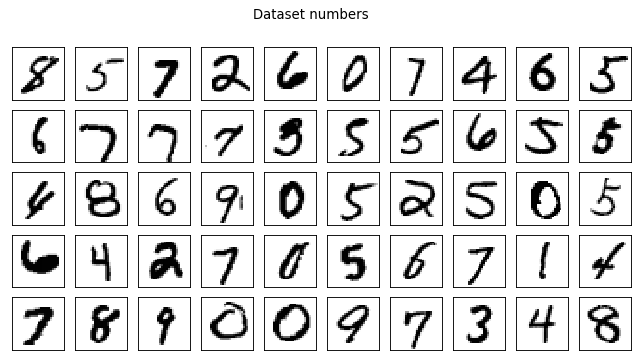

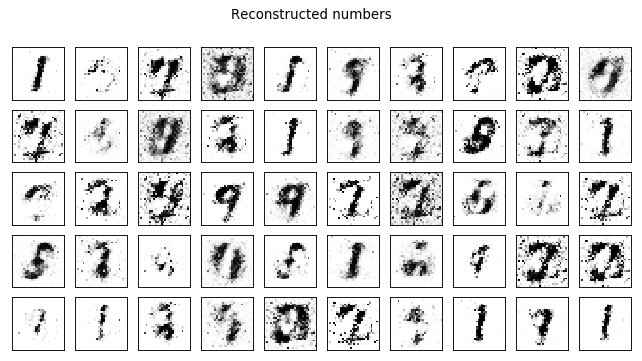

Test losses. G: 4.1907, D: 0.0484
Train Epoch: 31 [0/50000 (0%)]	Losses G: 5.0664, D: 0.0849
Train Epoch: 31 [25000/50000 (50%)]	Losses G: 6.4872, D: 0.1004
Train Epoch: 31 [50000/50000 (100%)]	Losses G: 4.0782, D: 0.1028


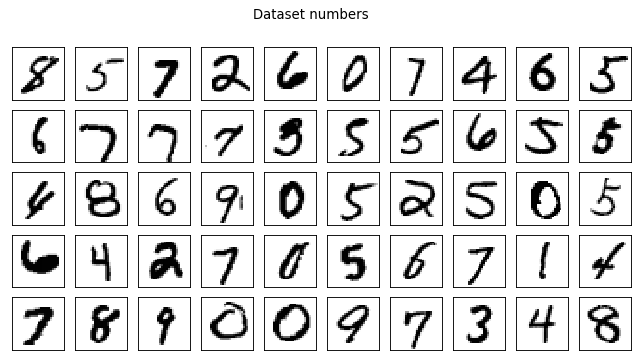

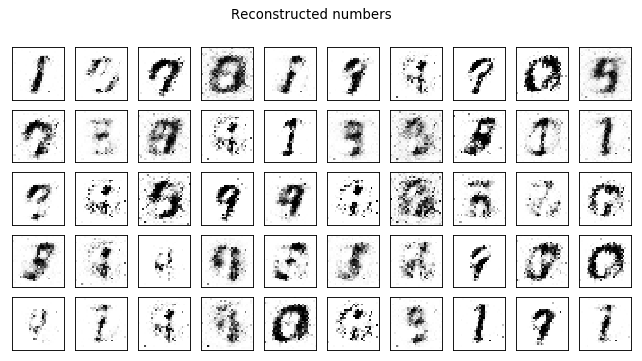

Test losses. G: 3.5439, D: 0.0472
Train Epoch: 32 [0/50000 (0%)]	Losses G: 4.6060, D: 0.1366
Train Epoch: 32 [25000/50000 (50%)]	Losses G: 4.9419, D: 0.0970
Train Epoch: 32 [50000/50000 (100%)]	Losses G: 5.4303, D: 0.0913


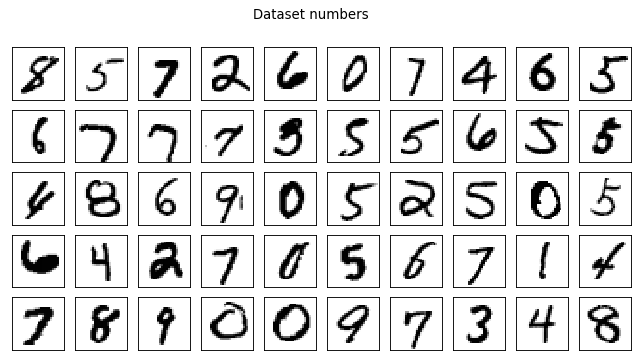

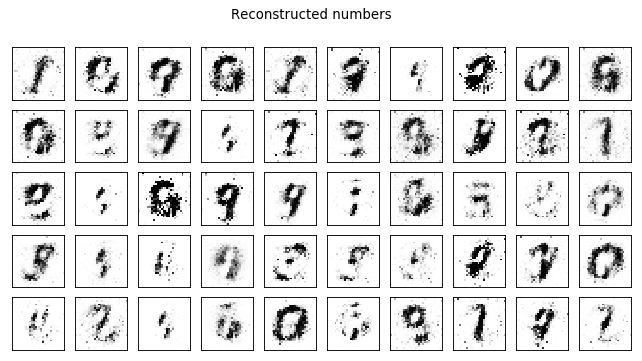

Test losses. G: 4.6073, D: 0.0414
Train Epoch: 33 [0/50000 (0%)]	Losses G: 4.6885, D: 0.1180
Train Epoch: 33 [25000/50000 (50%)]	Losses G: 5.5450, D: 0.1134
Train Epoch: 33 [50000/50000 (100%)]	Losses G: 4.5550, D: 0.1492


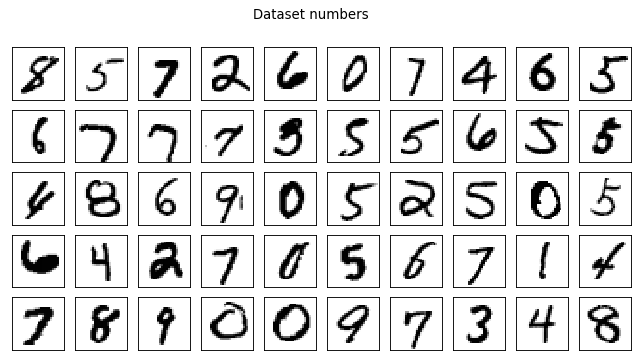

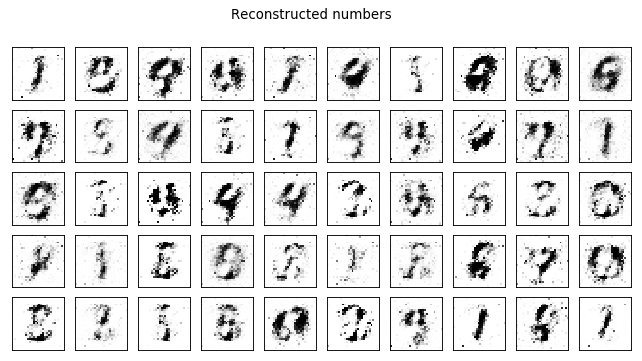

Test losses. G: 3.8685, D: 0.0594
Train Epoch: 34 [0/50000 (0%)]	Losses G: 4.0750, D: 0.1400
Train Epoch: 34 [25000/50000 (50%)]	Losses G: 5.4555, D: 0.0706
Train Epoch: 34 [50000/50000 (100%)]	Losses G: 5.3326, D: 0.1093


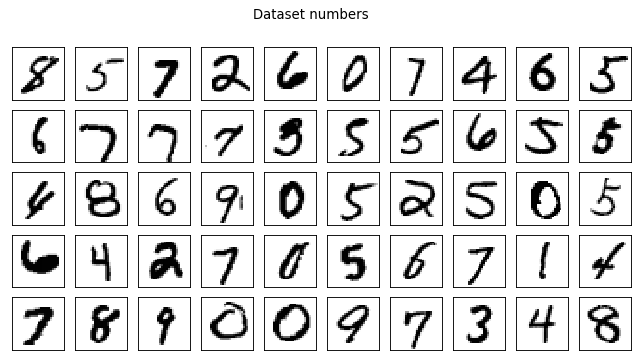

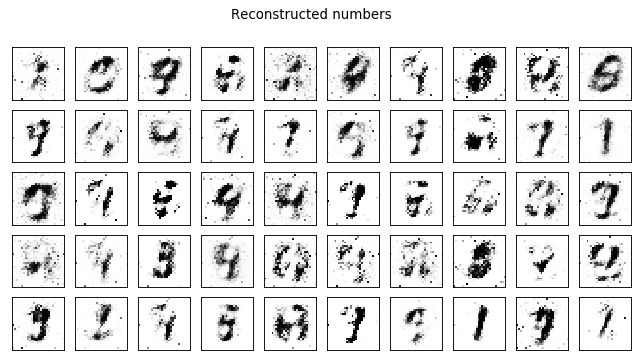

Test losses. G: 4.6568, D: 0.0745
Train Epoch: 35 [0/50000 (0%)]	Losses G: 4.4808, D: 0.1667
Train Epoch: 35 [25000/50000 (50%)]	Losses G: 4.4819, D: 0.1438
Train Epoch: 35 [50000/50000 (100%)]	Losses G: 4.5235, D: 0.1261


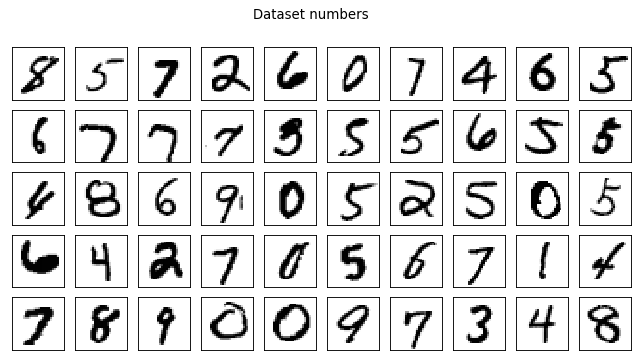

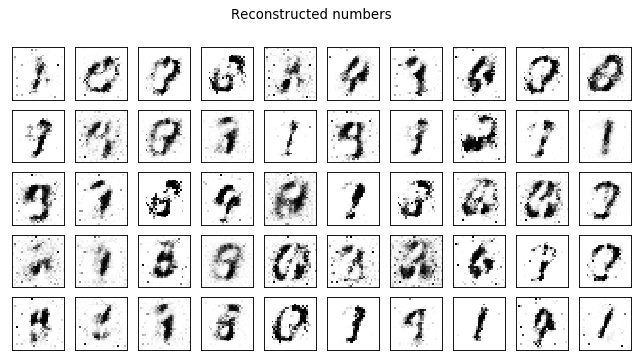

Test losses. G: 4.0510, D: 0.0493
Train Epoch: 36 [0/50000 (0%)]	Losses G: 3.3559, D: 0.0965
Train Epoch: 36 [25000/50000 (50%)]	Losses G: 3.3000, D: 0.1434
Train Epoch: 36 [50000/50000 (100%)]	Losses G: 4.8365, D: 0.1402


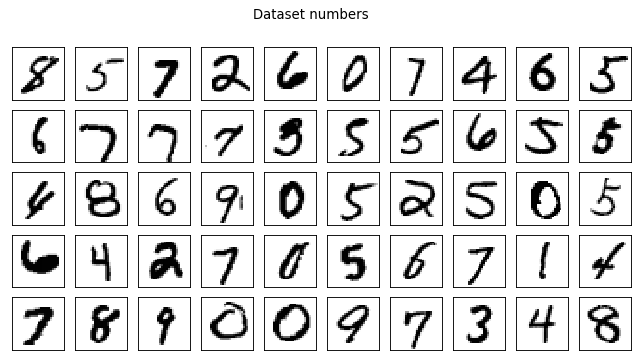

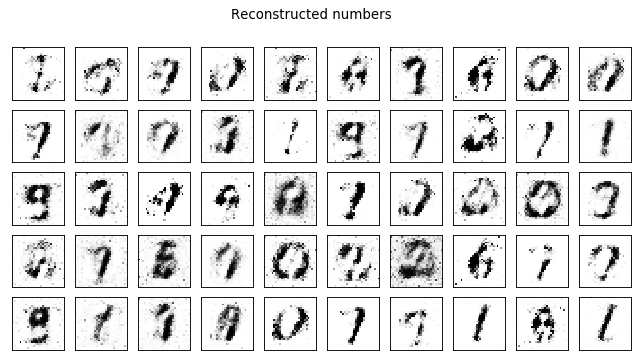

Test losses. G: 4.1111, D: 0.0770
Train Epoch: 37 [0/50000 (0%)]	Losses G: 4.0204, D: 0.1158
Train Epoch: 37 [25000/50000 (50%)]	Losses G: 3.0699, D: 0.2752
Train Epoch: 37 [50000/50000 (100%)]	Losses G: 5.0591, D: 0.1408


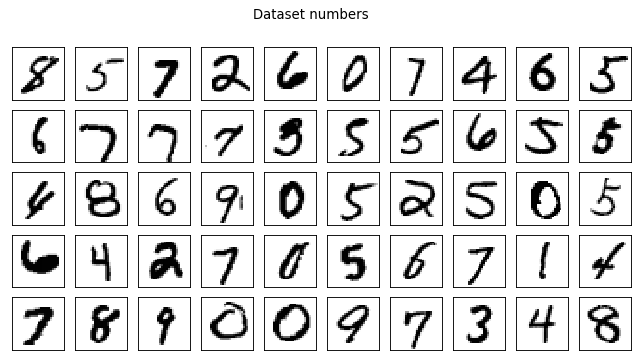

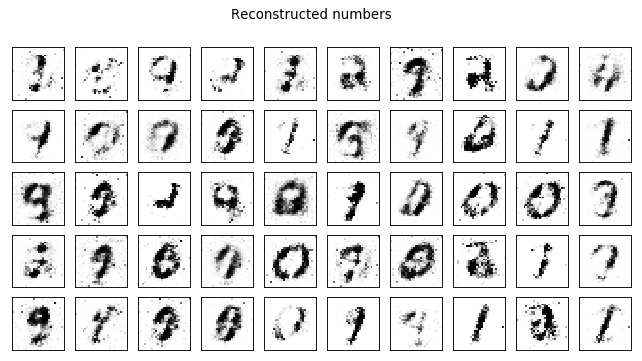

Test losses. G: 4.5645, D: 0.0782
Train Epoch: 38 [0/50000 (0%)]	Losses G: 4.8733, D: 0.1709
Train Epoch: 38 [25000/50000 (50%)]	Losses G: 5.0550, D: 0.1409
Train Epoch: 38 [50000/50000 (100%)]	Losses G: 3.5097, D: 0.1090


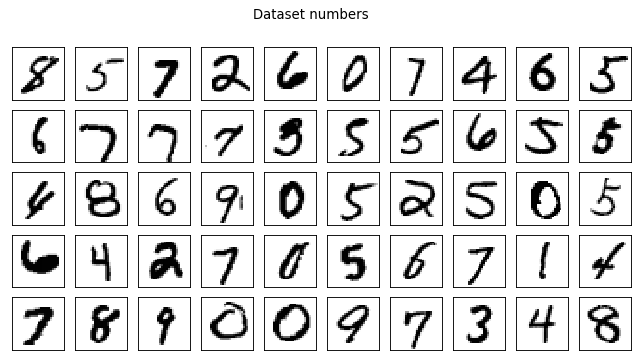

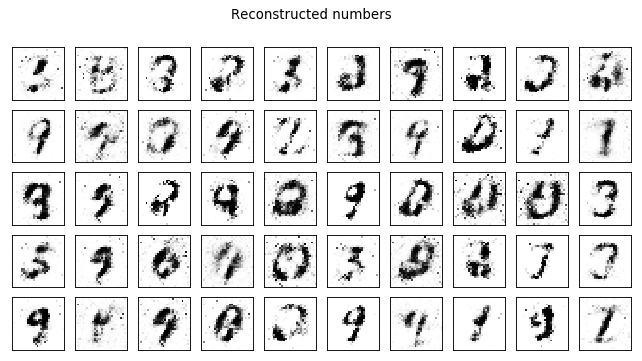

Test losses. G: 3.2836, D: 0.0670
Train Epoch: 39 [0/50000 (0%)]	Losses G: 4.2262, D: 0.1278
Train Epoch: 39 [25000/50000 (50%)]	Losses G: 4.4775, D: 0.1594
Train Epoch: 39 [50000/50000 (100%)]	Losses G: 3.6386, D: 0.1324


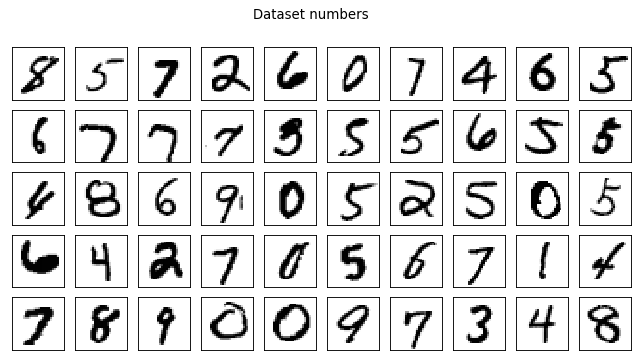

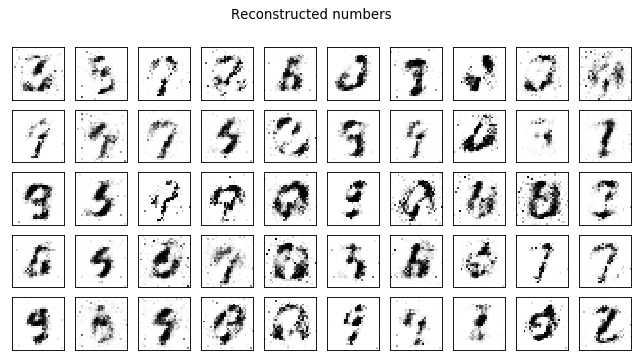

Test losses. G: 3.2009, D: 0.0802
Train Epoch: 40 [0/50000 (0%)]	Losses G: 3.8562, D: 0.1415
Train Epoch: 40 [25000/50000 (50%)]	Losses G: 4.5899, D: 0.1798
Train Epoch: 40 [50000/50000 (100%)]	Losses G: 4.2674, D: 0.2053


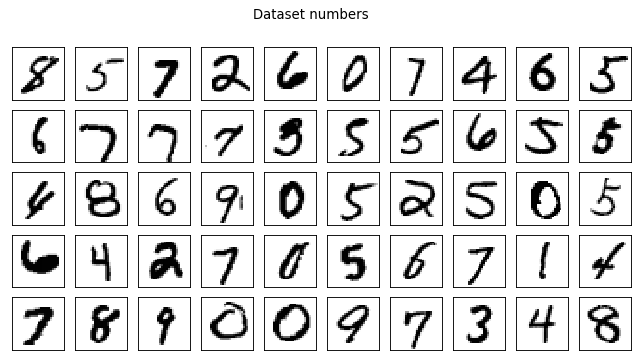

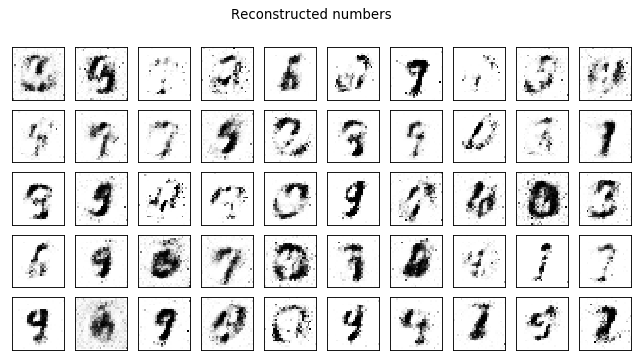

Test losses. G: 3.6507, D: 0.1053
Train Epoch: 41 [0/50000 (0%)]	Losses G: 3.6897, D: 0.2033
Train Epoch: 41 [25000/50000 (50%)]	Losses G: 3.5287, D: 0.1929
Train Epoch: 41 [50000/50000 (100%)]	Losses G: 3.0998, D: 0.2294


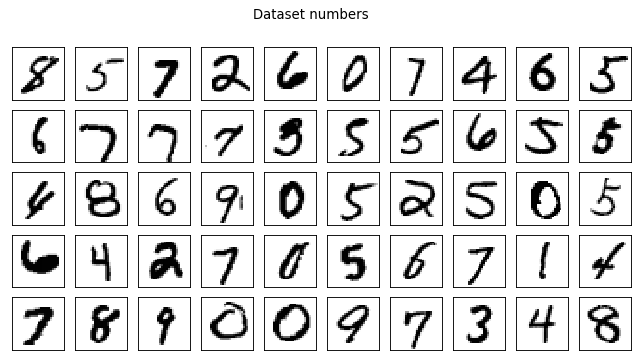

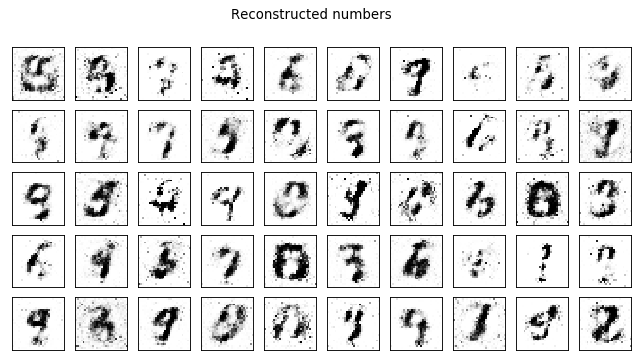

Test losses. G: 2.6076, D: 0.1507
Train Epoch: 42 [0/50000 (0%)]	Losses G: 2.8745, D: 0.2311
Train Epoch: 42 [25000/50000 (50%)]	Losses G: 4.3038, D: 0.1435
Train Epoch: 42 [50000/50000 (100%)]	Losses G: 3.4201, D: 0.1507


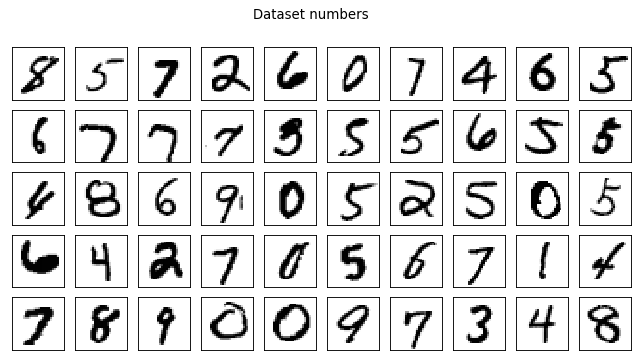

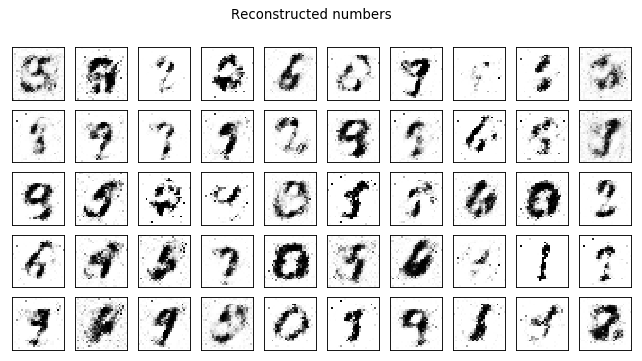

Test losses. G: 2.9805, D: 0.0961
Train Epoch: 43 [0/50000 (0%)]	Losses G: 3.8449, D: 0.1442
Train Epoch: 43 [25000/50000 (50%)]	Losses G: 4.3361, D: 0.1240
Train Epoch: 43 [50000/50000 (100%)]	Losses G: 3.2893, D: 0.2950


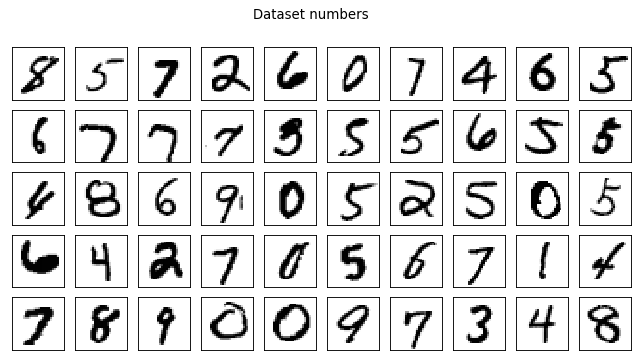

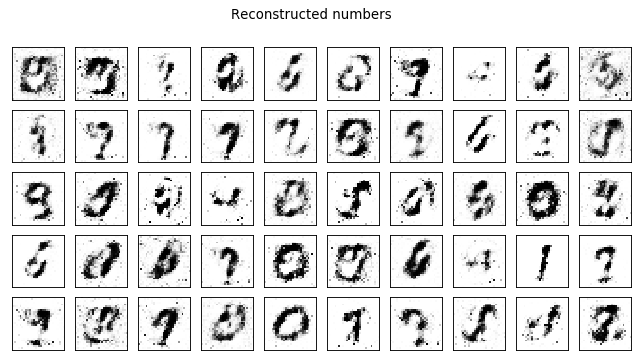

Test losses. G: 2.8892, D: 0.1518
Train Epoch: 44 [0/50000 (0%)]	Losses G: 2.7647, D: 0.3206
Train Epoch: 44 [25000/50000 (50%)]	Losses G: 4.0687, D: 0.2033
Train Epoch: 44 [50000/50000 (100%)]	Losses G: 3.3108, D: 0.1639


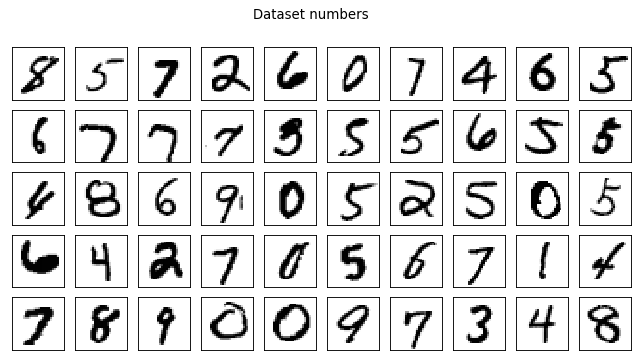

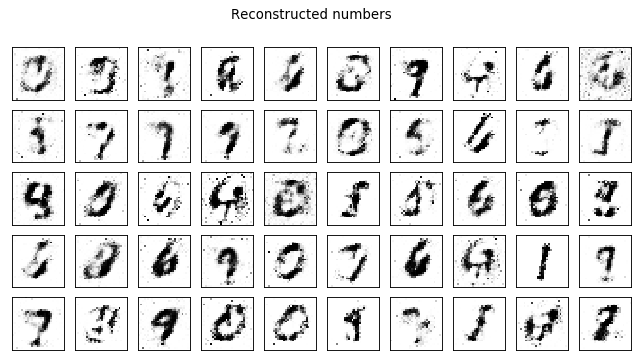

Test losses. G: 2.8437, D: 0.0959
Train Epoch: 45 [0/50000 (0%)]	Losses G: 3.0727, D: 0.1256
Train Epoch: 45 [25000/50000 (50%)]	Losses G: 2.8827, D: 0.2672
Train Epoch: 45 [50000/50000 (100%)]	Losses G: 3.6753, D: 0.2139


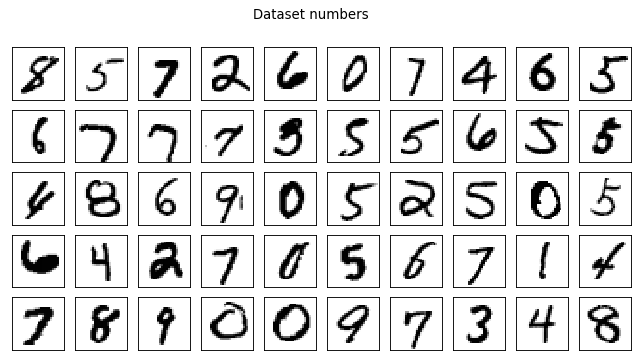

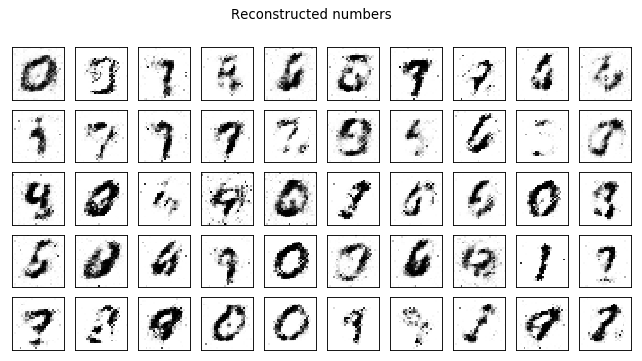

Test losses. G: 3.5424, D: 0.1099
Train Epoch: 46 [0/50000 (0%)]	Losses G: 3.4333, D: 0.2427
Train Epoch: 46 [25000/50000 (50%)]	Losses G: 3.8787, D: 0.1904
Train Epoch: 46 [50000/50000 (100%)]	Losses G: 2.6888, D: 0.2254


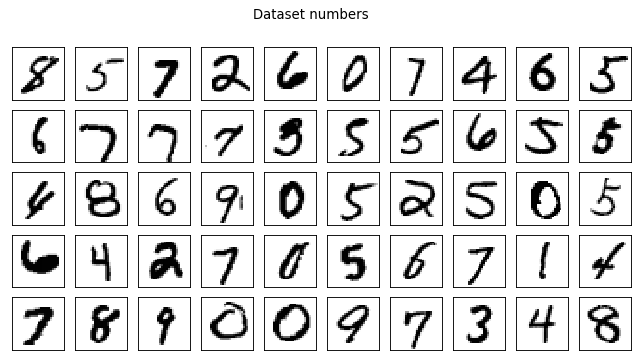

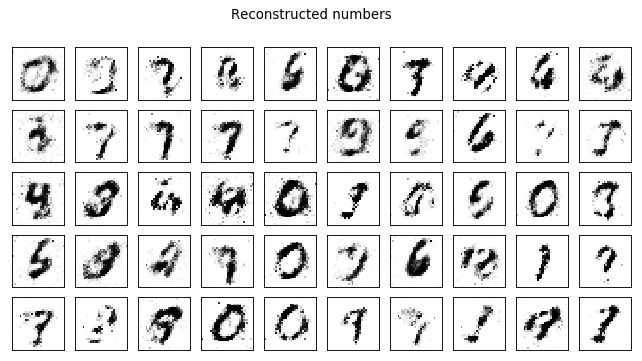

Test losses. G: 2.1840, D: 0.1729
Train Epoch: 47 [0/50000 (0%)]	Losses G: 2.4563, D: 0.2427
Train Epoch: 47 [25000/50000 (50%)]	Losses G: 3.8728, D: 0.2056
Train Epoch: 47 [50000/50000 (100%)]	Losses G: 3.1587, D: 0.1569


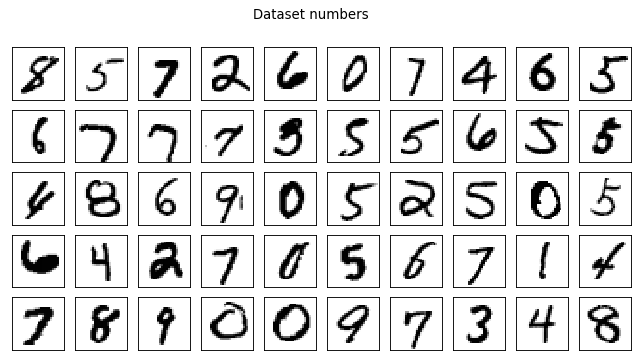

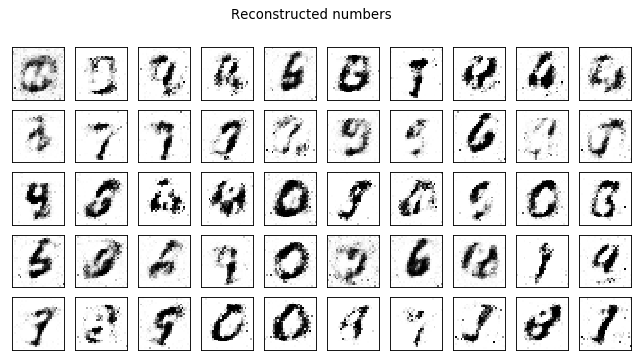

Test losses. G: 2.8402, D: 0.1001
Train Epoch: 48 [0/50000 (0%)]	Losses G: 3.0483, D: 0.1885
Train Epoch: 48 [25000/50000 (50%)]	Losses G: 3.4733, D: 0.1784
Train Epoch: 48 [50000/50000 (100%)]	Losses G: 3.4404, D: 0.1959


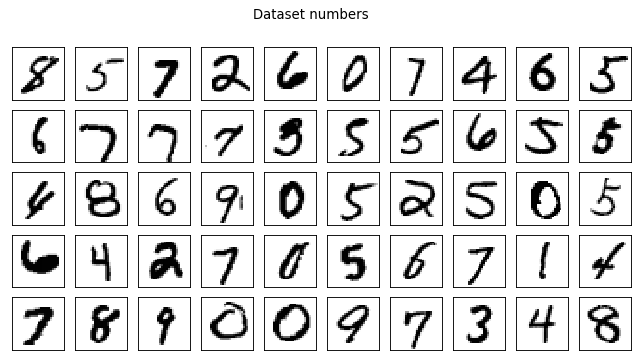

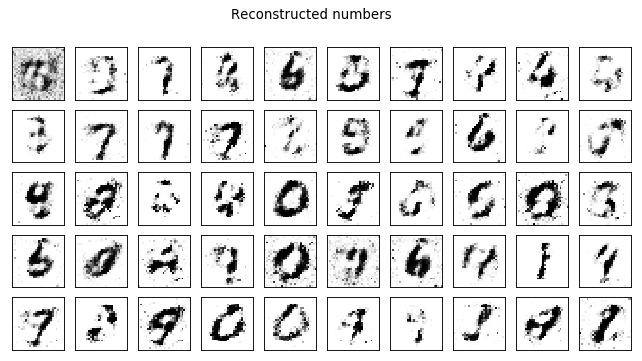

Test losses. G: 3.1585, D: 0.0894
Train Epoch: 49 [0/50000 (0%)]	Losses G: 3.2959, D: 0.1431
Train Epoch: 49 [25000/50000 (50%)]	Losses G: 3.8812, D: 0.1815
Train Epoch: 49 [50000/50000 (100%)]	Losses G: 3.5503, D: 0.1736


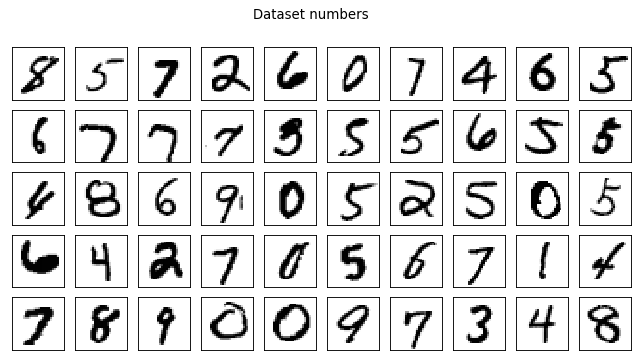

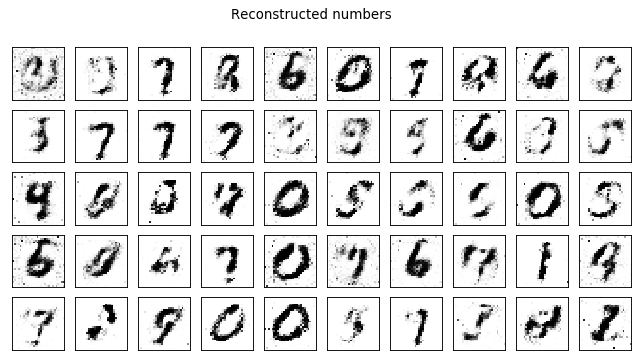

Test losses. G: 3.2789, D: 0.1160
Train Epoch: 50 [0/50000 (0%)]	Losses G: 3.5753, D: 0.1856
Train Epoch: 50 [25000/50000 (50%)]	Losses G: 3.2725, D: 0.1629
Train Epoch: 50 [50000/50000 (100%)]	Losses G: 3.2410, D: 0.2242


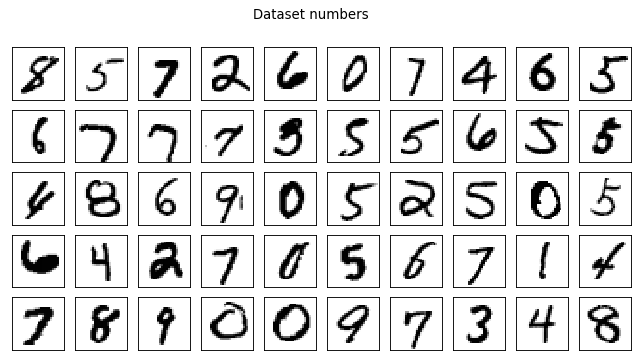

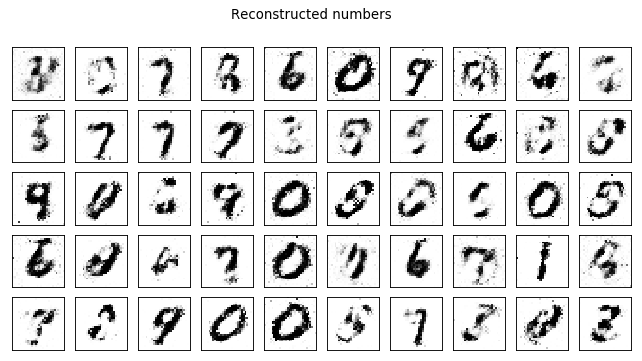

Test losses. G: 2.9944, D: 0.1256
Train Epoch: 51 [0/50000 (0%)]	Losses G: 2.6469, D: 0.2006
Train Epoch: 51 [25000/50000 (50%)]	Losses G: 3.1211, D: 0.2275
Train Epoch: 51 [50000/50000 (100%)]	Losses G: 2.8411, D: 0.2360


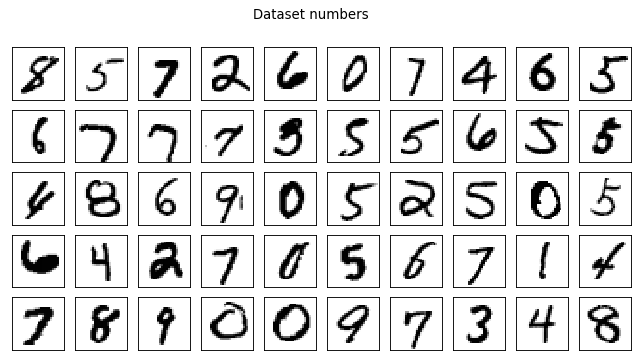

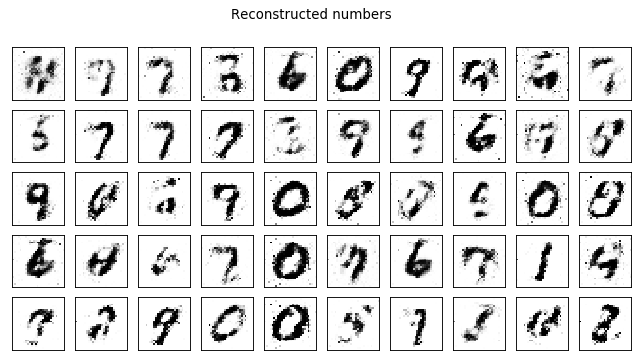

Test losses. G: 2.4801, D: 0.1624
Train Epoch: 52 [0/50000 (0%)]	Losses G: 2.8416, D: 0.2430
Train Epoch: 52 [25000/50000 (50%)]	Losses G: 2.9037, D: 0.2549
Train Epoch: 52 [50000/50000 (100%)]	Losses G: 2.6998, D: 0.2872


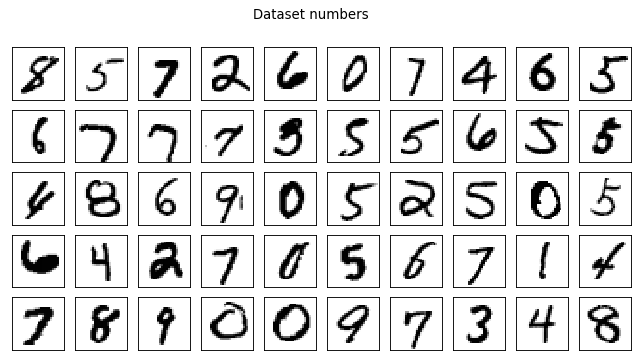

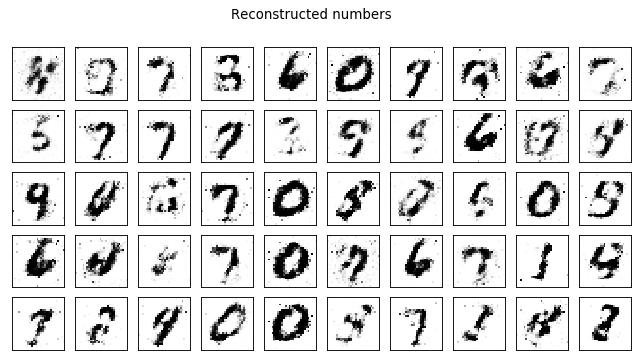

Test losses. G: 2.3100, D: 0.1822
Train Epoch: 53 [0/50000 (0%)]	Losses G: 2.8165, D: 0.2482
Train Epoch: 53 [25000/50000 (50%)]	Losses G: 3.5300, D: 0.2257
Train Epoch: 53 [50000/50000 (100%)]	Losses G: 2.0600, D: 0.2391


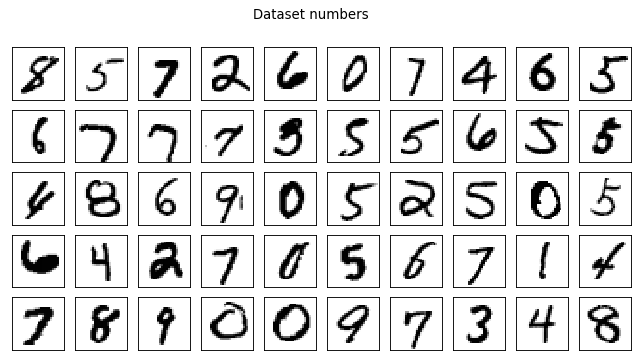

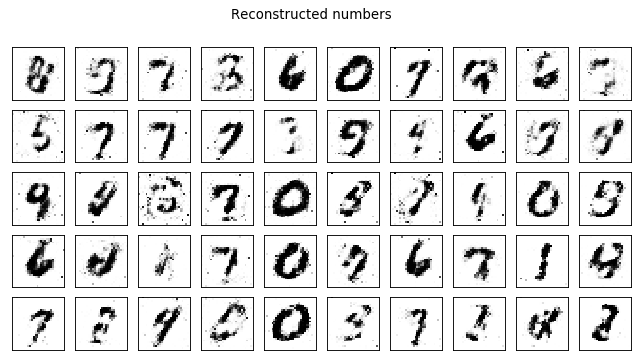

Test losses. G: 1.9527, D: 0.1815
Train Epoch: 54 [0/50000 (0%)]	Losses G: 2.3763, D: 0.2843
Train Epoch: 54 [25000/50000 (50%)]	Losses G: 2.5585, D: 0.2977
Train Epoch: 54 [50000/50000 (100%)]	Losses G: 2.9029, D: 0.3172


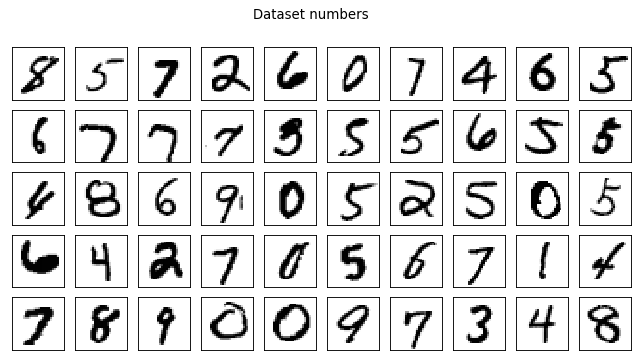

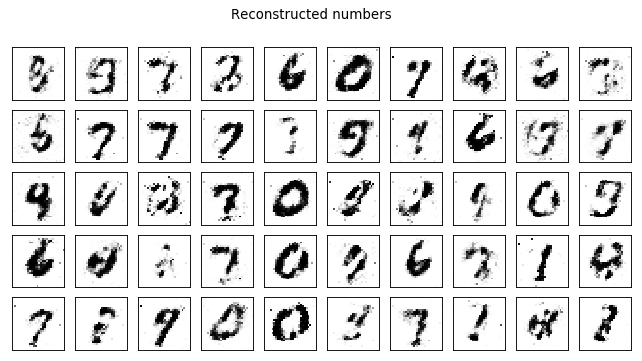

Test losses. G: 2.7784, D: 0.1917
Train Epoch: 55 [0/50000 (0%)]	Losses G: 2.5535, D: 0.3203
Train Epoch: 55 [25000/50000 (50%)]	Losses G: 2.5358, D: 0.2856
Train Epoch: 55 [50000/50000 (100%)]	Losses G: 2.5900, D: 0.3161


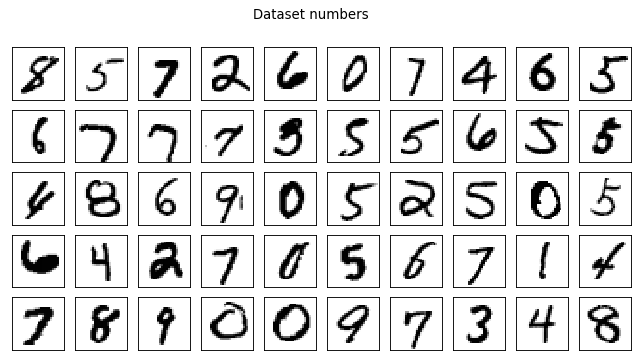

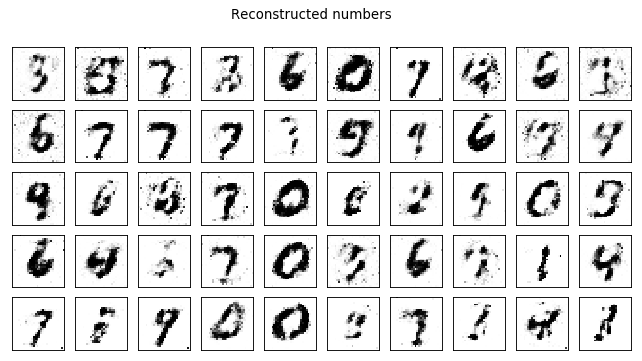

Test losses. G: 2.4632, D: 0.2002
Train Epoch: 56 [0/50000 (0%)]	Losses G: 2.5263, D: 0.2865
Train Epoch: 56 [25000/50000 (50%)]	Losses G: 2.4326, D: 0.2513
Train Epoch: 56 [50000/50000 (100%)]	Losses G: 2.8368, D: 0.1861


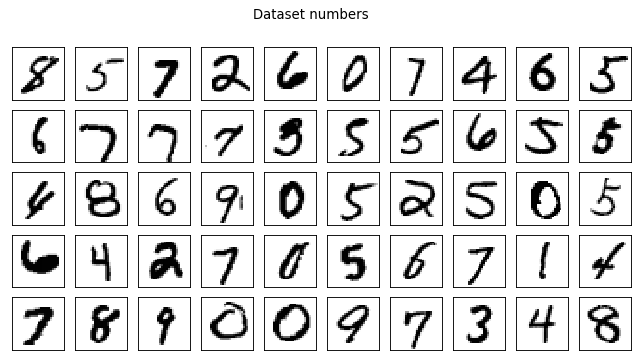

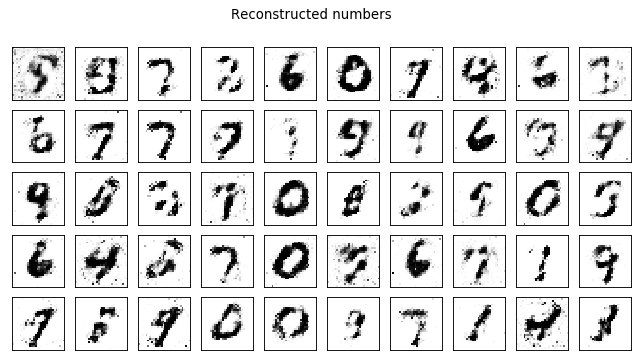

Test losses. G: 2.5166, D: 0.1257
Train Epoch: 57 [0/50000 (0%)]	Losses G: 2.7804, D: 0.2075
Train Epoch: 57 [25000/50000 (50%)]	Losses G: 3.6235, D: 0.1847
Train Epoch: 57 [50000/50000 (100%)]	Losses G: 2.7539, D: 0.2900


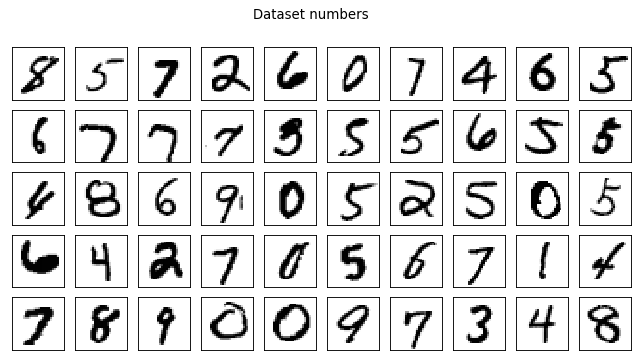

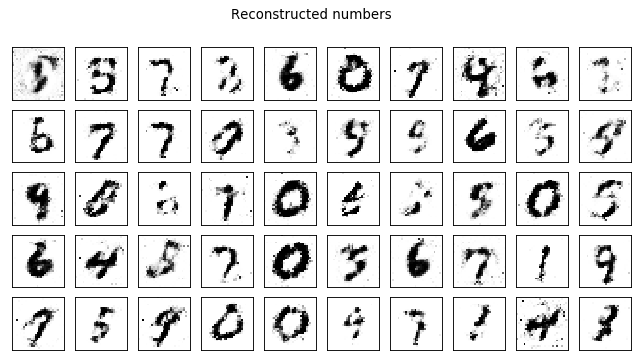

Test losses. G: 2.4819, D: 0.1924
Train Epoch: 58 [0/50000 (0%)]	Losses G: 2.6664, D: 0.3380
Train Epoch: 58 [25000/50000 (50%)]	Losses G: 2.3612, D: 0.2846
Train Epoch: 58 [50000/50000 (100%)]	Losses G: 3.0262, D: 0.2337


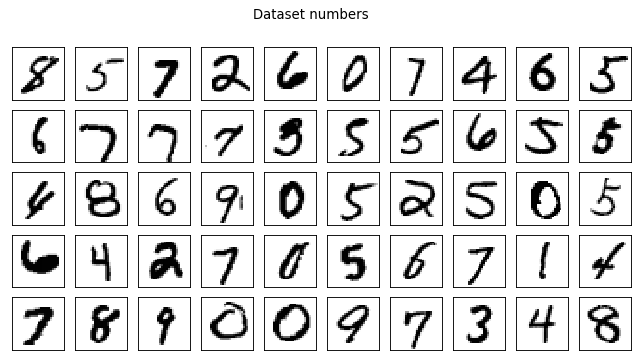

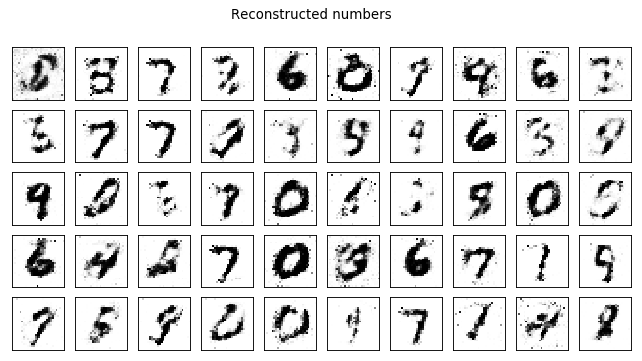

Test losses. G: 2.8153, D: 0.1609
Train Epoch: 59 [0/50000 (0%)]	Losses G: 2.6170, D: 0.2495
Train Epoch: 59 [25000/50000 (50%)]	Losses G: 2.1424, D: 0.2451
Train Epoch: 59 [50000/50000 (100%)]	Losses G: 2.8333, D: 0.2153


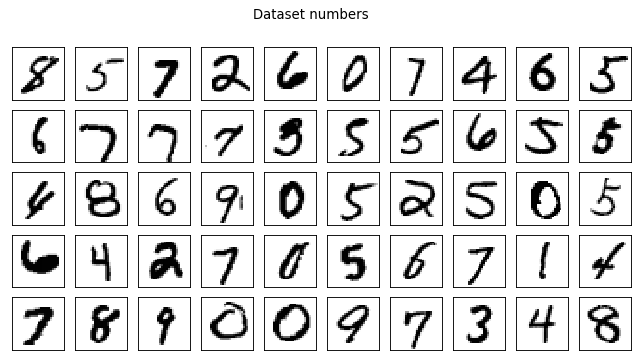

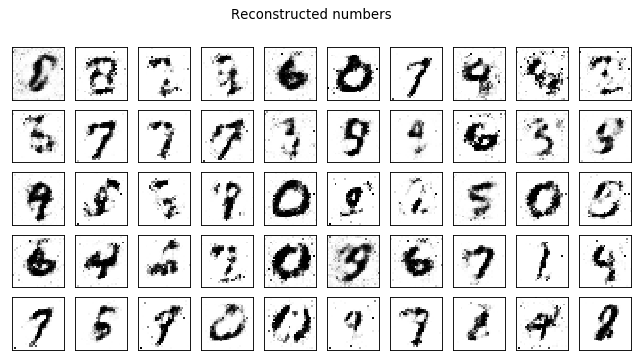

Test losses. G: 2.7320, D: 0.1592
Train Epoch: 60 [0/50000 (0%)]	Losses G: 3.0348, D: 0.2060
Train Epoch: 60 [25000/50000 (50%)]	Losses G: 3.3428, D: 0.2557
Train Epoch: 60 [50000/50000 (100%)]	Losses G: 3.3100, D: 0.2863


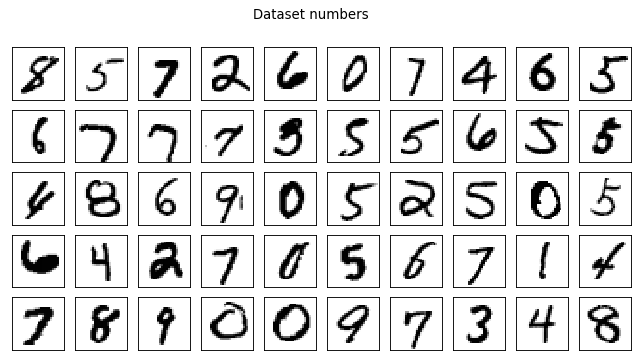

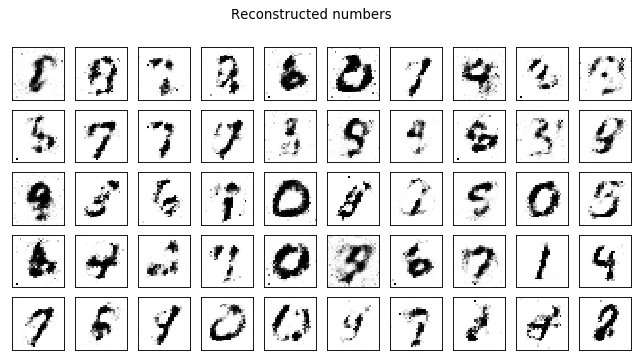

Test losses. G: 3.0489, D: 0.2052
Train Epoch: 61 [0/50000 (0%)]	Losses G: 2.7201, D: 0.3244
Train Epoch: 61 [25000/50000 (50%)]	Losses G: 2.9103, D: 0.2800
Train Epoch: 61 [50000/50000 (100%)]	Losses G: 2.2334, D: 0.3555


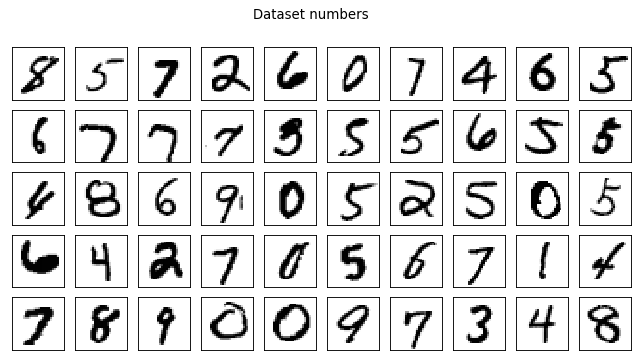

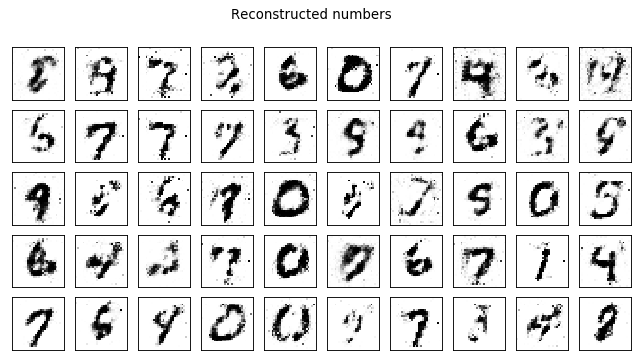

Test losses. G: 2.0573, D: 0.2175
Train Epoch: 62 [0/50000 (0%)]	Losses G: 2.2234, D: 0.3410
Train Epoch: 62 [25000/50000 (50%)]	Losses G: 3.1921, D: 0.2198
Train Epoch: 62 [50000/50000 (100%)]	Losses G: 2.6395, D: 0.2612


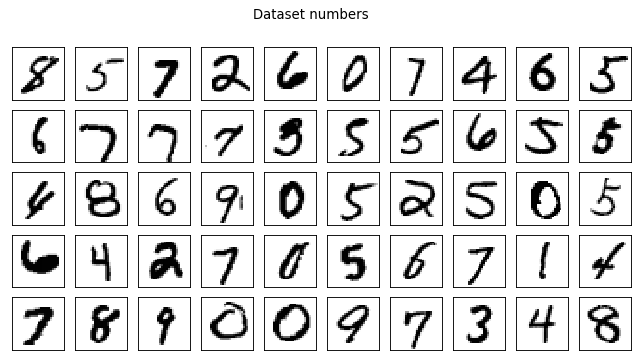

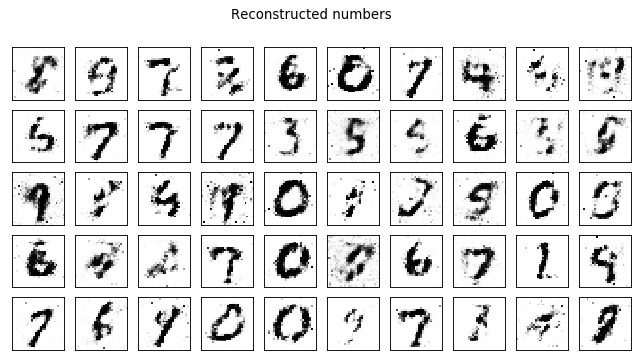

Test losses. G: 2.4142, D: 0.1598
Train Epoch: 63 [0/50000 (0%)]	Losses G: 2.7027, D: 0.2289
Train Epoch: 63 [25000/50000 (50%)]	Losses G: 3.0199, D: 0.2318
Train Epoch: 63 [50000/50000 (100%)]	Losses G: 2.8241, D: 0.2895


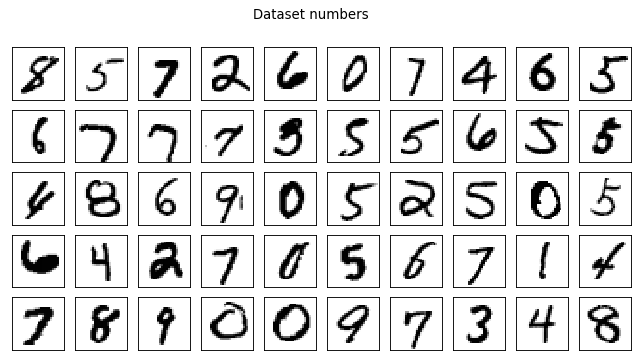

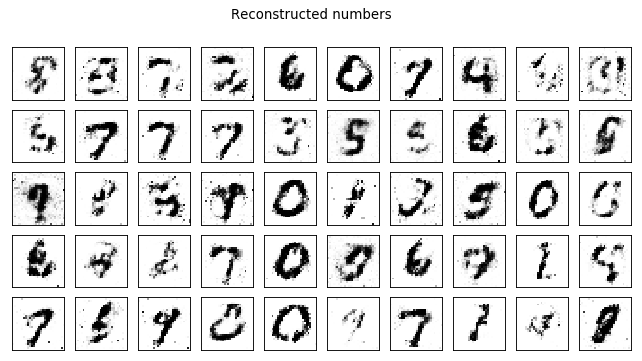

Test losses. G: 2.5364, D: 0.2163
Train Epoch: 64 [0/50000 (0%)]	Losses G: 2.5394, D: 0.3227
Train Epoch: 64 [25000/50000 (50%)]	Losses G: 2.9197, D: 0.2541
Train Epoch: 64 [50000/50000 (100%)]	Losses G: 3.2216, D: 0.2751


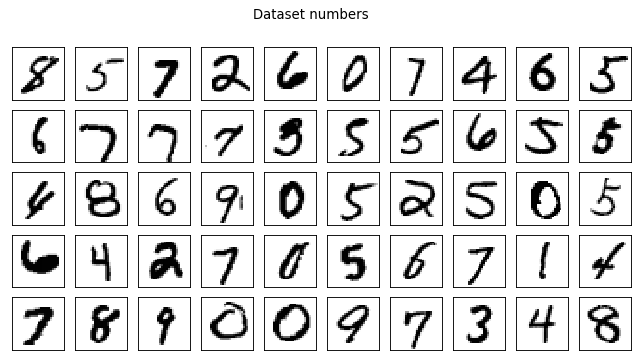

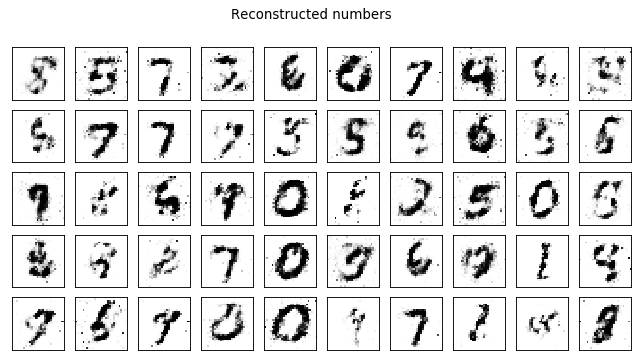

Test losses. G: 2.9333, D: 0.2041
Train Epoch: 65 [0/50000 (0%)]	Losses G: 2.7728, D: 0.2829
Train Epoch: 65 [25000/50000 (50%)]	Losses G: 2.1357, D: 0.3197
Train Epoch: 65 [50000/50000 (100%)]	Losses G: 2.7871, D: 0.2369


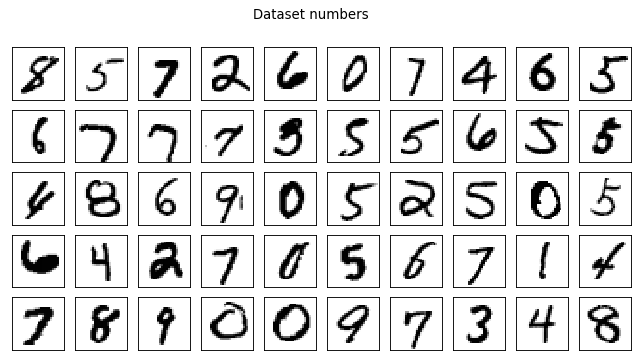

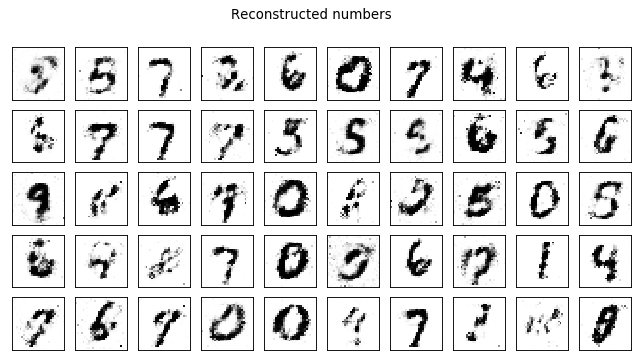

Test losses. G: 2.6071, D: 0.1707
Train Epoch: 66 [0/50000 (0%)]	Losses G: 2.6911, D: 0.2538
Train Epoch: 66 [25000/50000 (50%)]	Losses G: 2.6370, D: 0.2181
Train Epoch: 66 [50000/50000 (100%)]	Losses G: 2.5646, D: 0.3328


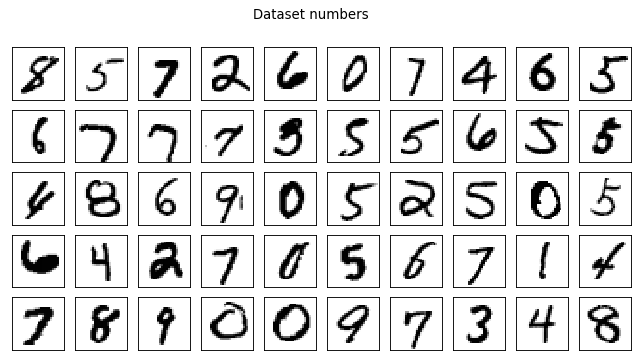

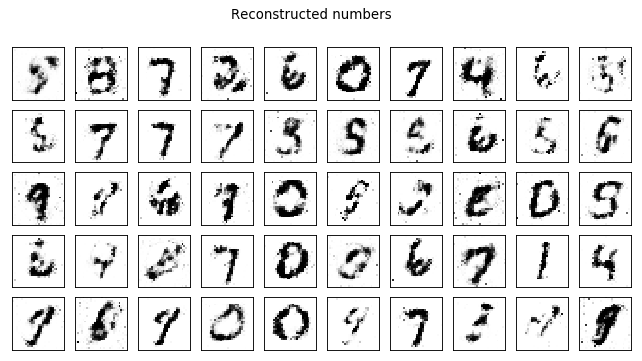

Test losses. G: 2.2789, D: 0.2331
Train Epoch: 67 [0/50000 (0%)]	Losses G: 2.5967, D: 0.3434
Train Epoch: 67 [25000/50000 (50%)]	Losses G: 2.3766, D: 0.3299
Train Epoch: 67 [50000/50000 (100%)]	Losses G: 2.5636, D: 0.2552


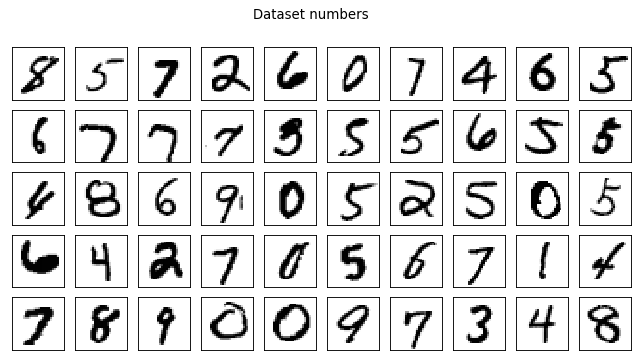

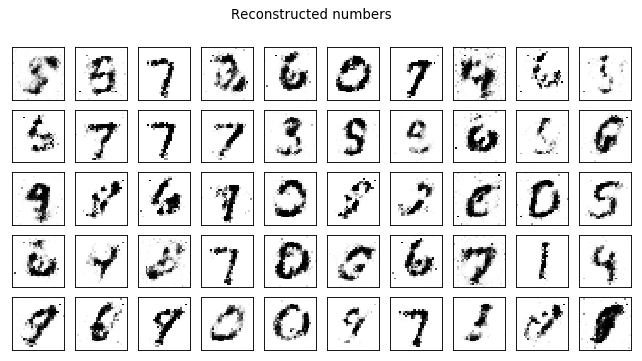

Test losses. G: 2.4776, D: 0.1771
Train Epoch: 68 [0/50000 (0%)]	Losses G: 2.5415, D: 0.2342
Train Epoch: 68 [25000/50000 (50%)]	Losses G: 2.2828, D: 0.2725
Train Epoch: 68 [50000/50000 (100%)]	Losses G: 2.7654, D: 0.2706


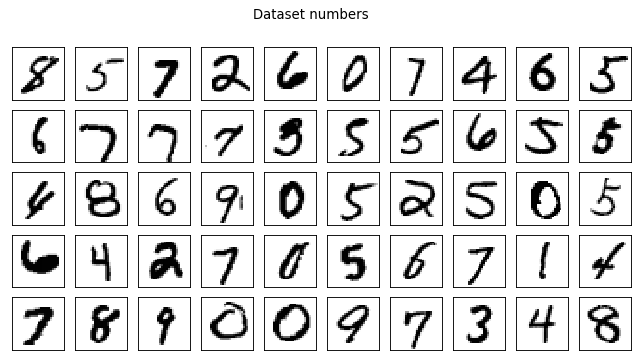

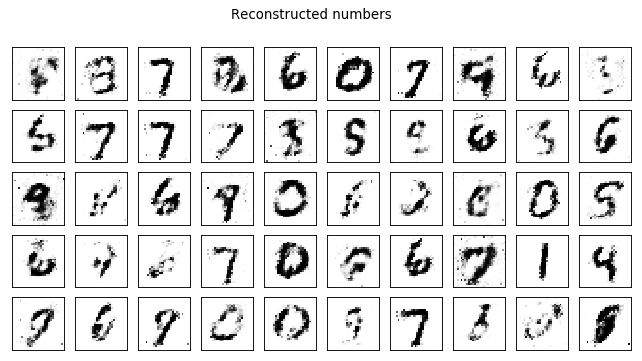

Test losses. G: 2.5136, D: 0.1921
Train Epoch: 69 [0/50000 (0%)]	Losses G: 2.8017, D: 0.2726
Train Epoch: 69 [25000/50000 (50%)]	Losses G: 1.8116, D: 0.4226
Train Epoch: 69 [50000/50000 (100%)]	Losses G: 2.4700, D: 0.3994


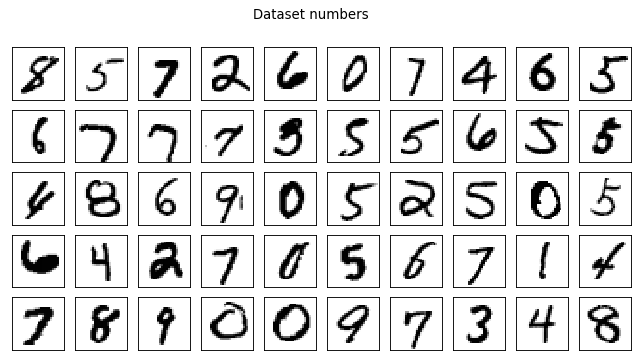

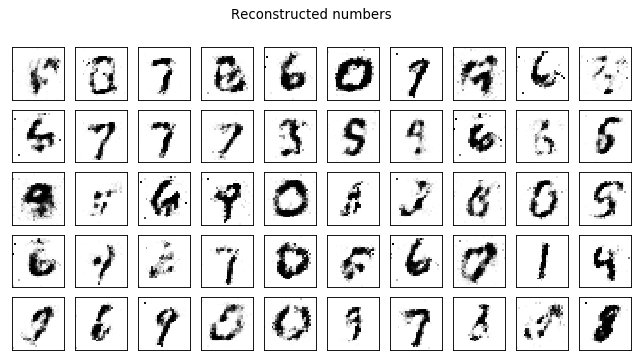

Test losses. G: 2.2961, D: 0.2939
Train Epoch: 70 [0/50000 (0%)]	Losses G: 1.9929, D: 0.4264
Train Epoch: 70 [25000/50000 (50%)]	Losses G: 2.4734, D: 0.3157
Train Epoch: 70 [50000/50000 (100%)]	Losses G: 2.7153, D: 0.2729


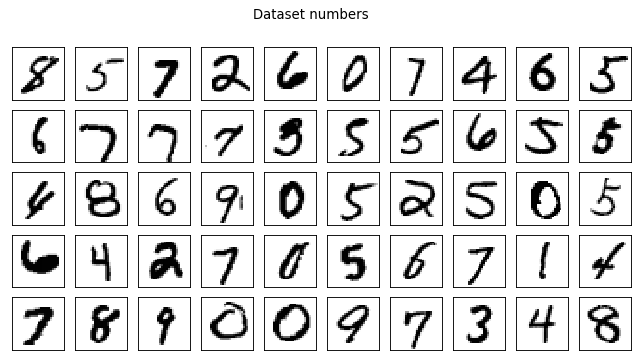

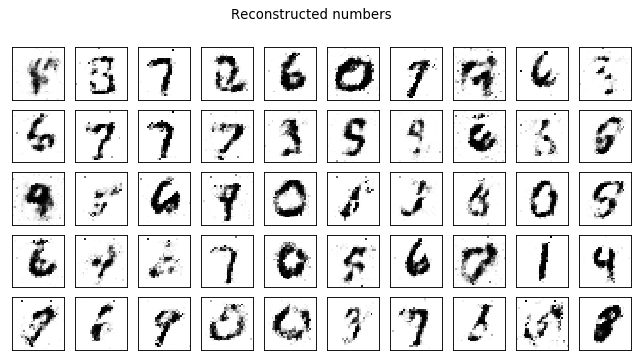

Test losses. G: 2.5182, D: 0.2137
Train Epoch: 71 [0/50000 (0%)]	Losses G: 2.4658, D: 0.2927
Train Epoch: 71 [25000/50000 (50%)]	Losses G: 2.7772, D: 0.3244
Train Epoch: 71 [50000/50000 (100%)]	Losses G: 2.5380, D: 0.3460


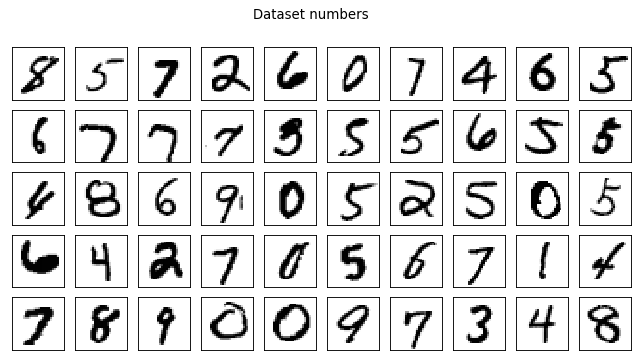

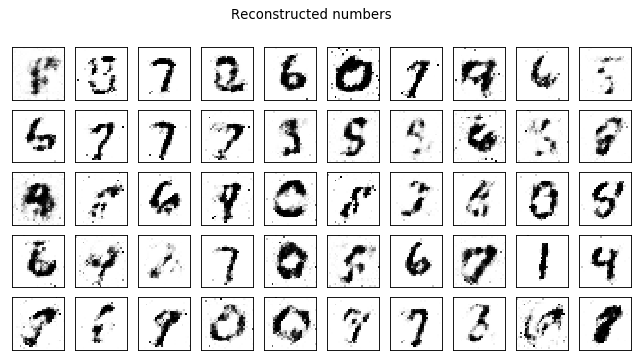

Test losses. G: 2.4553, D: 0.2547
Train Epoch: 72 [0/50000 (0%)]	Losses G: 2.5365, D: 0.3554
Train Epoch: 72 [25000/50000 (50%)]	Losses G: 2.1868, D: 0.3632
Train Epoch: 72 [50000/50000 (100%)]	Losses G: 2.3784, D: 0.2966


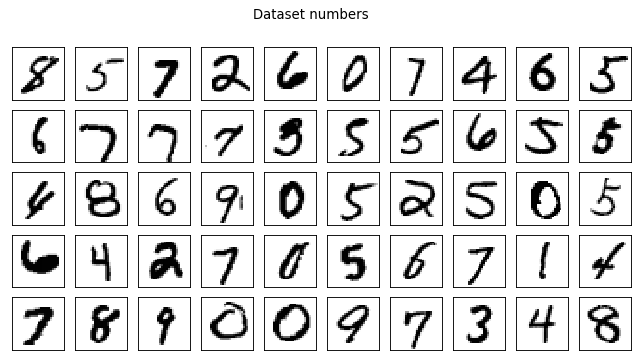

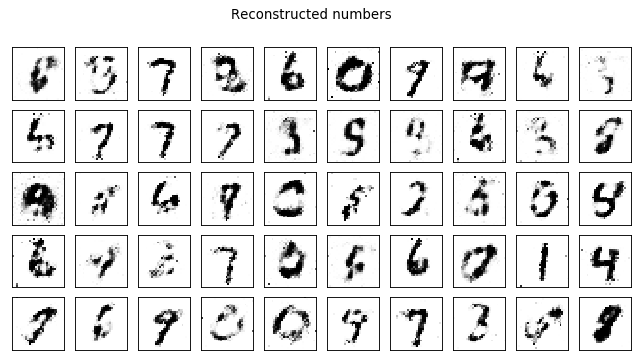

Test losses. G: 2.2709, D: 0.1975
Train Epoch: 73 [0/50000 (0%)]	Losses G: 2.7523, D: 0.2739
Train Epoch: 73 [25000/50000 (50%)]	Losses G: 2.1100, D: 0.4208
Train Epoch: 73 [50000/50000 (100%)]	Losses G: 1.8809, D: 0.3406


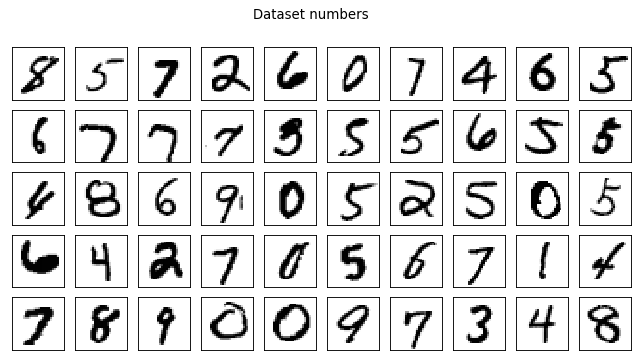

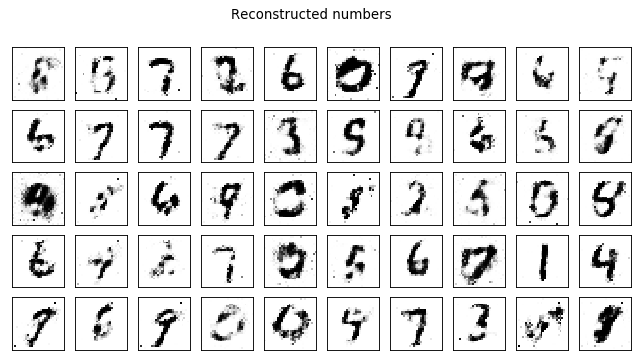

Test losses. G: 1.8446, D: 0.2365
Train Epoch: 74 [0/50000 (0%)]	Losses G: 2.2203, D: 0.3569
Train Epoch: 74 [25000/50000 (50%)]	Losses G: 2.8300, D: 0.2263
Train Epoch: 74 [50000/50000 (100%)]	Losses G: 2.0494, D: 0.2520


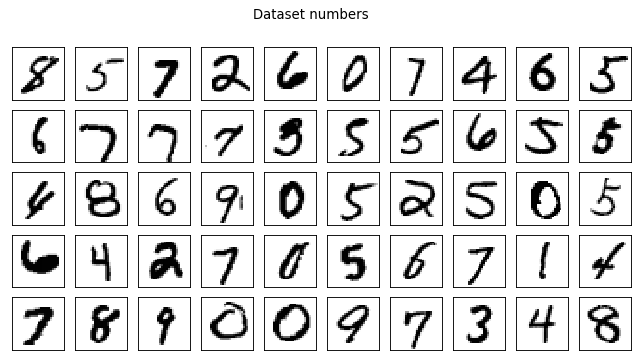

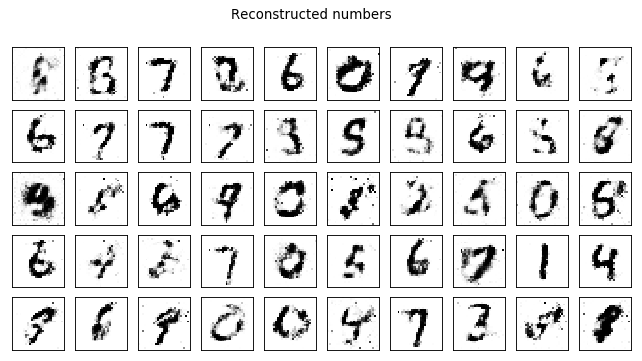

Test losses. G: 2.0275, D: 0.2039
Train Epoch: 75 [0/50000 (0%)]	Losses G: 2.1998, D: 0.3337
Train Epoch: 75 [25000/50000 (50%)]	Losses G: 1.8173, D: 0.3970
Train Epoch: 75 [50000/50000 (100%)]	Losses G: 2.2728, D: 0.3490


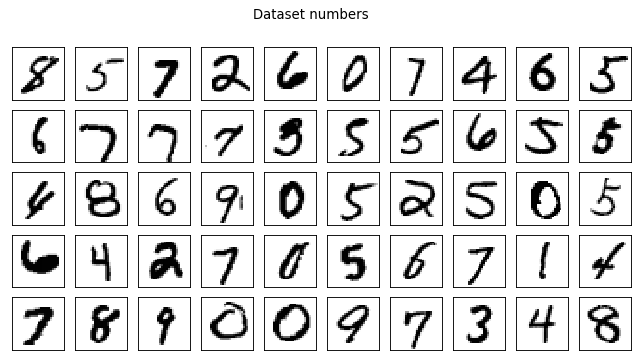

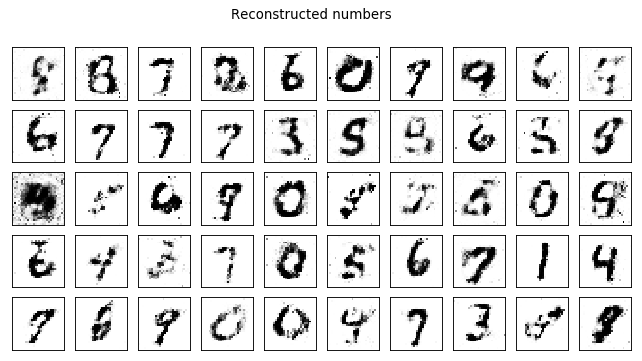

Test losses. G: 2.1586, D: 0.2638
Train Epoch: 76 [0/50000 (0%)]	Losses G: 2.5890, D: 0.3213
Train Epoch: 76 [25000/50000 (50%)]	Losses G: 2.2708, D: 0.3250
Train Epoch: 76 [50000/50000 (100%)]	Losses G: 2.0226, D: 0.4406


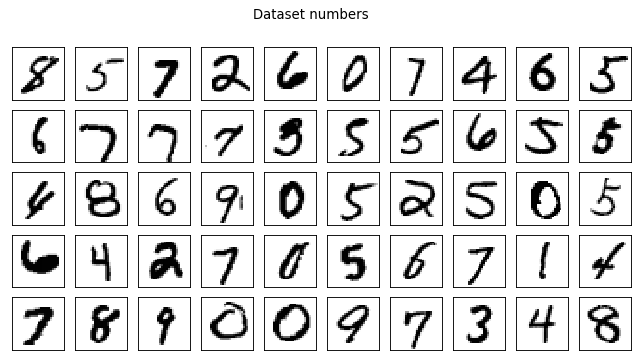

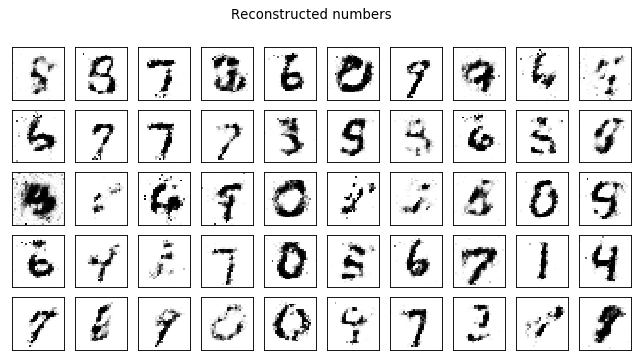

Test losses. G: 1.9813, D: 0.3320
Train Epoch: 77 [0/50000 (0%)]	Losses G: 1.8237, D: 0.4278
Train Epoch: 77 [25000/50000 (50%)]	Losses G: 2.4880, D: 0.3097
Train Epoch: 77 [50000/50000 (100%)]	Losses G: 2.5791, D: 0.3072


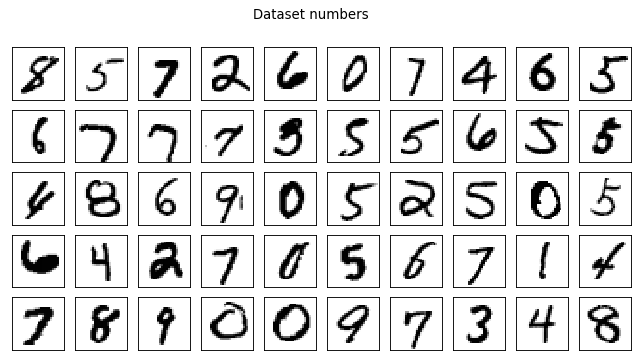

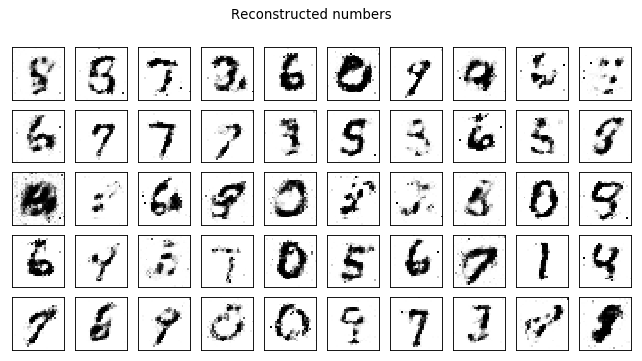

Test losses. G: 2.4925, D: 0.2462
Train Epoch: 78 [0/50000 (0%)]	Losses G: 2.4050, D: 0.3641
Train Epoch: 78 [25000/50000 (50%)]	Losses G: 1.8143, D: 0.3744
Train Epoch: 78 [50000/50000 (100%)]	Losses G: 2.1257, D: 0.3149


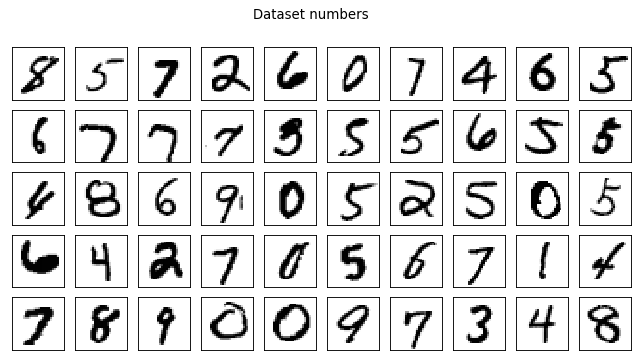

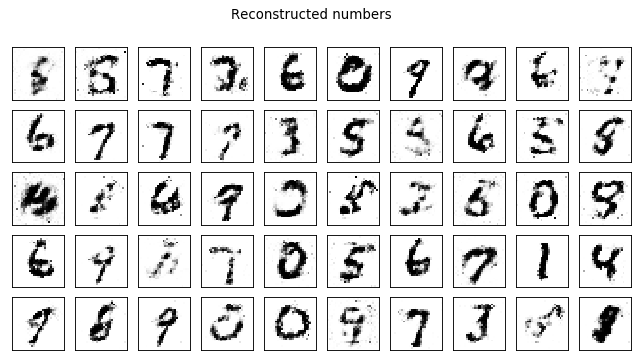

Test losses. G: 1.9561, D: 0.2293
Train Epoch: 79 [0/50000 (0%)]	Losses G: 1.9684, D: 0.2991
Train Epoch: 79 [25000/50000 (50%)]	Losses G: 2.2440, D: 0.3445
Train Epoch: 79 [50000/50000 (100%)]	Losses G: 2.2026, D: 0.4186


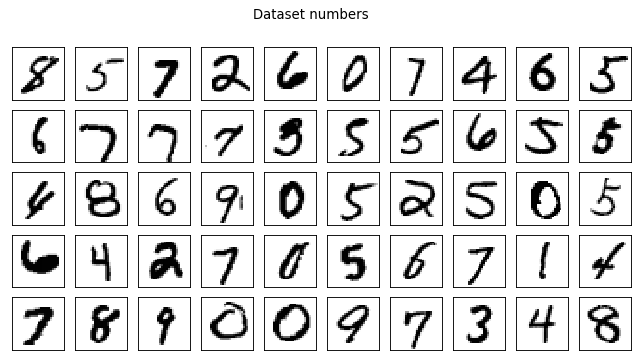

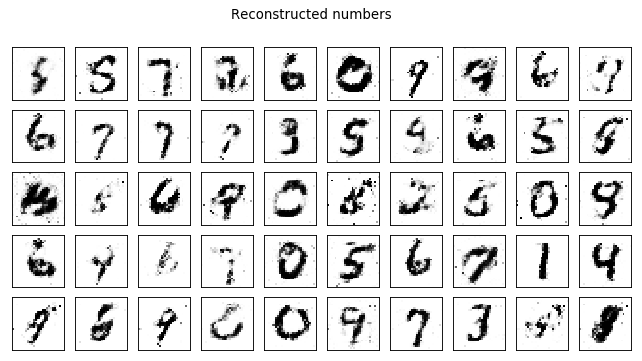

Test losses. G: 2.0678, D: 0.3136
Train Epoch: 80 [0/50000 (0%)]	Losses G: 2.0912, D: 0.3607
Train Epoch: 80 [25000/50000 (50%)]	Losses G: 2.0265, D: 0.3985
Train Epoch: 80 [50000/50000 (100%)]	Losses G: 2.0203, D: 0.3239


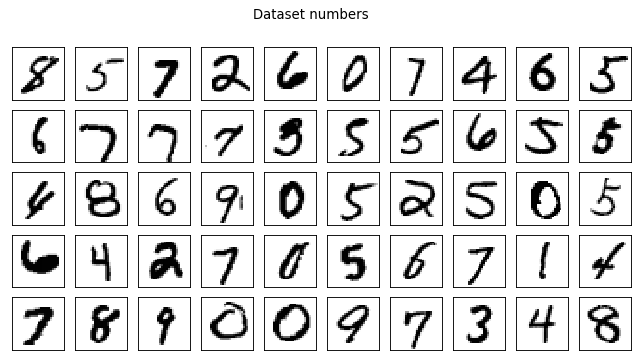

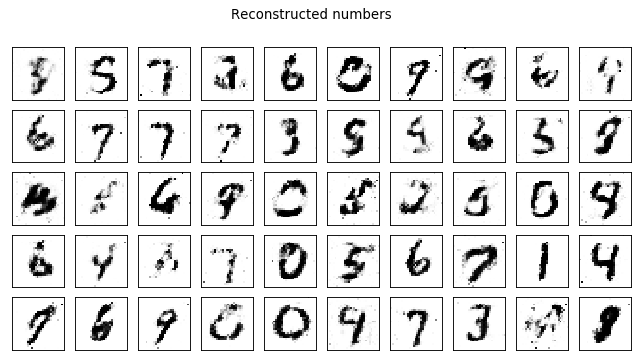

Test losses. G: 1.9721, D: 0.2428
Train Epoch: 81 [0/50000 (0%)]	Losses G: 1.9650, D: 0.3727
Train Epoch: 81 [25000/50000 (50%)]	Losses G: 2.0738, D: 0.3355
Train Epoch: 81 [50000/50000 (100%)]	Losses G: 1.5058, D: 0.4186


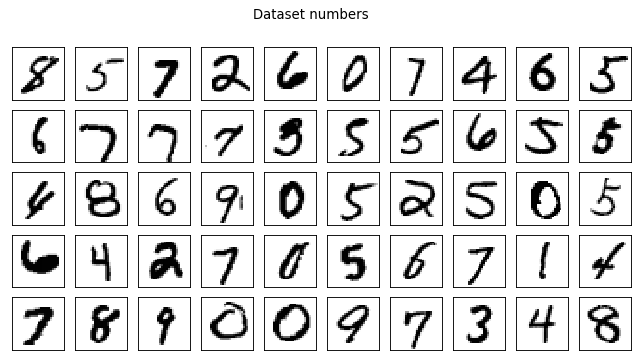

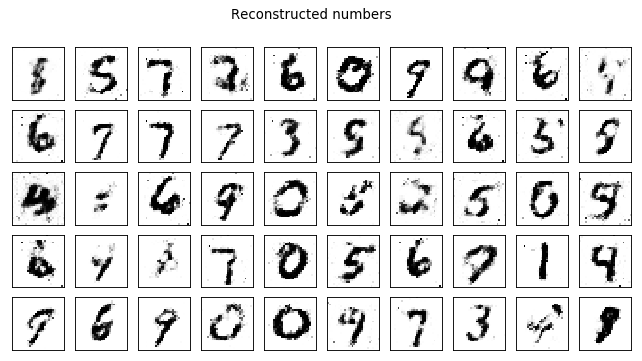

Test losses. G: 1.5639, D: 0.3198
Train Epoch: 82 [0/50000 (0%)]	Losses G: 1.7267, D: 0.4388
Train Epoch: 82 [25000/50000 (50%)]	Losses G: 2.1770, D: 0.3208
Train Epoch: 82 [50000/50000 (100%)]	Losses G: 2.1293, D: 0.3509


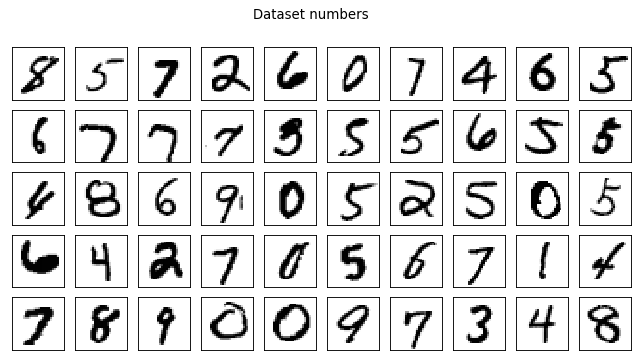

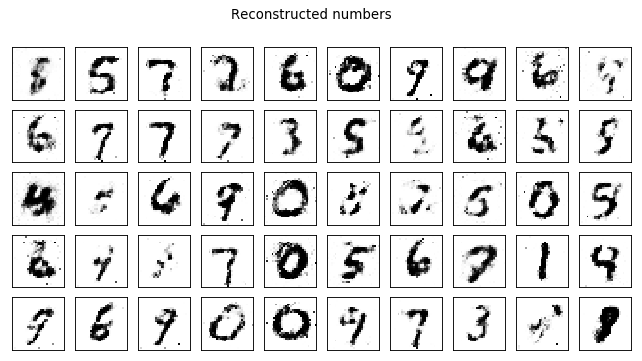

Test losses. G: 1.9595, D: 0.2809
Train Epoch: 83 [0/50000 (0%)]	Losses G: 1.8578, D: 0.3629
Train Epoch: 83 [25000/50000 (50%)]	Losses G: 1.7781, D: 0.3690
Train Epoch: 83 [50000/50000 (100%)]	Losses G: 2.3408, D: 0.3351


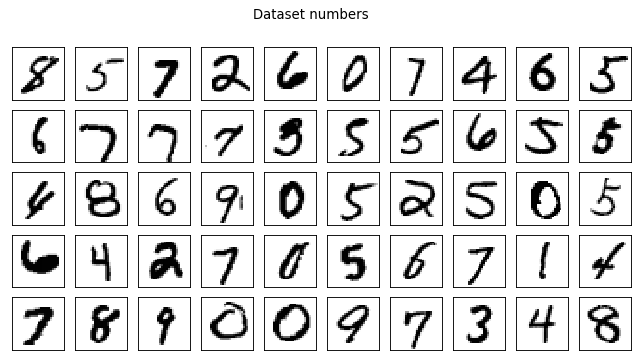

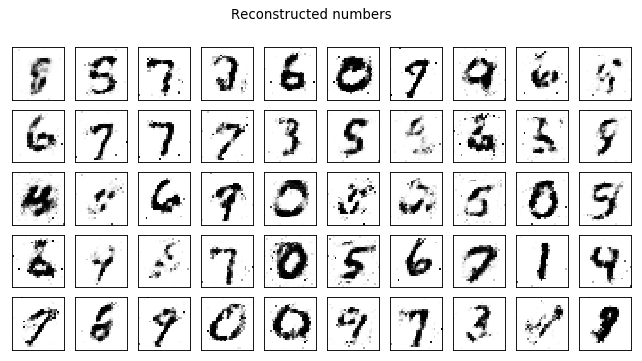

Test losses. G: 2.1844, D: 0.2614
Train Epoch: 84 [0/50000 (0%)]	Losses G: 2.2125, D: 0.3503
Train Epoch: 84 [25000/50000 (50%)]	Losses G: 1.8007, D: 0.3567
Train Epoch: 84 [50000/50000 (100%)]	Losses G: 2.1101, D: 0.3743


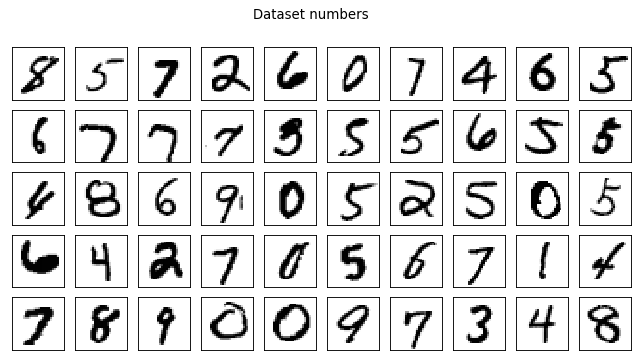

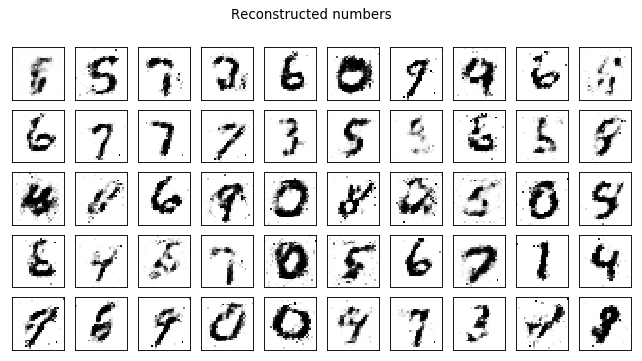

Test losses. G: 2.0045, D: 0.2772
Train Epoch: 85 [0/50000 (0%)]	Losses G: 2.3791, D: 0.3682
Train Epoch: 85 [25000/50000 (50%)]	Losses G: 2.1265, D: 0.3844
Train Epoch: 85 [50000/50000 (100%)]	Losses G: 2.5626, D: 0.4240


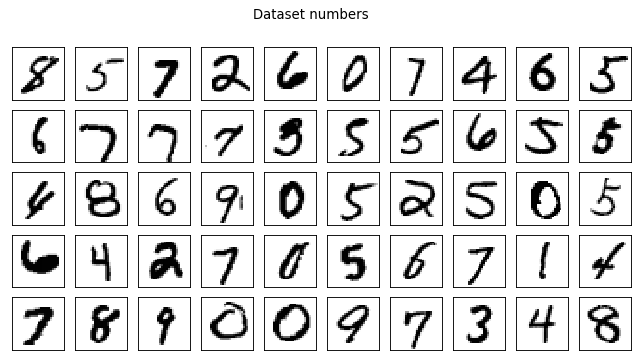

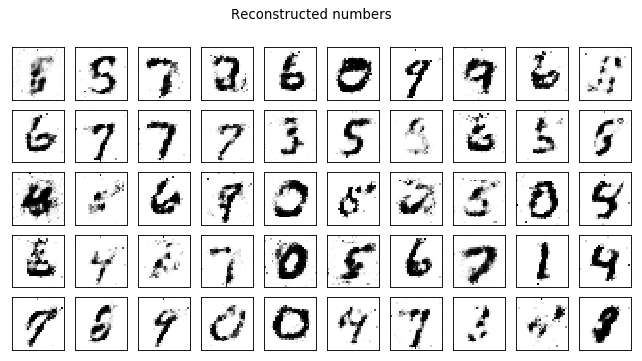

Test losses. G: 2.3800, D: 0.3539
Train Epoch: 86 [0/50000 (0%)]	Losses G: 2.3230, D: 0.4450
Train Epoch: 86 [25000/50000 (50%)]	Losses G: 2.0621, D: 0.3864
Train Epoch: 86 [50000/50000 (100%)]	Losses G: 2.0672, D: 0.3986


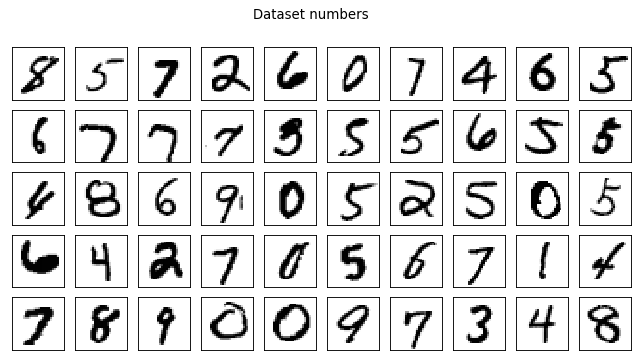

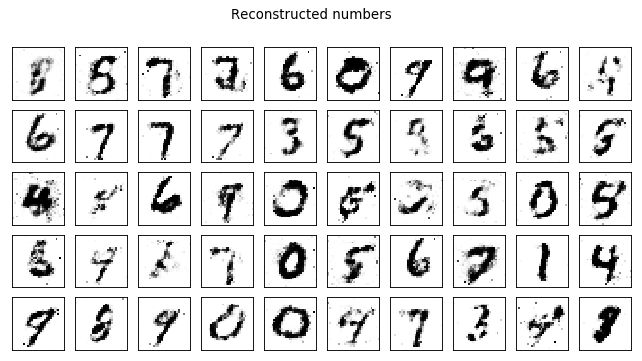

Test losses. G: 1.9152, D: 0.2830
Train Epoch: 87 [0/50000 (0%)]	Losses G: 2.0502, D: 0.3393
Train Epoch: 87 [25000/50000 (50%)]	Losses G: 1.8065, D: 0.4538
Train Epoch: 87 [50000/50000 (100%)]	Losses G: 1.7805, D: 0.4876


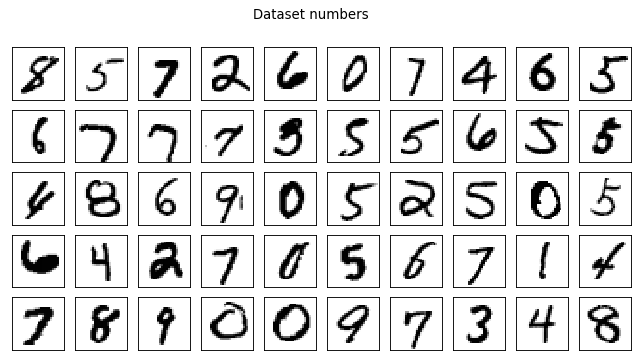

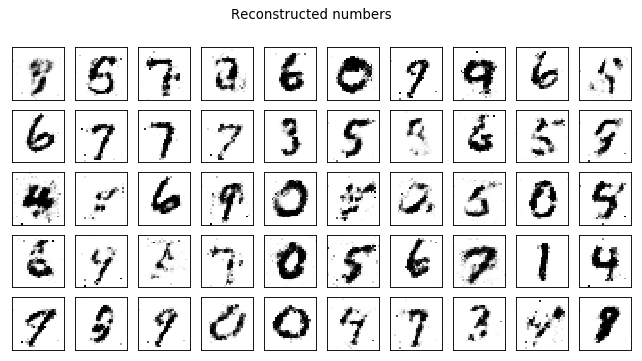

Test losses. G: 1.6313, D: 0.3770
Train Epoch: 88 [0/50000 (0%)]	Losses G: 1.6238, D: 0.4496
Train Epoch: 88 [25000/50000 (50%)]	Losses G: 1.6885, D: 0.4580
Train Epoch: 88 [50000/50000 (100%)]	Losses G: 1.3928, D: 0.4239


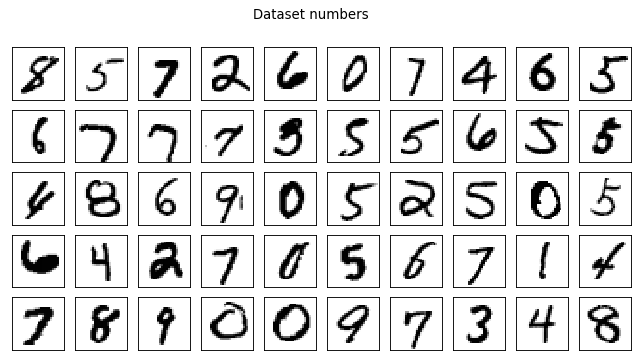

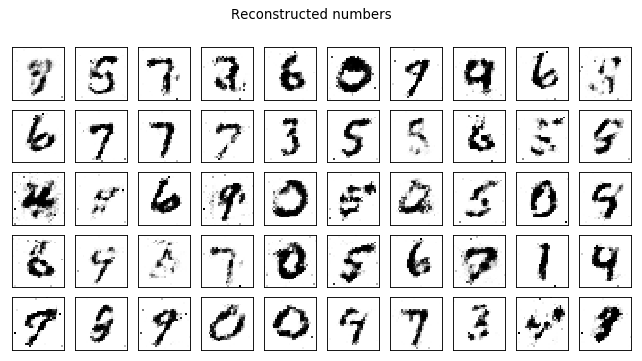

Test losses. G: 1.3865, D: 0.3418
Train Epoch: 89 [0/50000 (0%)]	Losses G: 1.3723, D: 0.3799
Train Epoch: 89 [25000/50000 (50%)]	Losses G: 2.0510, D: 0.3077
Train Epoch: 89 [50000/50000 (100%)]	Losses G: 2.0958, D: 0.3523


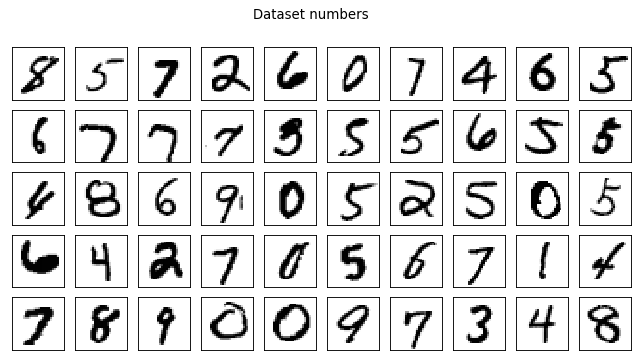

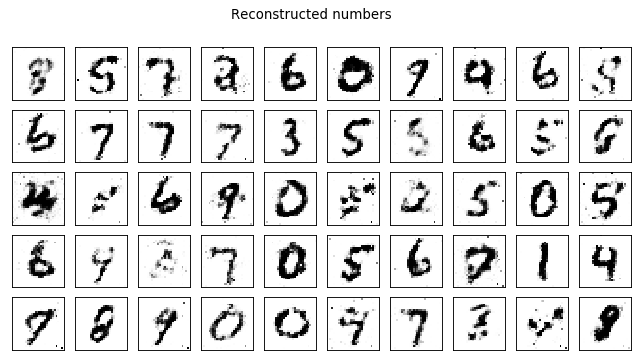

Test losses. G: 1.9113, D: 0.3119
Train Epoch: 90 [0/50000 (0%)]	Losses G: 1.8023, D: 0.4144
Train Epoch: 90 [25000/50000 (50%)]	Losses G: 1.5452, D: 0.4856
Train Epoch: 90 [50000/50000 (100%)]	Losses G: 1.7125, D: 0.4125


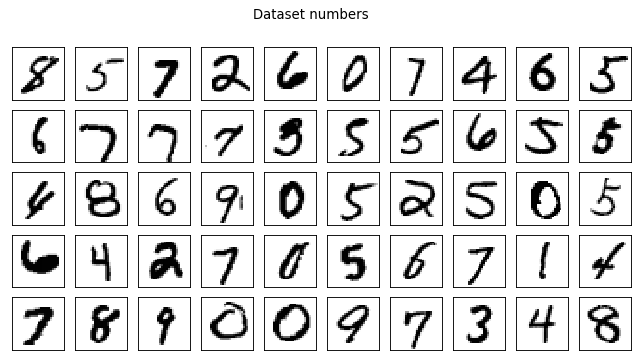

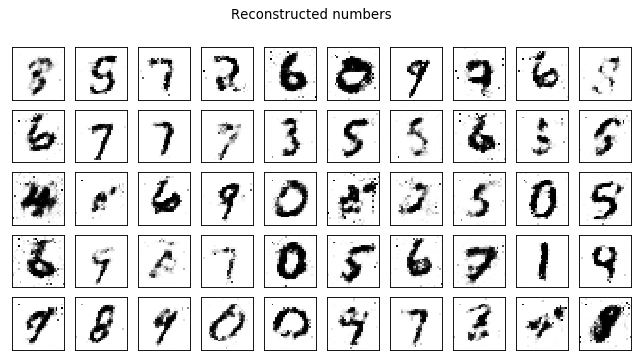

Test losses. G: 1.6958, D: 0.3349
Train Epoch: 91 [0/50000 (0%)]	Losses G: 1.8736, D: 0.4271
Train Epoch: 91 [25000/50000 (50%)]	Losses G: 1.9336, D: 0.4364
Train Epoch: 91 [50000/50000 (100%)]	Losses G: 1.8225, D: 0.4067


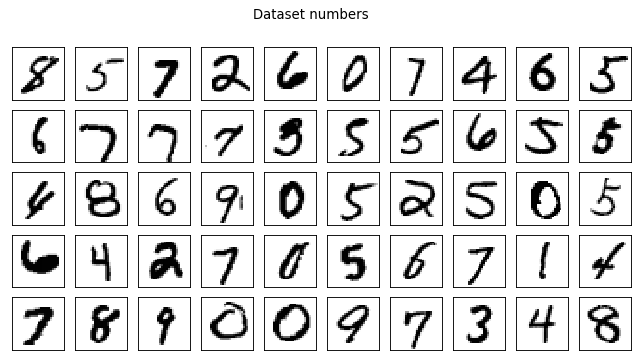

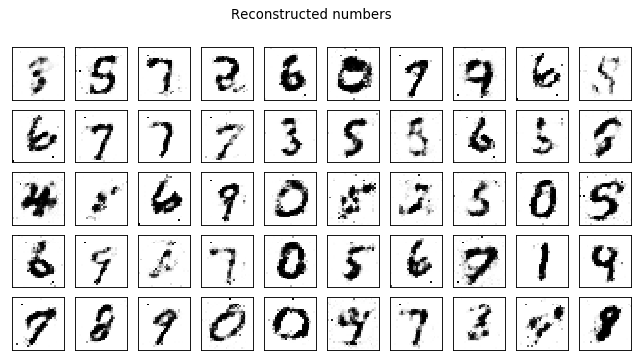

Test losses. G: 1.7150, D: 0.3109
Train Epoch: 92 [0/50000 (0%)]	Losses G: 1.9234, D: 0.4211
Train Epoch: 92 [25000/50000 (50%)]	Losses G: 2.1810, D: 0.3487
Train Epoch: 92 [50000/50000 (100%)]	Losses G: 1.8738, D: 0.5094


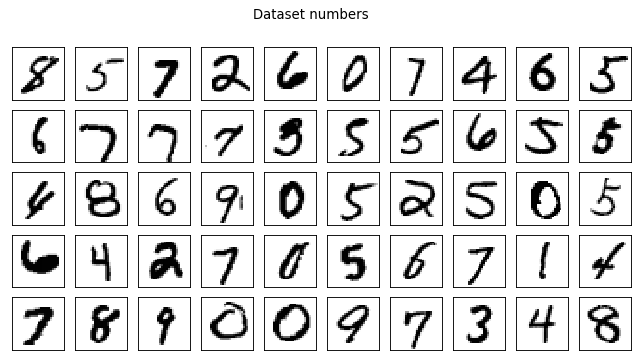

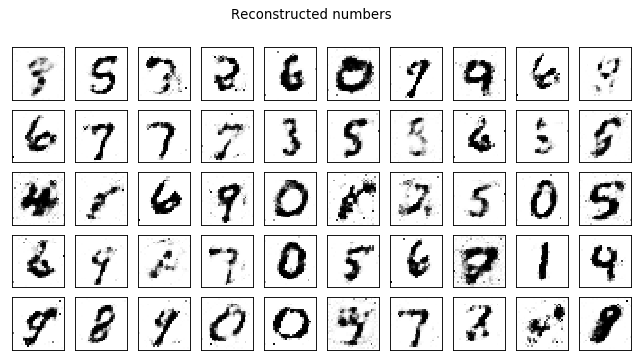

Test losses. G: 1.6915, D: 0.4038
Train Epoch: 93 [0/50000 (0%)]	Losses G: 1.7567, D: 0.5483
Train Epoch: 93 [25000/50000 (50%)]	Losses G: 1.5172, D: 0.5198
Train Epoch: 93 [50000/50000 (100%)]	Losses G: 1.7421, D: 0.4029


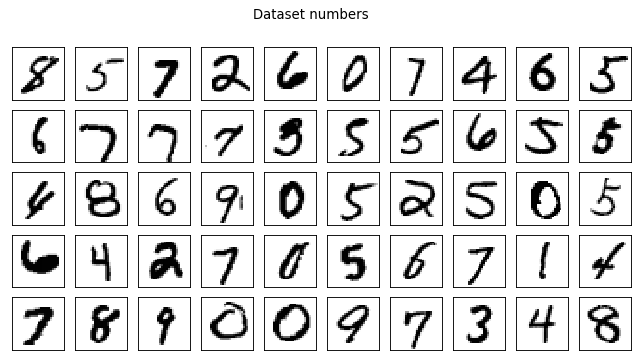

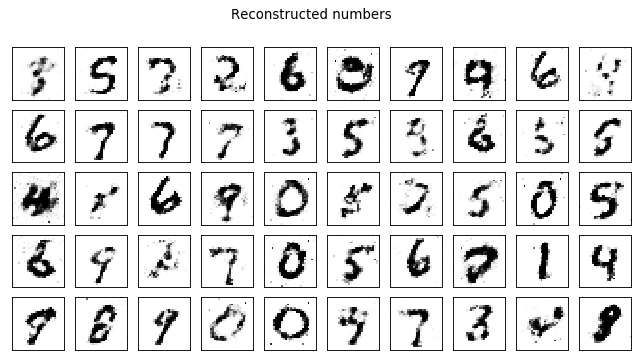

Test losses. G: 1.6402, D: 0.3236
Train Epoch: 94 [0/50000 (0%)]	Losses G: 1.3892, D: 0.4051
Train Epoch: 94 [25000/50000 (50%)]	Losses G: 1.6352, D: 0.4155
Train Epoch: 94 [50000/50000 (100%)]	Losses G: 1.8067, D: 0.5007


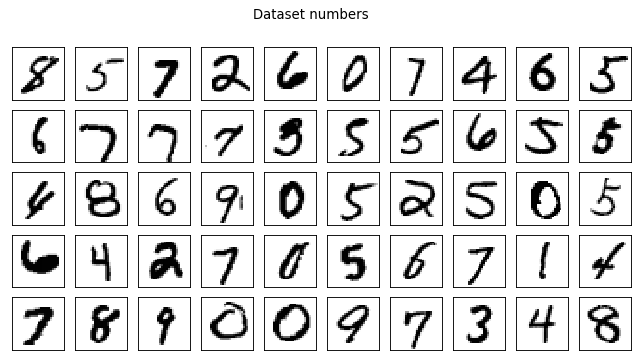

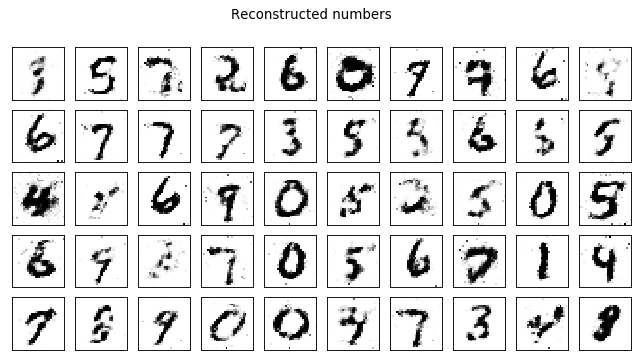

Test losses. G: 1.8187, D: 0.3710
Train Epoch: 95 [0/50000 (0%)]	Losses G: 1.6578, D: 0.4684
Train Epoch: 95 [25000/50000 (50%)]	Losses G: 1.9903, D: 0.4049
Train Epoch: 95 [50000/50000 (100%)]	Losses G: 1.8647, D: 0.4693


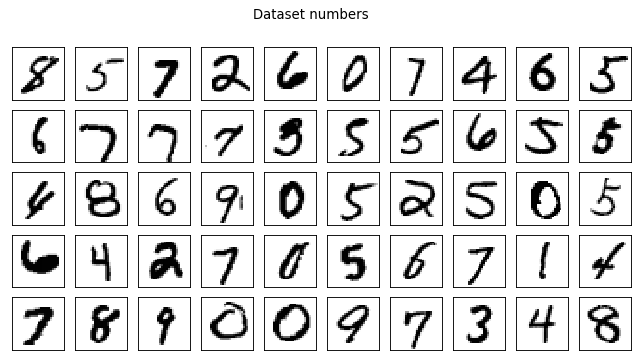

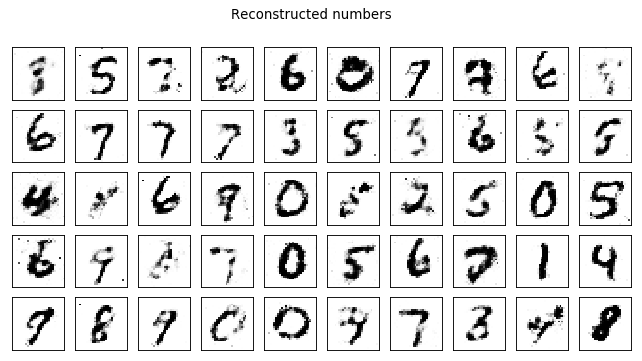

Test losses. G: 1.8690, D: 0.3377
Train Epoch: 96 [0/50000 (0%)]	Losses G: 1.7874, D: 0.4351
Train Epoch: 96 [25000/50000 (50%)]	Losses G: 1.5009, D: 0.4684
Train Epoch: 96 [50000/50000 (100%)]	Losses G: 2.1115, D: 0.3766


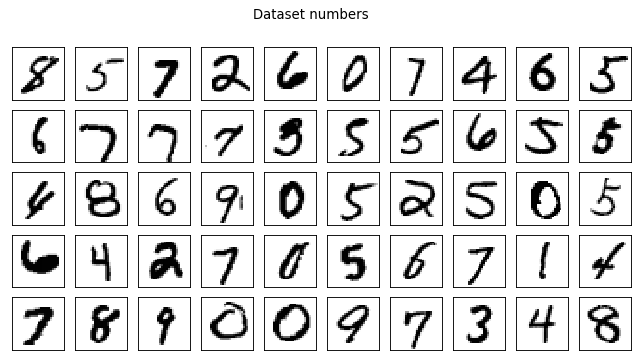

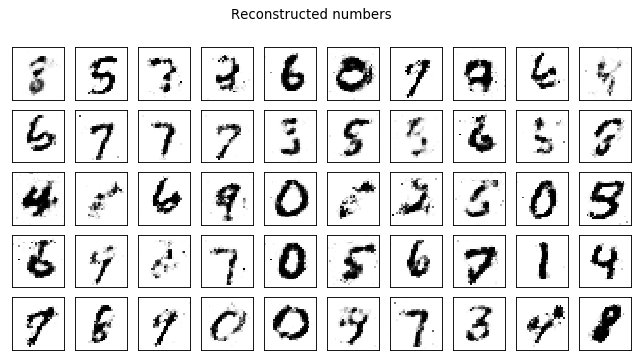

Test losses. G: 1.8332, D: 0.3086
Train Epoch: 97 [0/50000 (0%)]	Losses G: 2.1579, D: 0.3667
Train Epoch: 97 [25000/50000 (50%)]	Losses G: 1.9503, D: 0.4640
Train Epoch: 97 [50000/50000 (100%)]	Losses G: 1.9348, D: 0.4232


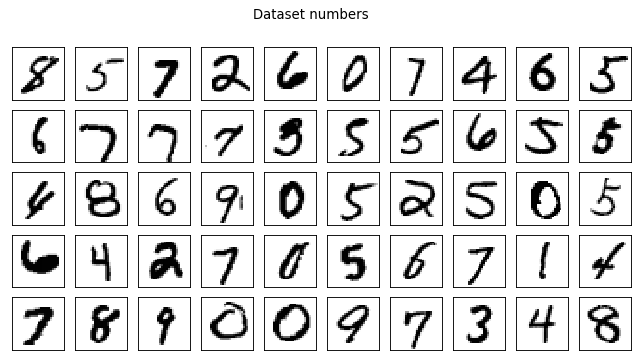

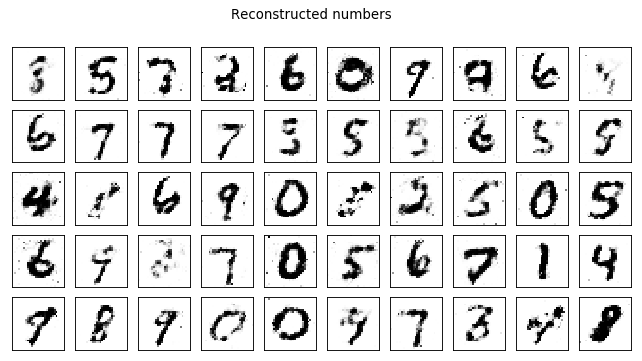

Test losses. G: 1.9917, D: 0.3527
Train Epoch: 98 [0/50000 (0%)]	Losses G: 1.9134, D: 0.4499
Train Epoch: 98 [25000/50000 (50%)]	Losses G: 1.9565, D: 0.4942
Train Epoch: 98 [50000/50000 (100%)]	Losses G: 1.3914, D: 0.4516


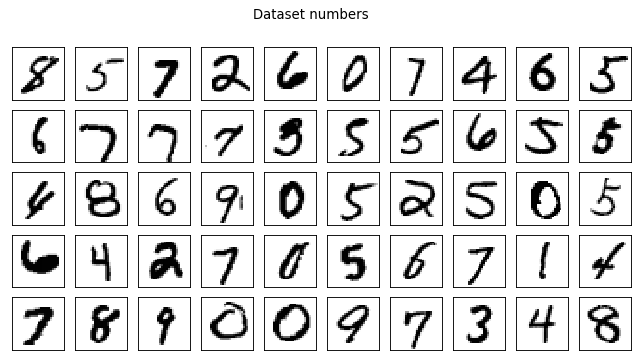

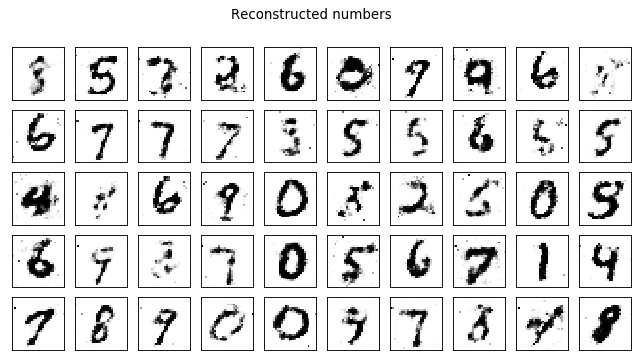

Test losses. G: 1.2930, D: 0.3863
Train Epoch: 99 [0/50000 (0%)]	Losses G: 1.4240, D: 0.4676
Train Epoch: 99 [25000/50000 (50%)]	Losses G: 1.8129, D: 0.3989
Train Epoch: 99 [50000/50000 (100%)]	Losses G: 1.9405, D: 0.4809


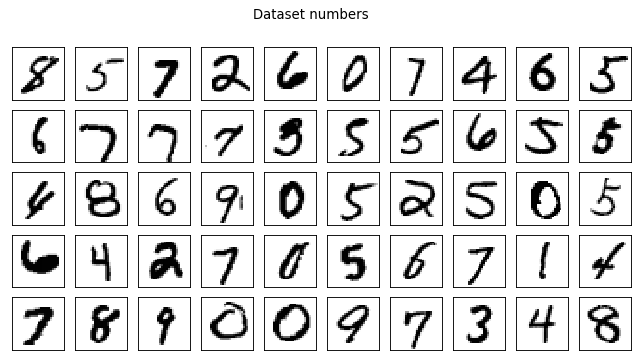

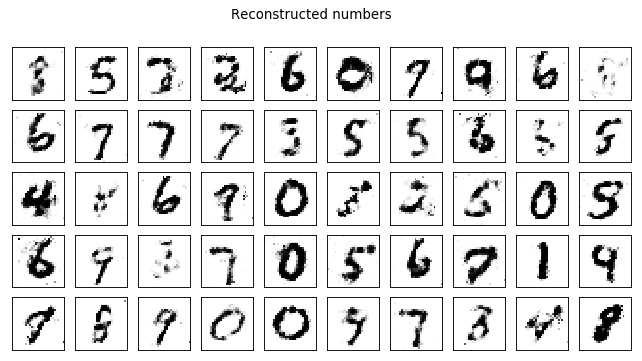

Test losses. G: 1.7477, D: 0.3429
Train Epoch: 100 [0/50000 (0%)]	Losses G: 1.5013, D: 0.4638
Train Epoch: 100 [25000/50000 (50%)]	Losses G: 1.8062, D: 0.4805
Train Epoch: 100 [50000/50000 (100%)]	Losses G: 1.4393, D: 0.4582


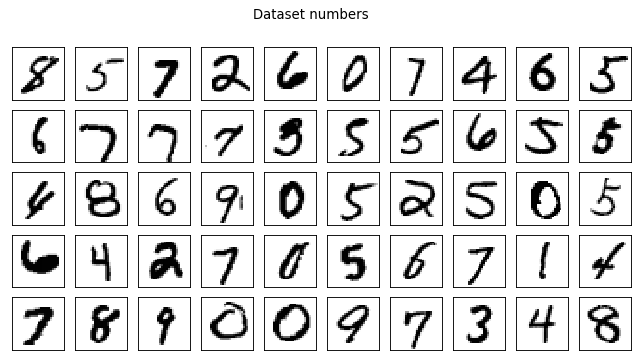

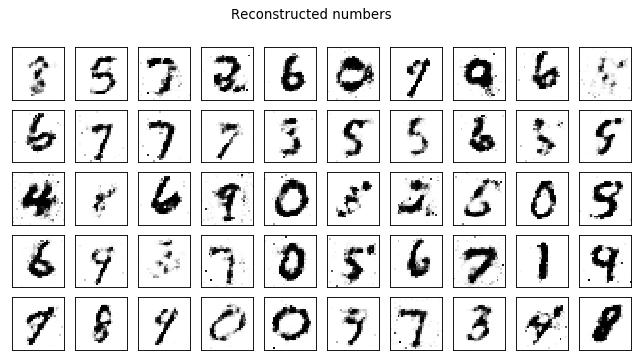

Test losses. G: 1.3052, D: 0.4230
Train Epoch: 101 [0/50000 (0%)]	Losses G: 1.2181, D: 0.4947
Train Epoch: 101 [25000/50000 (50%)]	Losses G: 1.7841, D: 0.4983
Train Epoch: 101 [50000/50000 (100%)]	Losses G: 1.4498, D: 0.3657


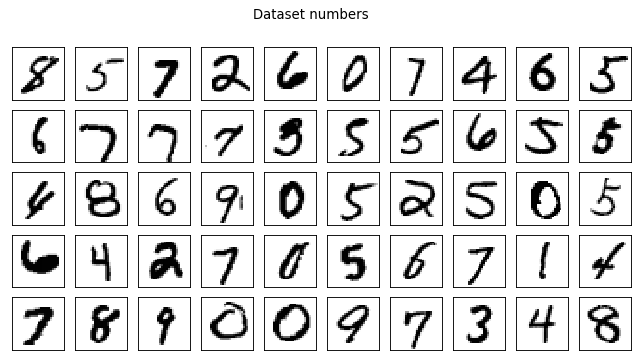

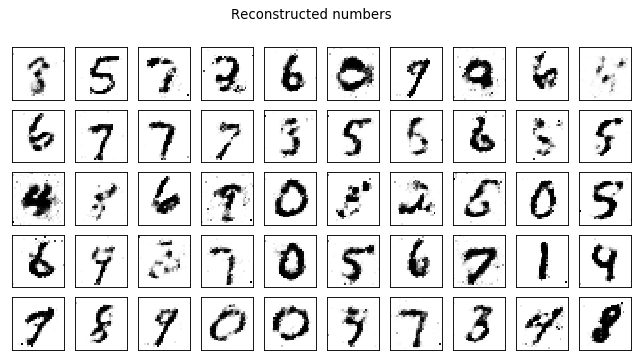

Test losses. G: 1.3944, D: 0.3159
Train Epoch: 102 [0/50000 (0%)]	Losses G: 1.7198, D: 0.4064
Train Epoch: 102 [25000/50000 (50%)]	Losses G: 2.0289, D: 0.4057
Train Epoch: 102 [50000/50000 (100%)]	Losses G: 1.8427, D: 0.4487


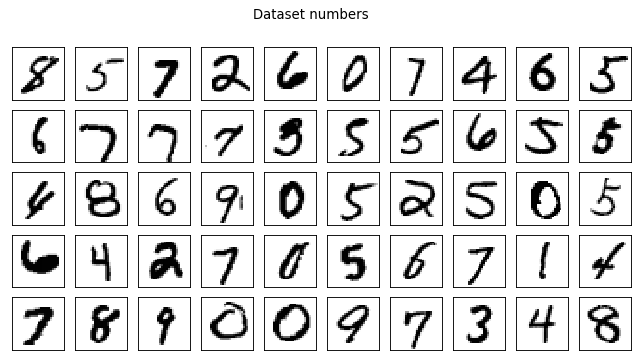

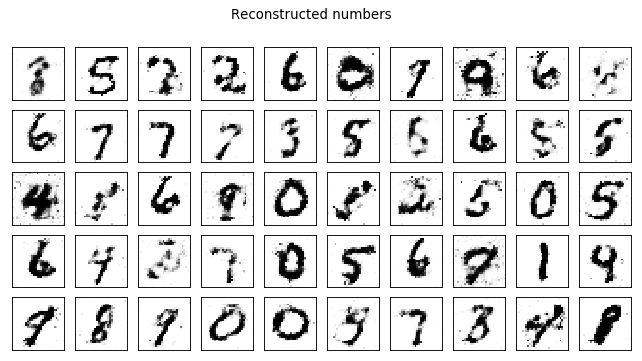

Test losses. G: 1.6983, D: 0.4113
Train Epoch: 103 [0/50000 (0%)]	Losses G: 1.6124, D: 0.5011
Train Epoch: 103 [25000/50000 (50%)]	Losses G: 1.3865, D: 0.4805
Train Epoch: 103 [50000/50000 (100%)]	Losses G: 1.7580, D: 0.4326


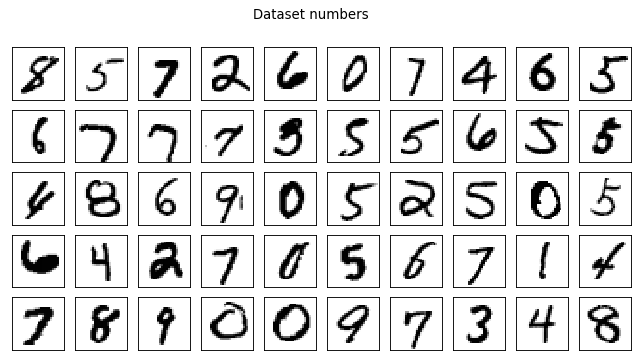

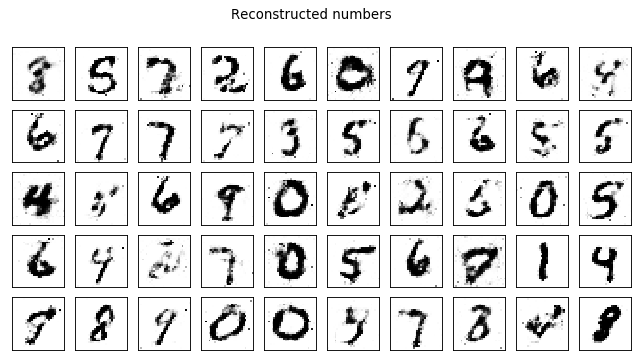

Test losses. G: 1.6447, D: 0.3403
Train Epoch: 104 [0/50000 (0%)]	Losses G: 1.6435, D: 0.4312
Train Epoch: 104 [25000/50000 (50%)]	Losses G: 1.7982, D: 0.4271
Train Epoch: 104 [50000/50000 (100%)]	Losses G: 1.3673, D: 0.4793


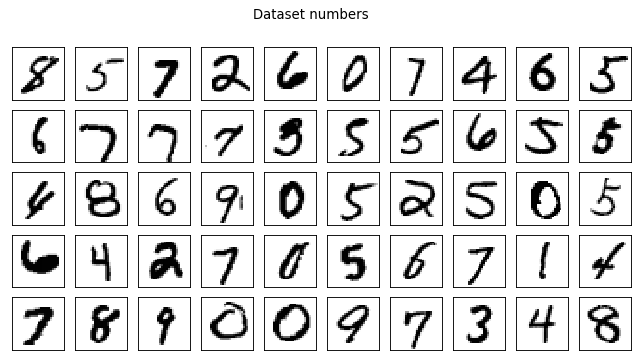

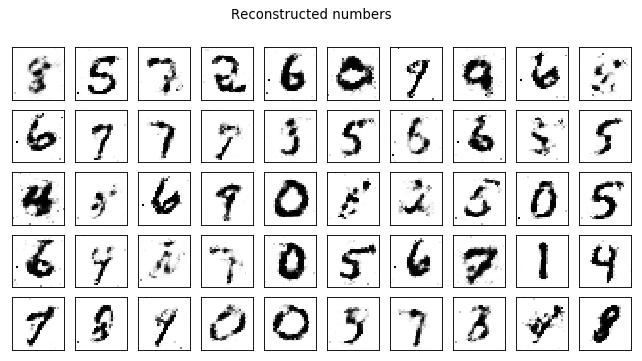

Test losses. G: 1.2996, D: 0.4073
Train Epoch: 105 [0/50000 (0%)]	Losses G: 1.3366, D: 0.4755
Train Epoch: 105 [25000/50000 (50%)]	Losses G: 1.7712, D: 0.4647
Train Epoch: 105 [50000/50000 (100%)]	Losses G: 1.8179, D: 0.4085


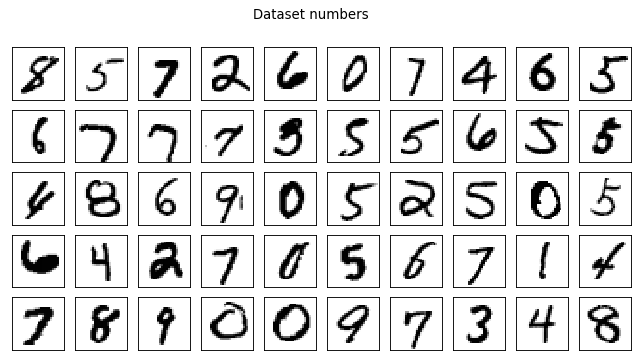

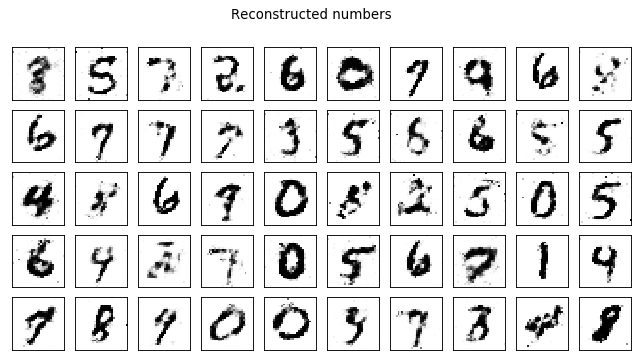

Test losses. G: 1.7823, D: 0.3517
Train Epoch: 106 [0/50000 (0%)]	Losses G: 1.9073, D: 0.4026
Train Epoch: 106 [25000/50000 (50%)]	Losses G: 1.2771, D: 0.5153
Train Epoch: 106 [50000/50000 (100%)]	Losses G: 1.7493, D: 0.4766


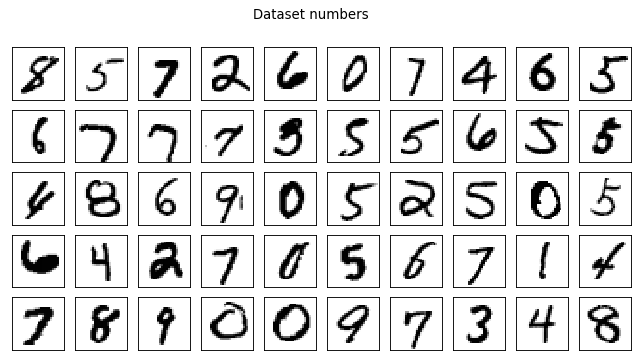

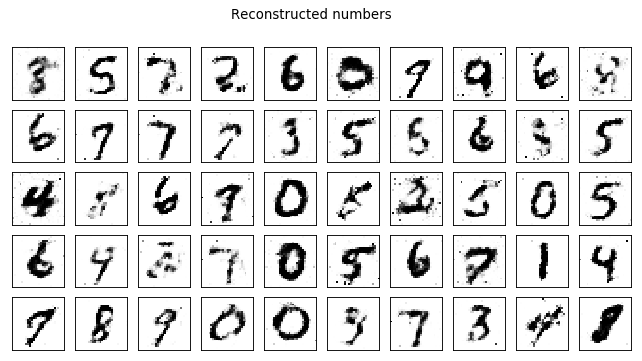

Test losses. G: 1.4621, D: 0.3893
Train Epoch: 107 [0/50000 (0%)]	Losses G: 1.9334, D: 0.4987
Train Epoch: 107 [25000/50000 (50%)]	Losses G: 1.6857, D: 0.4515
Train Epoch: 107 [50000/50000 (100%)]	Losses G: 1.5705, D: 0.4909


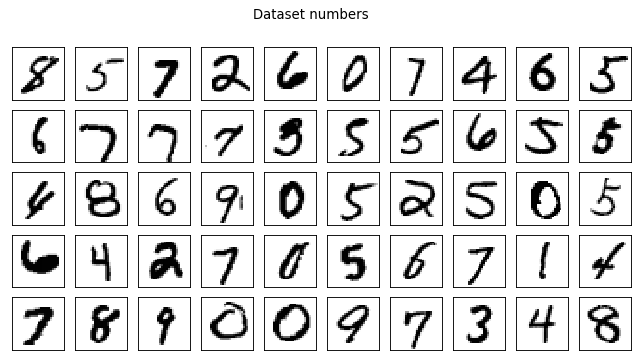

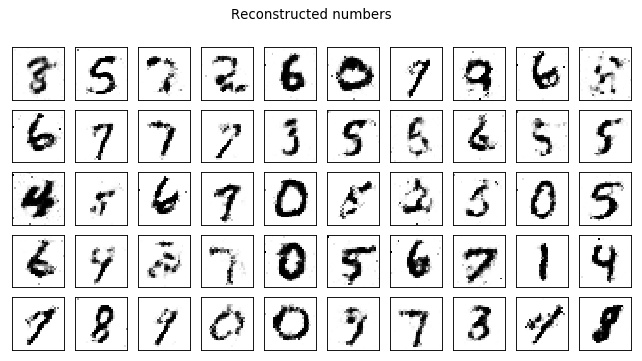

Test losses. G: 1.5245, D: 0.4071
Train Epoch: 108 [0/50000 (0%)]	Losses G: 1.5963, D: 0.4535
Train Epoch: 108 [25000/50000 (50%)]	Losses G: 1.8325, D: 0.4514
Train Epoch: 108 [50000/50000 (100%)]	Losses G: 1.5029, D: 0.5300


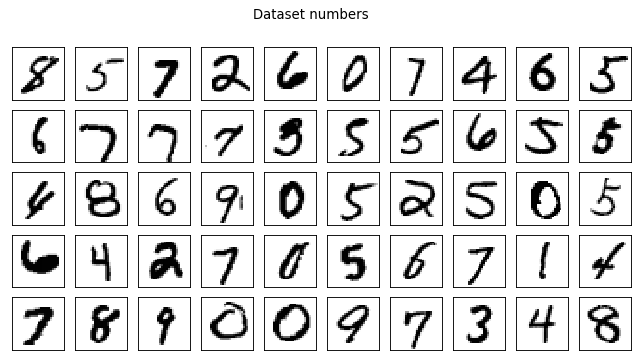

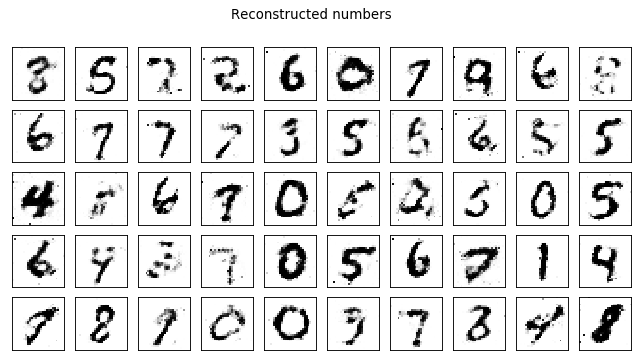

Test losses. G: 1.4183, D: 0.3999
Train Epoch: 109 [0/50000 (0%)]	Losses G: 1.5630, D: 0.5022
Train Epoch: 109 [25000/50000 (50%)]	Losses G: 1.4639, D: 0.4741
Train Epoch: 109 [50000/50000 (100%)]	Losses G: 1.6057, D: 0.4431


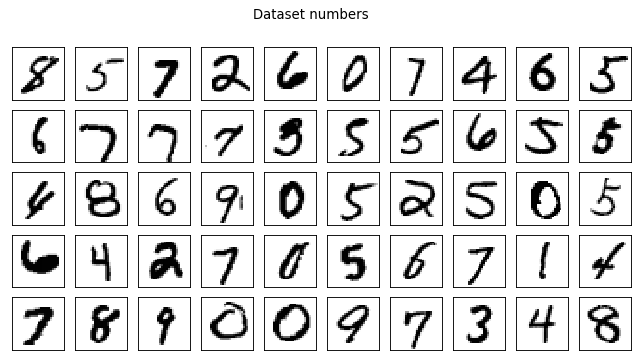

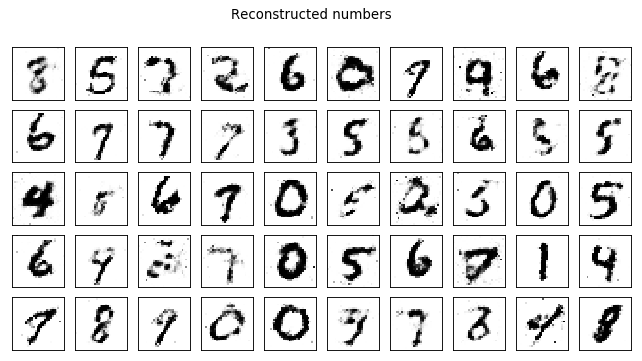

Test losses. G: 1.4805, D: 0.3737
Train Epoch: 110 [0/50000 (0%)]	Losses G: 1.5152, D: 0.4605
Train Epoch: 110 [25000/50000 (50%)]	Losses G: 1.2809, D: 0.4707
Train Epoch: 110 [50000/50000 (100%)]	Losses G: 1.6030, D: 0.4194


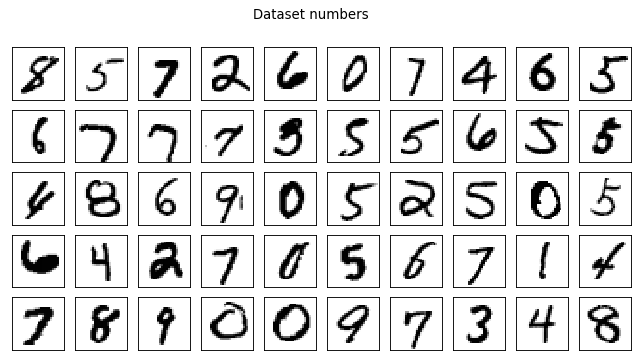

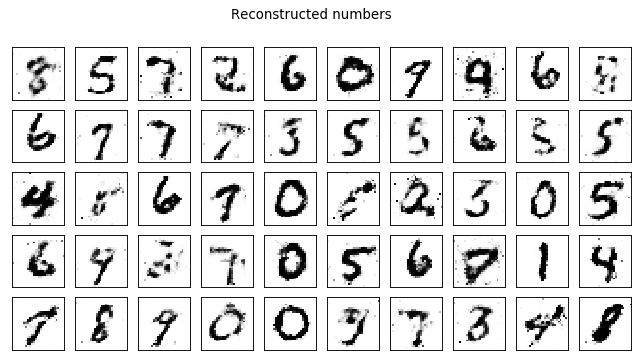

Test losses. G: 1.5413, D: 0.3869
Train Epoch: 111 [0/50000 (0%)]	Losses G: 1.6771, D: 0.4520
Train Epoch: 111 [25000/50000 (50%)]	Losses G: 1.8574, D: 0.4013
Train Epoch: 111 [50000/50000 (100%)]	Losses G: 1.4780, D: 0.4446


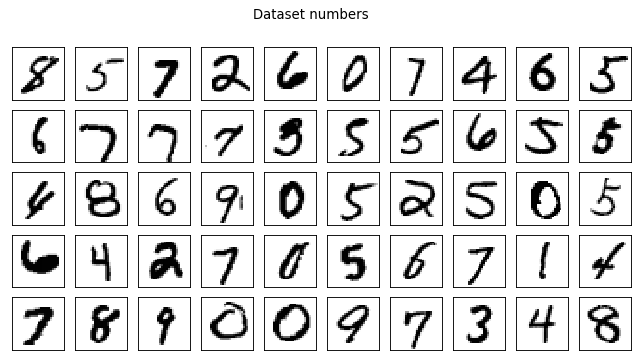

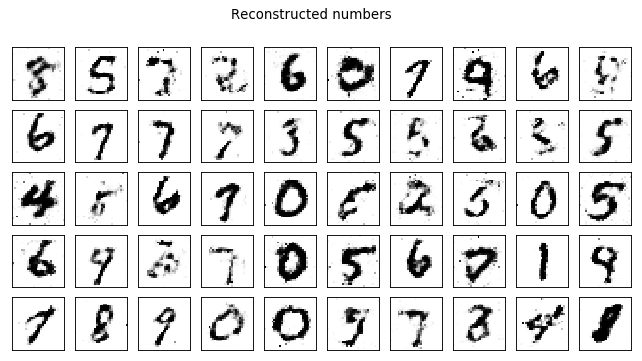

Test losses. G: 1.3365, D: 0.4002
Train Epoch: 112 [0/50000 (0%)]	Losses G: 1.3808, D: 0.4873
Train Epoch: 112 [25000/50000 (50%)]	Losses G: 1.6454, D: 0.5104
Train Epoch: 112 [50000/50000 (100%)]	Losses G: 1.4965, D: 0.4673


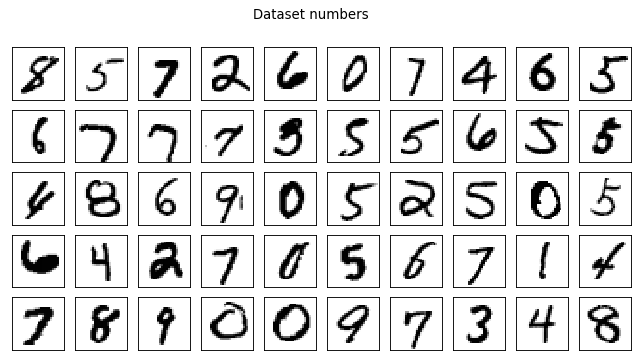

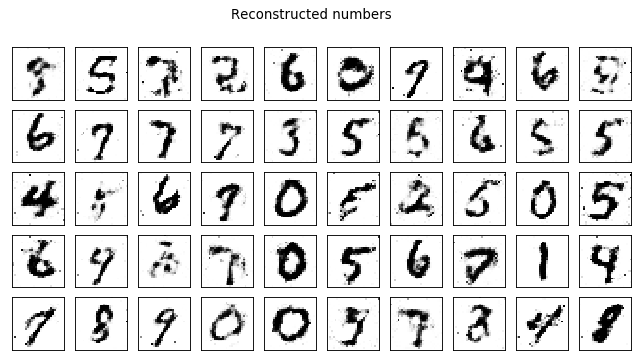

Test losses. G: 1.4085, D: 0.4098
Train Epoch: 113 [0/50000 (0%)]	Losses G: 1.5172, D: 0.4594
Train Epoch: 113 [25000/50000 (50%)]	Losses G: 2.1694, D: 0.4496
Train Epoch: 113 [50000/50000 (100%)]	Losses G: 1.8324, D: 0.4636


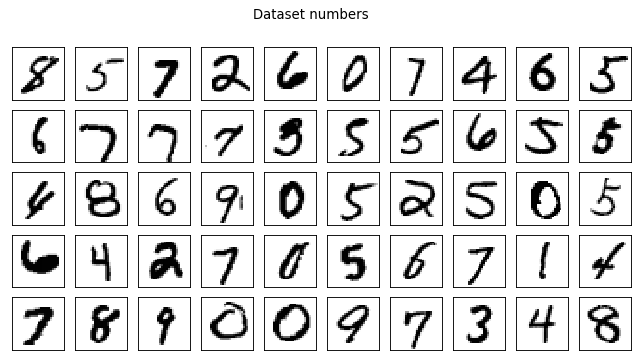

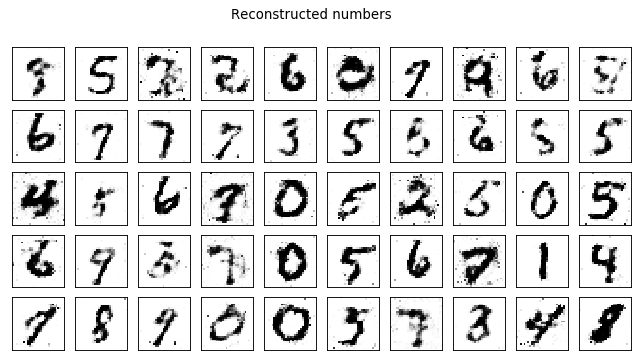

Test losses. G: 1.7478, D: 0.3886
Train Epoch: 114 [0/50000 (0%)]	Losses G: 1.8514, D: 0.4635
Train Epoch: 114 [25000/50000 (50%)]	Losses G: 1.3865, D: 0.4605
Train Epoch: 114 [50000/50000 (100%)]	Losses G: 1.3205, D: 0.5201


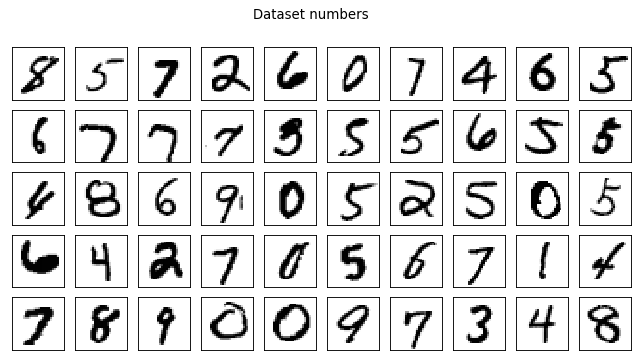

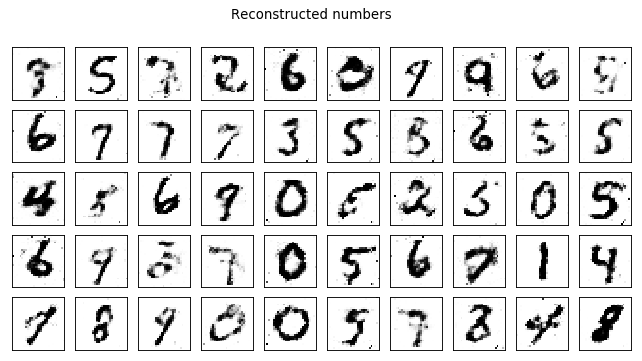

Test losses. G: 1.2597, D: 0.4084
Train Epoch: 115 [0/50000 (0%)]	Losses G: 1.4798, D: 0.4669
Train Epoch: 115 [25000/50000 (50%)]	Losses G: 1.5932, D: 0.4822
Train Epoch: 115 [50000/50000 (100%)]	Losses G: 1.3429, D: 0.5321


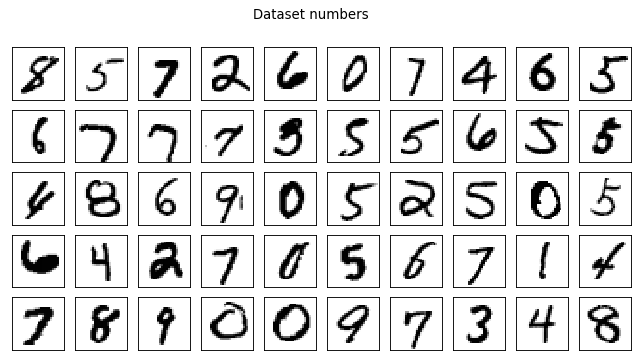

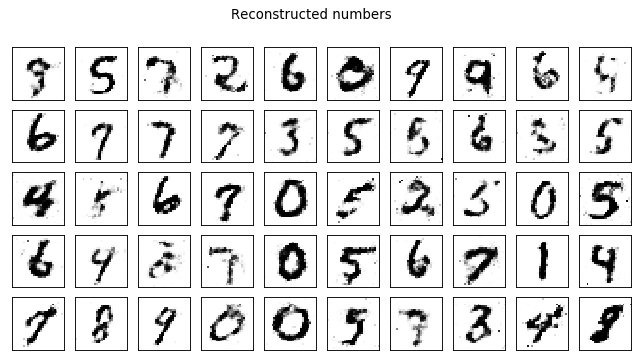

Test losses. G: 1.3565, D: 0.4281
Train Epoch: 116 [0/50000 (0%)]	Losses G: 1.4367, D: 0.4943
Train Epoch: 116 [25000/50000 (50%)]	Losses G: 1.6866, D: 0.4174
Train Epoch: 116 [50000/50000 (100%)]	Losses G: 1.7803, D: 0.4839


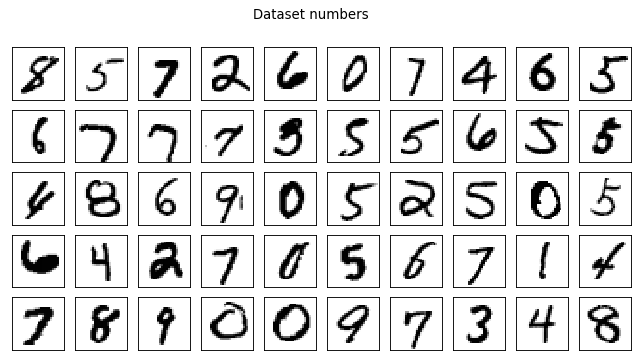

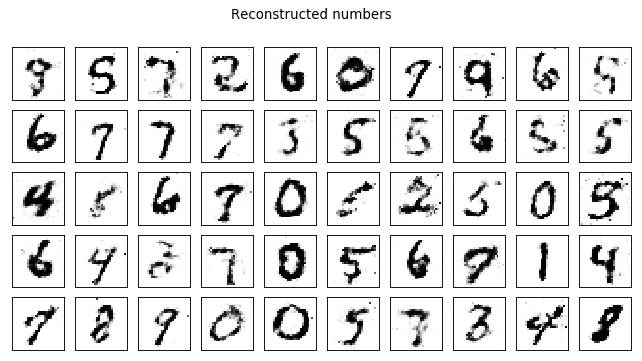

Test losses. G: 1.7102, D: 0.4342
Train Epoch: 117 [0/50000 (0%)]	Losses G: 1.4147, D: 0.5126
Train Epoch: 117 [25000/50000 (50%)]	Losses G: 1.5556, D: 0.5958
Train Epoch: 117 [50000/50000 (100%)]	Losses G: 1.3560, D: 0.4755


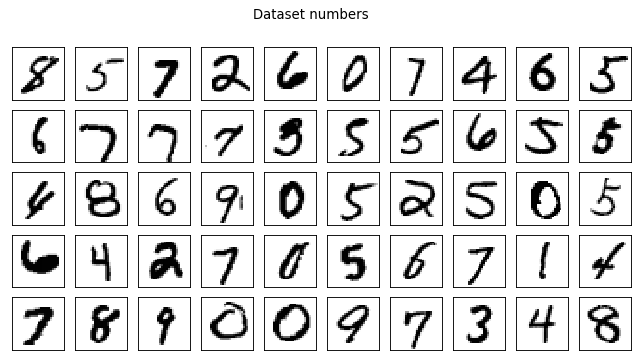

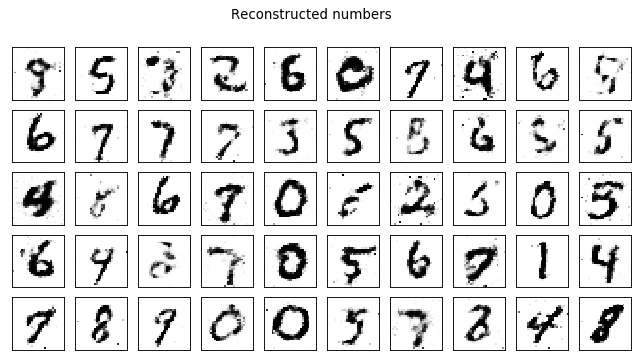

Test losses. G: 1.2134, D: 0.4121
Train Epoch: 118 [0/50000 (0%)]	Losses G: 1.4399, D: 0.4773
Train Epoch: 118 [25000/50000 (50%)]	Losses G: 1.5459, D: 0.4741
Train Epoch: 118 [50000/50000 (100%)]	Losses G: 1.5317, D: 0.4919


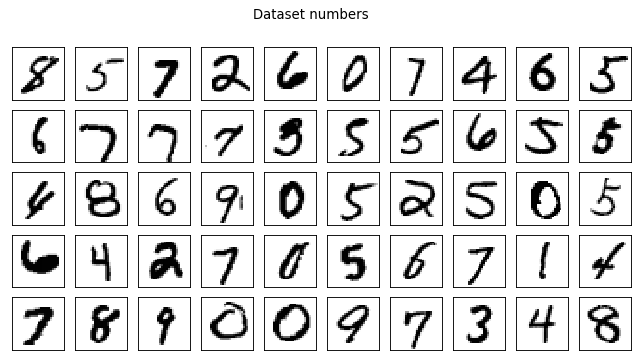

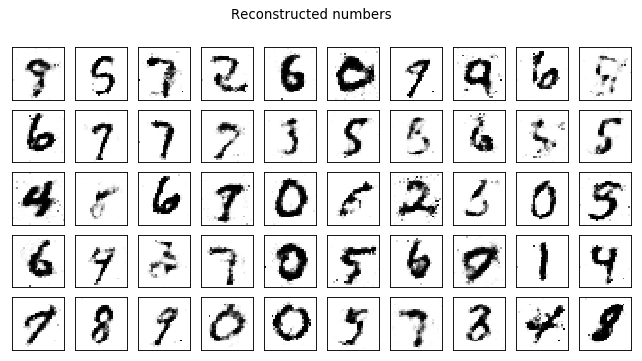

Test losses. G: 1.4123, D: 0.4226
Train Epoch: 119 [0/50000 (0%)]	Losses G: 1.7000, D: 0.5116
Train Epoch: 119 [25000/50000 (50%)]	Losses G: 1.5392, D: 0.5266
Train Epoch: 119 [50000/50000 (100%)]	Losses G: 1.6264, D: 0.4759


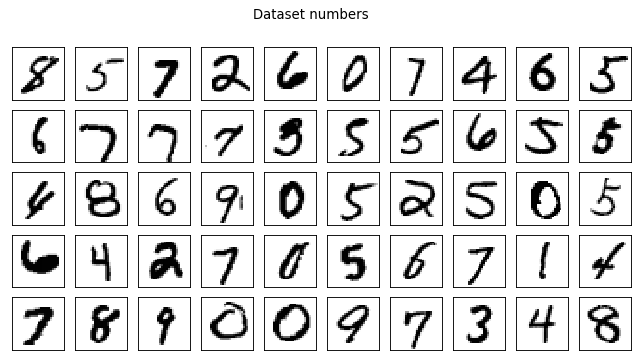

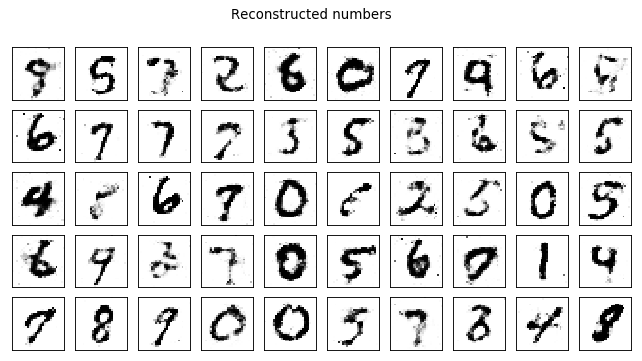

Test losses. G: 1.4970, D: 0.4120
Train Epoch: 120 [0/50000 (0%)]	Losses G: 1.5469, D: 0.4669
Train Epoch: 120 [25000/50000 (50%)]	Losses G: 1.2907, D: 0.4582
Train Epoch: 120 [50000/50000 (100%)]	Losses G: 1.2348, D: 0.4736


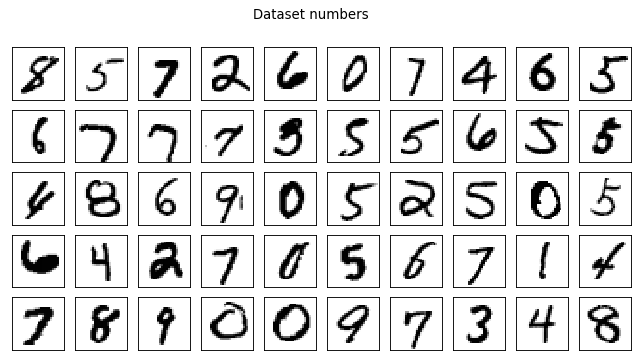

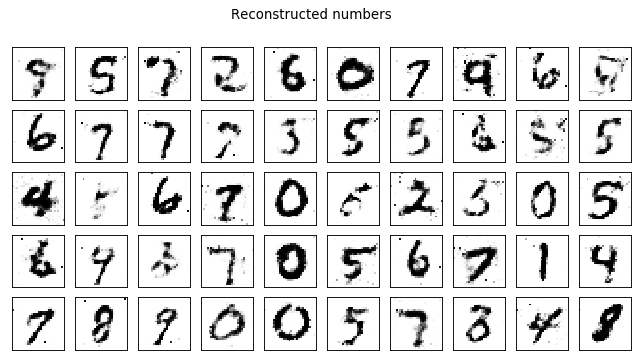

Test losses. G: 1.2627, D: 0.3988
Train Epoch: 121 [0/50000 (0%)]	Losses G: 1.3510, D: 0.5111
Train Epoch: 121 [25000/50000 (50%)]	Losses G: 1.4634, D: 0.4628
Train Epoch: 121 [50000/50000 (100%)]	Losses G: 1.3819, D: 0.5064


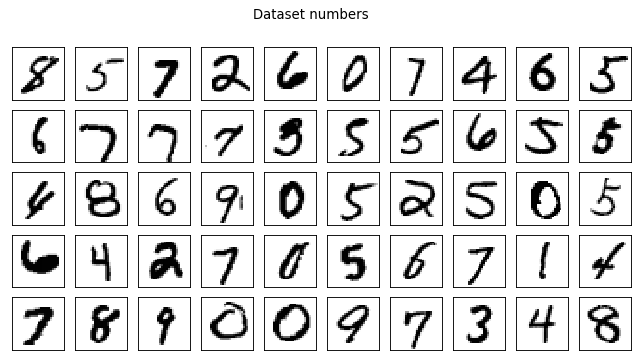

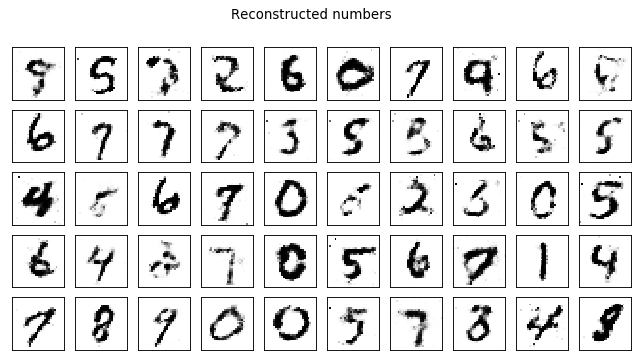

Test losses. G: 1.3144, D: 0.4788
Train Epoch: 122 [0/50000 (0%)]	Losses G: 1.3907, D: 0.5968
Train Epoch: 122 [25000/50000 (50%)]	Losses G: 1.2150, D: 0.5169
Train Epoch: 122 [50000/50000 (100%)]	Losses G: 1.3369, D: 0.4237


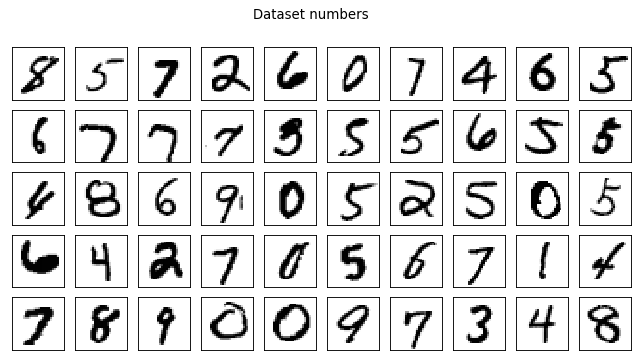

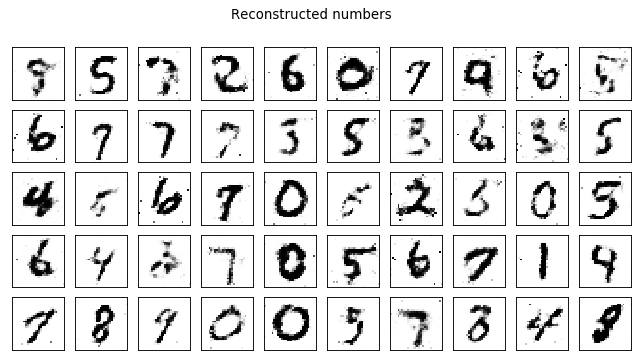

Test losses. G: 1.3008, D: 0.3955
Train Epoch: 123 [0/50000 (0%)]	Losses G: 1.4689, D: 0.4363
Train Epoch: 123 [25000/50000 (50%)]	Losses G: 1.5004, D: 0.4922
Train Epoch: 123 [50000/50000 (100%)]	Losses G: 1.6236, D: 0.5006


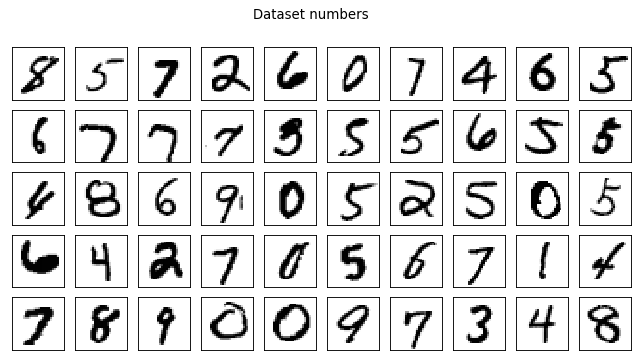

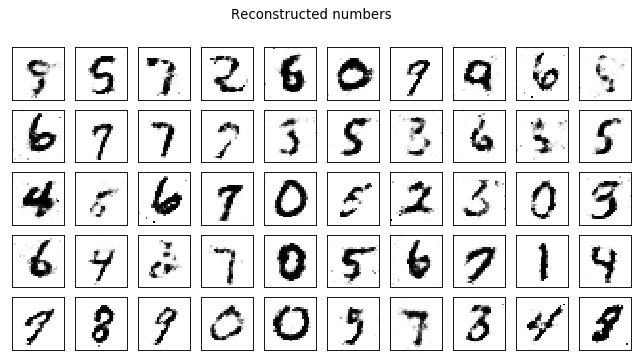

Test losses. G: 1.6352, D: 0.4594
Train Epoch: 124 [0/50000 (0%)]	Losses G: 1.4155, D: 0.5017
Train Epoch: 124 [25000/50000 (50%)]	Losses G: 1.3816, D: 0.5157
Train Epoch: 124 [50000/50000 (100%)]	Losses G: 1.3706, D: 0.4802


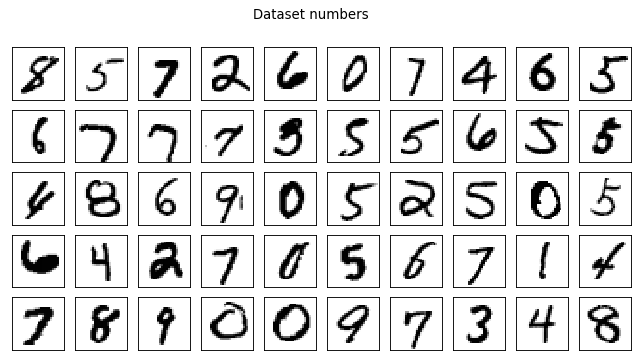

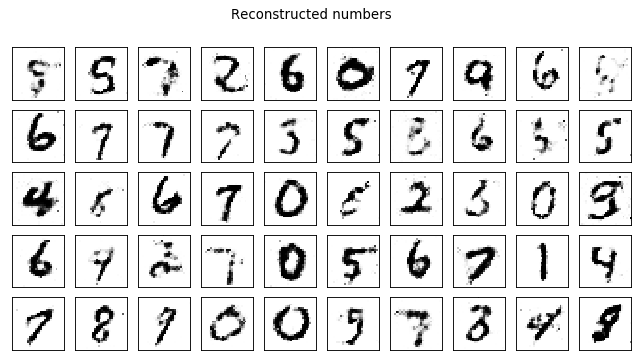

Test losses. G: 1.3083, D: 0.4288
Train Epoch: 125 [0/50000 (0%)]	Losses G: 1.2475, D: 0.4817
Train Epoch: 125 [25000/50000 (50%)]	Losses G: 1.5054, D: 0.4579
Train Epoch: 125 [50000/50000 (100%)]	Losses G: 1.6208, D: 0.4893


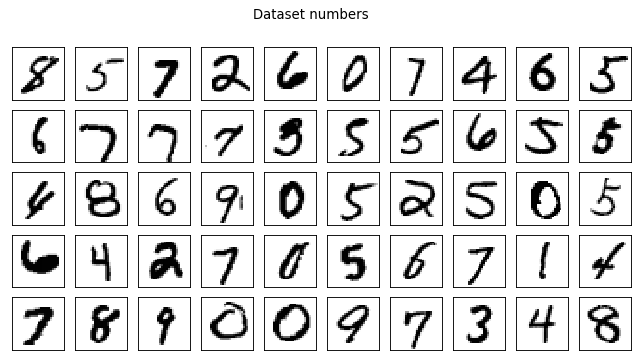

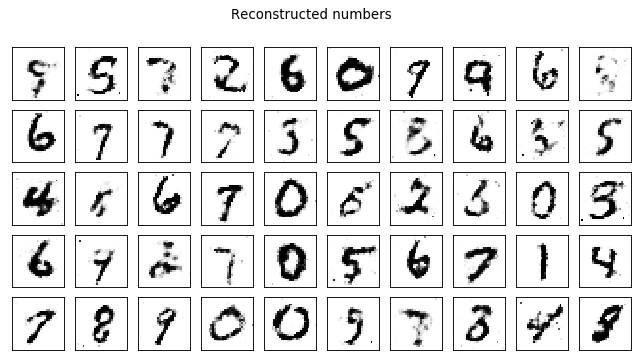

Test losses. G: 1.6234, D: 0.4818
Train Epoch: 126 [0/50000 (0%)]	Losses G: 1.4658, D: 0.5524
Train Epoch: 126 [25000/50000 (50%)]	Losses G: 1.3133, D: 0.5185
Train Epoch: 126 [50000/50000 (100%)]	Losses G: 1.5426, D: 0.4536


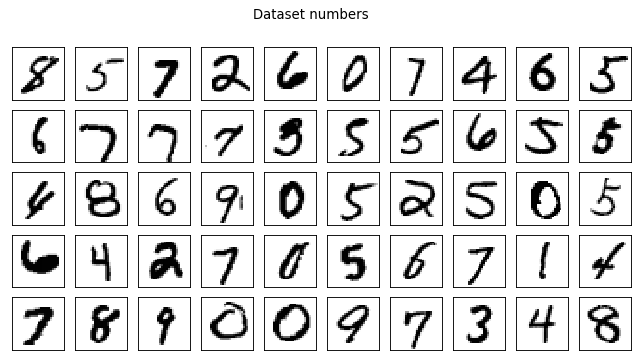

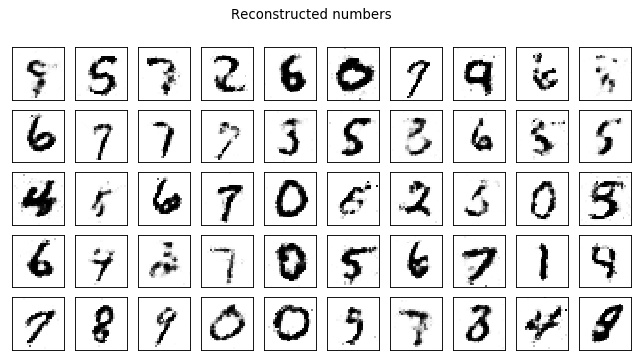

Test losses. G: 1.5126, D: 0.3899
Train Epoch: 127 [0/50000 (0%)]	Losses G: 1.4502, D: 0.4596
Train Epoch: 127 [25000/50000 (50%)]	Losses G: 1.4722, D: 0.5549
Train Epoch: 127 [50000/50000 (100%)]	Losses G: 1.3894, D: 0.5148


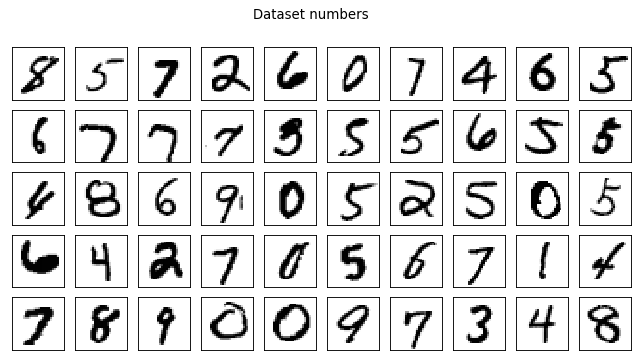

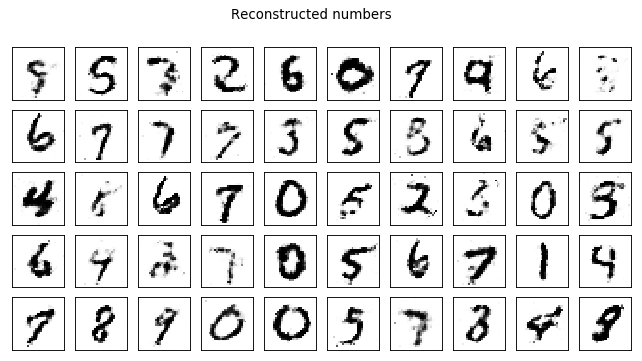

Test losses. G: 1.3732, D: 0.4380
Train Epoch: 128 [0/50000 (0%)]	Losses G: 1.5716, D: 0.5106
Train Epoch: 128 [25000/50000 (50%)]	Losses G: 1.5255, D: 0.4290
Train Epoch: 128 [50000/50000 (100%)]	Losses G: 1.3739, D: 0.5233


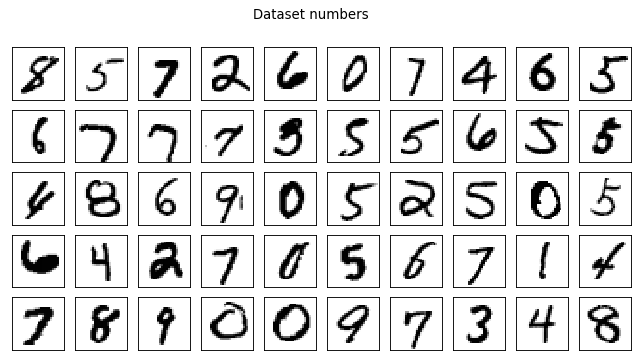

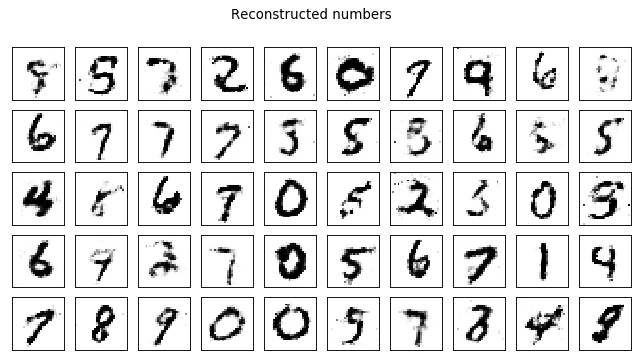

Test losses. G: 1.3747, D: 0.4385
Train Epoch: 129 [0/50000 (0%)]	Losses G: 1.2088, D: 0.5069
Train Epoch: 129 [25000/50000 (50%)]	Losses G: 1.3656, D: 0.4992
Train Epoch: 129 [50000/50000 (100%)]	Losses G: 1.3613, D: 0.4966


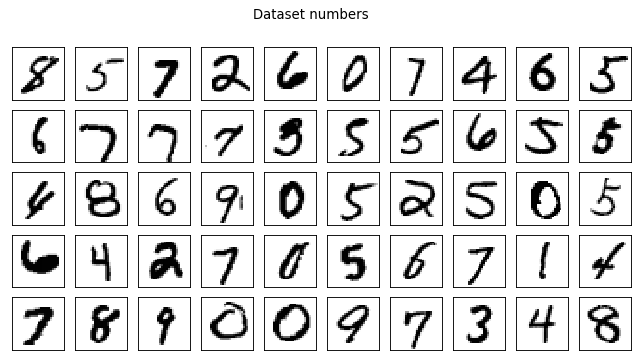

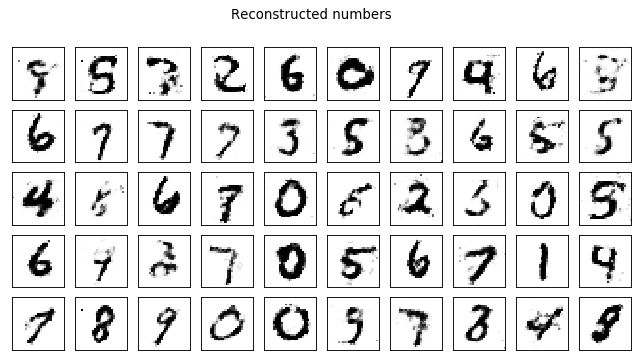

Test losses. G: 1.3016, D: 0.4376
Train Epoch: 130 [0/50000 (0%)]	Losses G: 1.3711, D: 0.4959
Train Epoch: 130 [25000/50000 (50%)]	Losses G: 0.9967, D: 0.5179
Train Epoch: 130 [50000/50000 (100%)]	Losses G: 1.2261, D: 0.4863


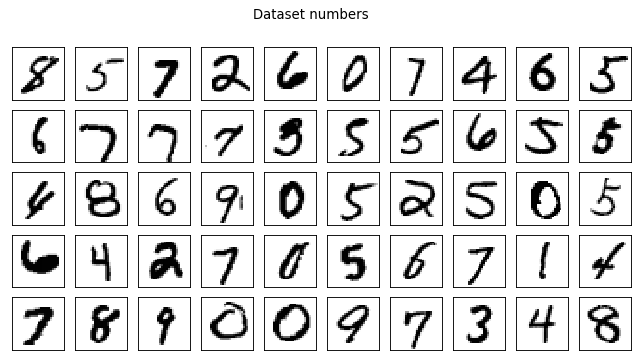

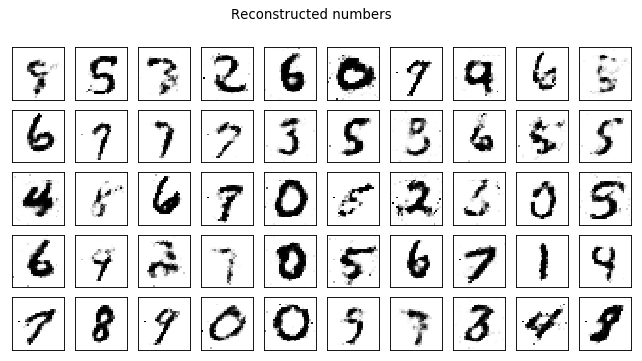

Test losses. G: 1.2584, D: 0.4626
Train Epoch: 131 [0/50000 (0%)]	Losses G: 1.2188, D: 0.4846
Train Epoch: 131 [25000/50000 (50%)]	Losses G: 1.4823, D: 0.4411
Train Epoch: 131 [50000/50000 (100%)]	Losses G: 1.6813, D: 0.5205


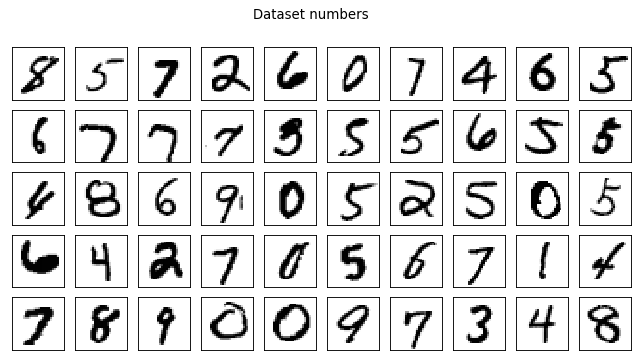

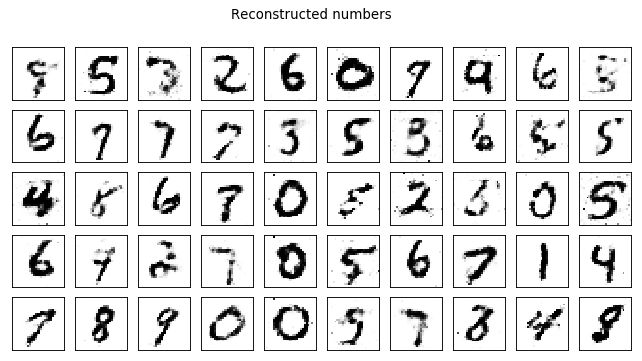

Test losses. G: 1.6212, D: 0.4401
Train Epoch: 132 [0/50000 (0%)]	Losses G: 1.4036, D: 0.5566
Train Epoch: 132 [25000/50000 (50%)]	Losses G: 1.2425, D: 0.5780
Train Epoch: 132 [50000/50000 (100%)]	Losses G: 1.0308, D: 0.5647


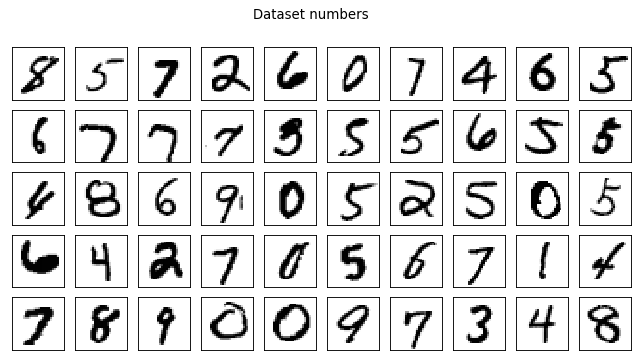

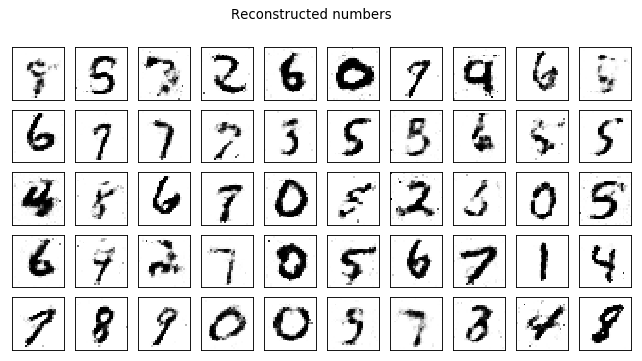

Test losses. G: 1.0267, D: 0.5057
Train Epoch: 133 [0/50000 (0%)]	Losses G: 1.1208, D: 0.5411
Train Epoch: 133 [25000/50000 (50%)]	Losses G: 1.2683, D: 0.5306
Train Epoch: 133 [50000/50000 (100%)]	Losses G: 1.3510, D: 0.5166


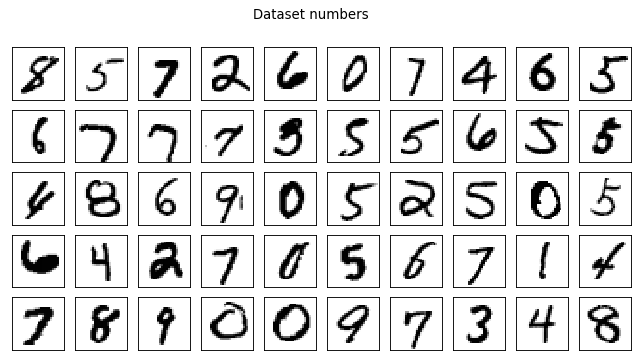

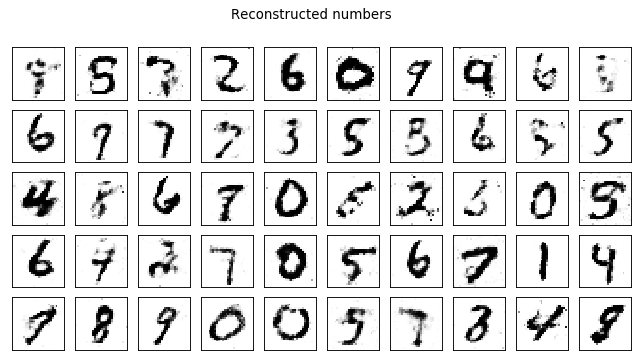

Test losses. G: 1.2797, D: 0.4565
Train Epoch: 134 [0/50000 (0%)]	Losses G: 1.3765, D: 0.5131
Train Epoch: 134 [25000/50000 (50%)]	Losses G: 1.4289, D: 0.5049
Train Epoch: 134 [50000/50000 (100%)]	Losses G: 1.1522, D: 0.5500


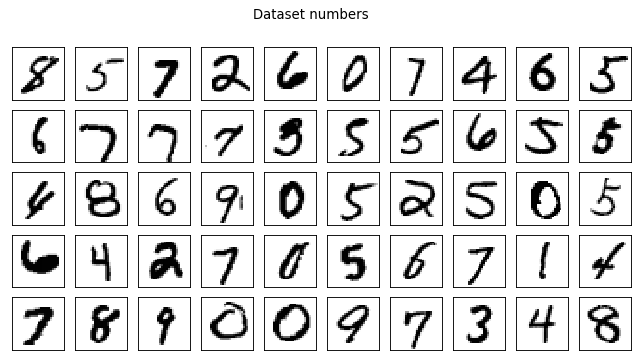

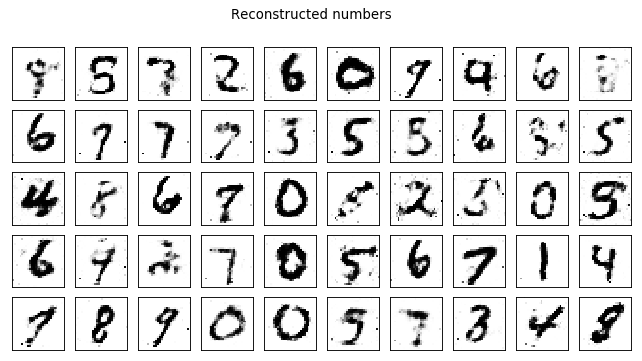

Test losses. G: 1.1470, D: 0.5183
Train Epoch: 135 [0/50000 (0%)]	Losses G: 1.4009, D: 0.5866
Train Epoch: 135 [25000/50000 (50%)]	Losses G: 1.2841, D: 0.5462
Train Epoch: 135 [50000/50000 (100%)]	Losses G: 1.4020, D: 0.5504


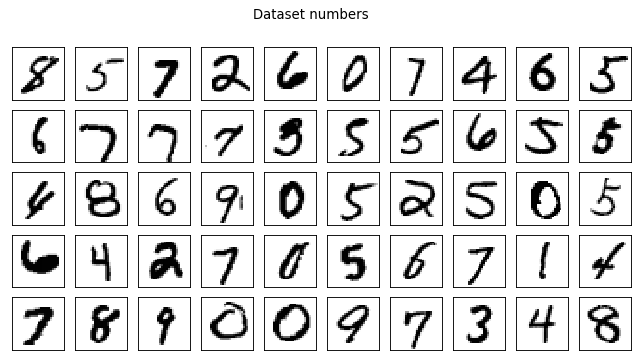

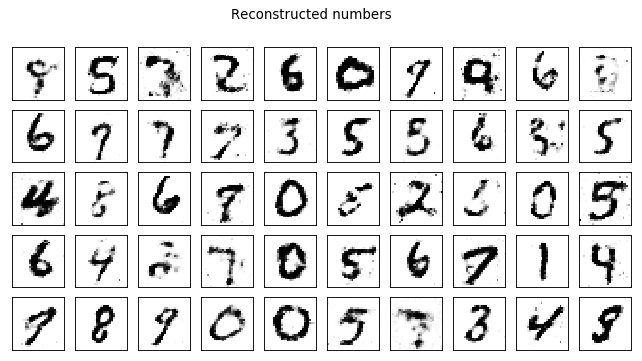

Test losses. G: 1.2395, D: 0.4951
Train Epoch: 136 [0/50000 (0%)]	Losses G: 1.4513, D: 0.5745
Train Epoch: 136 [25000/50000 (50%)]	Losses G: 1.4795, D: 0.5330
Train Epoch: 136 [50000/50000 (100%)]	Losses G: 1.3520, D: 0.5341


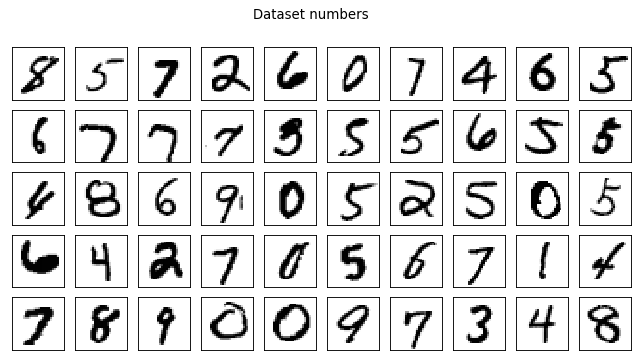

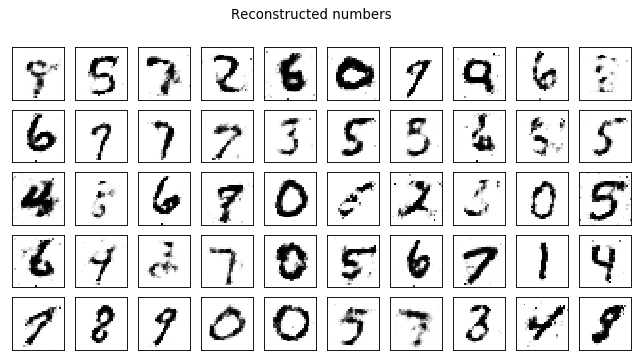

Test losses. G: 1.3232, D: 0.4712
Train Epoch: 137 [0/50000 (0%)]	Losses G: 1.2040, D: 0.4676
Train Epoch: 137 [25000/50000 (50%)]	Losses G: 1.2344, D: 0.5515
Train Epoch: 137 [50000/50000 (100%)]	Losses G: 1.4460, D: 0.5784


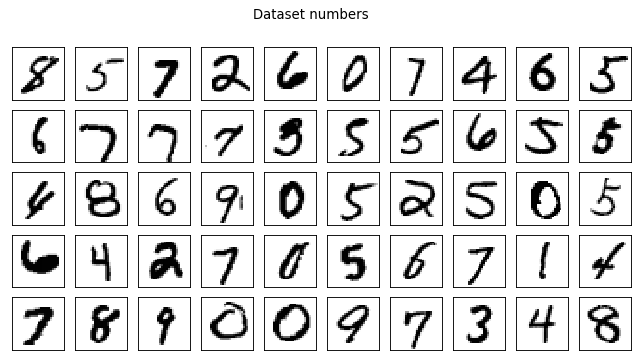

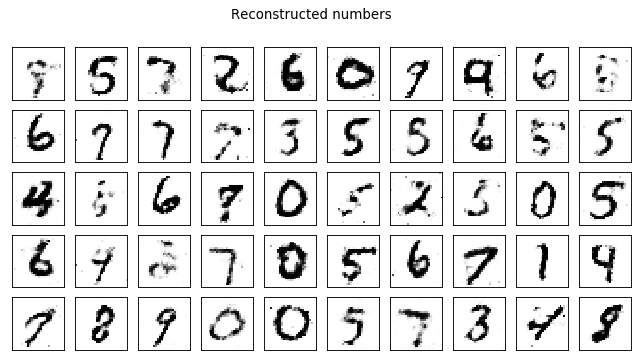

Test losses. G: 1.3377, D: 0.4785
Train Epoch: 138 [0/50000 (0%)]	Losses G: 1.3029, D: 0.5125
Train Epoch: 138 [25000/50000 (50%)]	Losses G: 1.1873, D: 0.5405
Train Epoch: 138 [50000/50000 (100%)]	Losses G: 1.2206, D: 0.5567


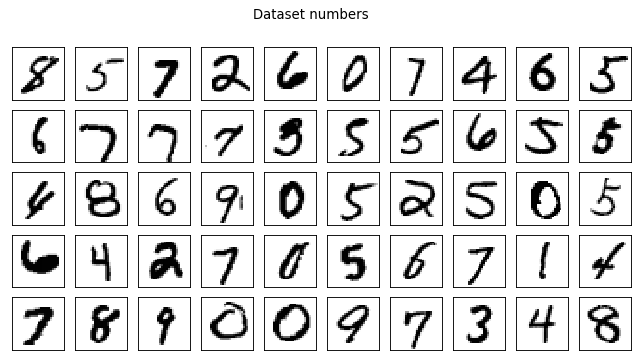

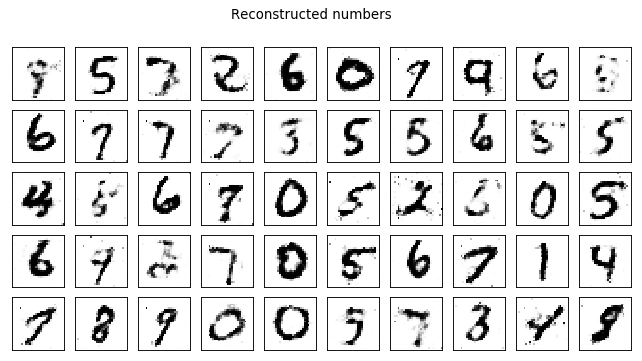

Test losses. G: 1.1711, D: 0.5196
Train Epoch: 139 [0/50000 (0%)]	Losses G: 1.1728, D: 0.5475
Train Epoch: 139 [25000/50000 (50%)]	Losses G: 0.9989, D: 0.5780
Train Epoch: 139 [50000/50000 (100%)]	Losses G: 1.2814, D: 0.5754


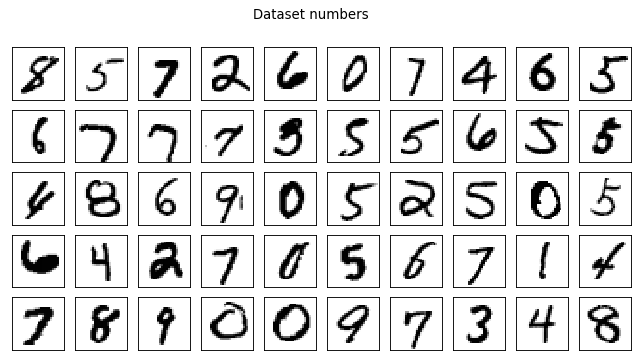

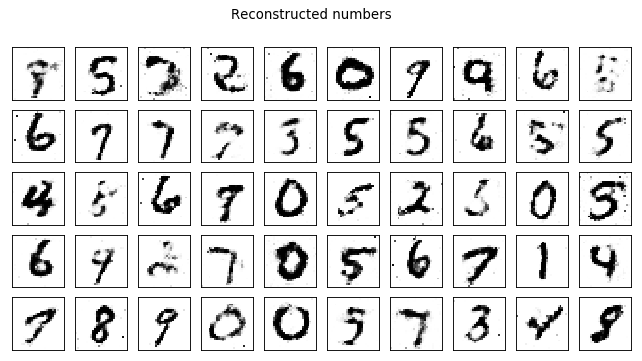

Test losses. G: 1.2324, D: 0.4733
Train Epoch: 140 [0/50000 (0%)]	Losses G: 1.2538, D: 0.5434
Train Epoch: 140 [25000/50000 (50%)]	Losses G: 1.2427, D: 0.5632
Train Epoch: 140 [50000/50000 (100%)]	Losses G: 1.2012, D: 0.5991


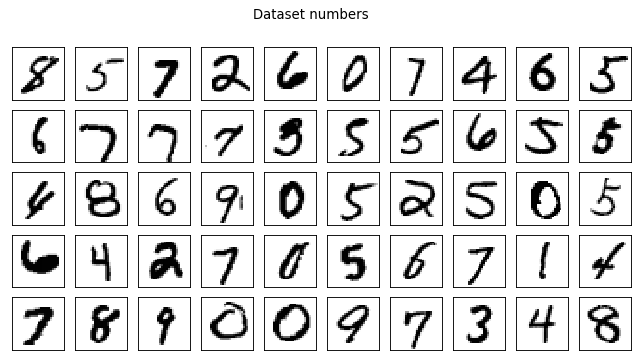

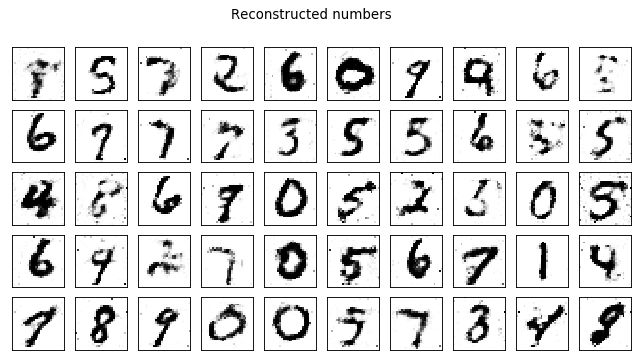

Test losses. G: 1.0853, D: 0.5381
Train Epoch: 141 [0/50000 (0%)]	Losses G: 1.2798, D: 0.5506
Train Epoch: 141 [25000/50000 (50%)]	Losses G: 1.2435, D: 0.5092
Train Epoch: 141 [50000/50000 (100%)]	Losses G: 1.2502, D: 0.5667


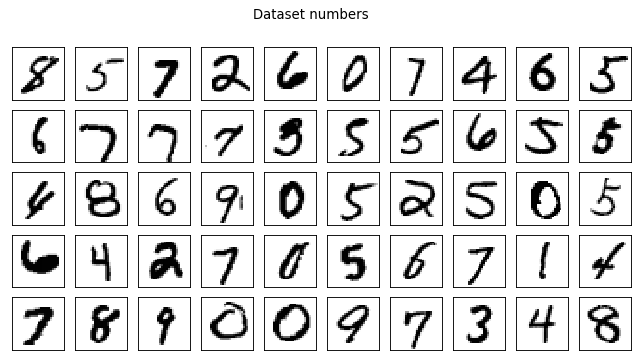

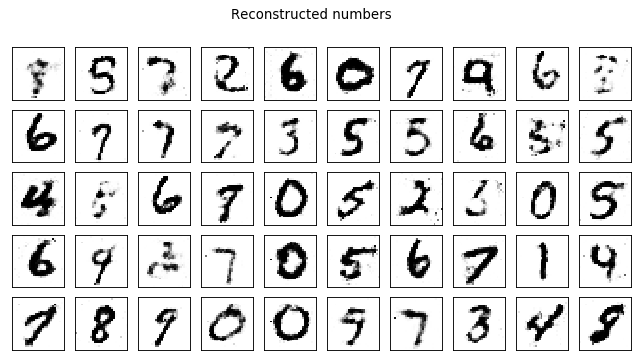

Test losses. G: 1.1817, D: 0.5050
Train Epoch: 142 [0/50000 (0%)]	Losses G: 1.1826, D: 0.5818
Train Epoch: 142 [25000/50000 (50%)]	Losses G: 1.1207, D: 0.5634
Train Epoch: 142 [50000/50000 (100%)]	Losses G: 1.1205, D: 0.6040


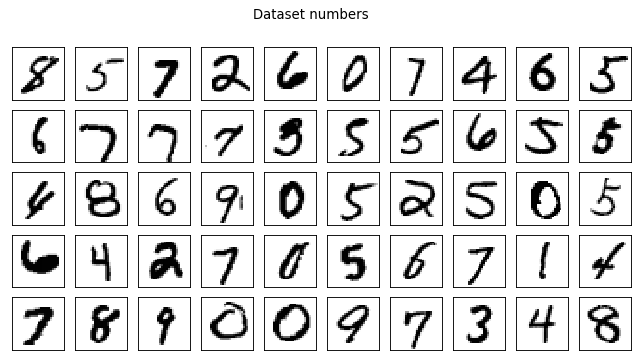

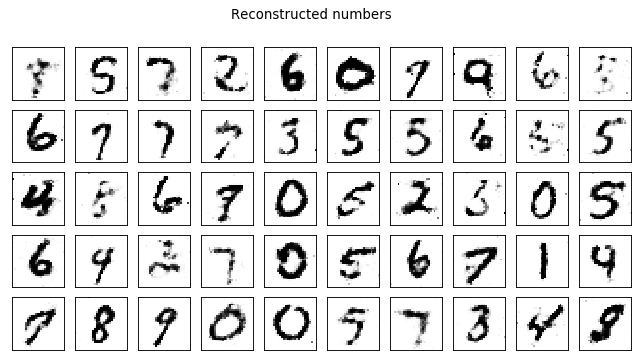

Test losses. G: 1.0800, D: 0.5506
Train Epoch: 143 [0/50000 (0%)]	Losses G: 1.0423, D: 0.5757
Train Epoch: 143 [25000/50000 (50%)]	Losses G: 1.1917, D: 0.5489
Train Epoch: 143 [50000/50000 (100%)]	Losses G: 1.1061, D: 0.5436


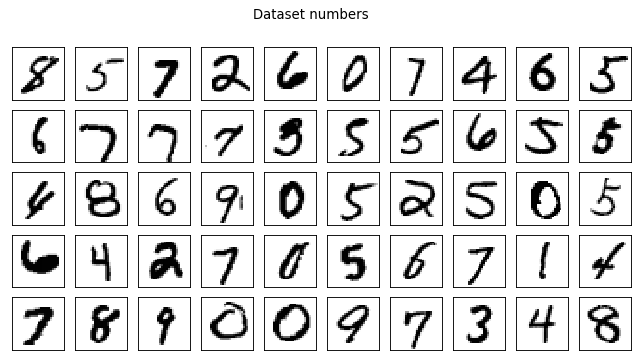

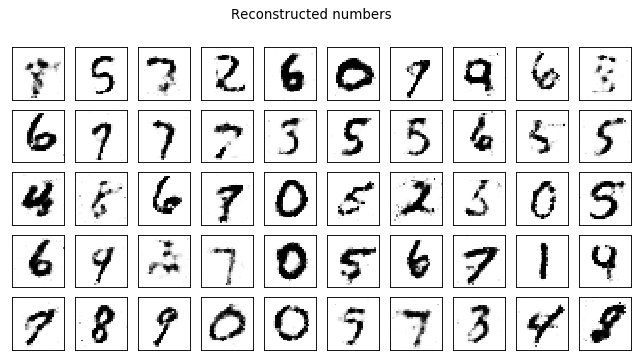

Test losses. G: 1.1334, D: 0.4923
Train Epoch: 144 [0/50000 (0%)]	Losses G: 1.2629, D: 0.5108
Train Epoch: 144 [25000/50000 (50%)]	Losses G: 1.1814, D: 0.5208
Train Epoch: 144 [50000/50000 (100%)]	Losses G: 1.2214, D: 0.5764


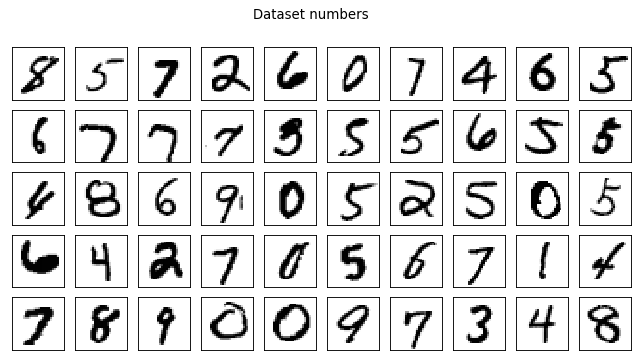

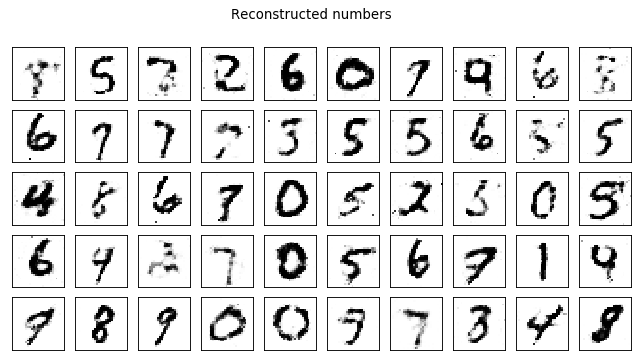

Test losses. G: 1.1855, D: 0.5056
Train Epoch: 145 [0/50000 (0%)]	Losses G: 1.1510, D: 0.5401
Train Epoch: 145 [25000/50000 (50%)]	Losses G: 1.2454, D: 0.5401
Train Epoch: 145 [50000/50000 (100%)]	Losses G: 1.2943, D: 0.5273


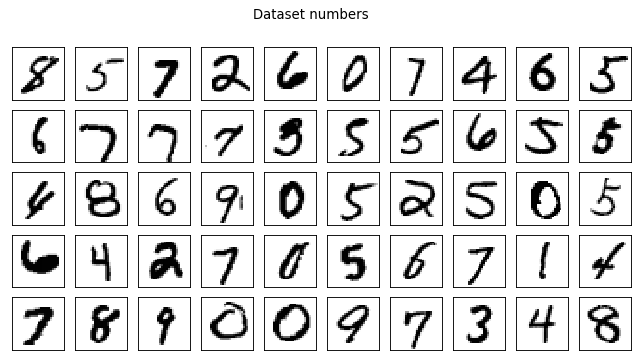

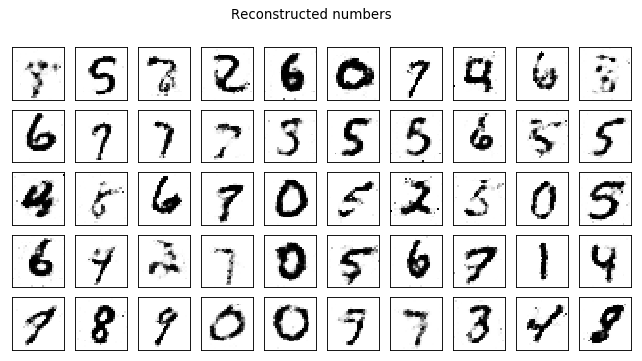

Test losses. G: 1.2836, D: 0.4904
Train Epoch: 146 [0/50000 (0%)]	Losses G: 1.2666, D: 0.5082
Train Epoch: 146 [25000/50000 (50%)]	Losses G: 1.0638, D: 0.5807
Train Epoch: 146 [50000/50000 (100%)]	Losses G: 1.2282, D: 0.5590


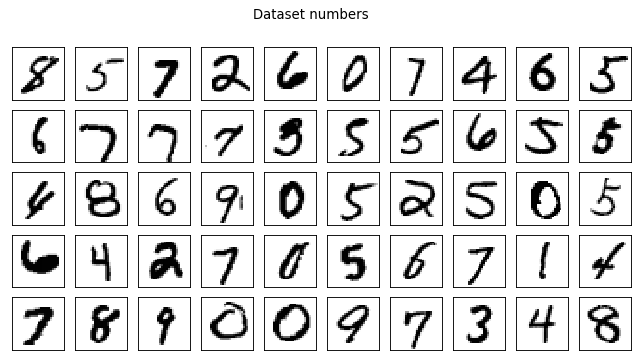

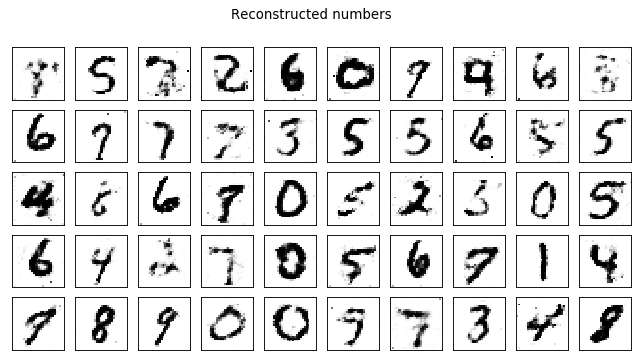

Test losses. G: 1.2055, D: 0.4829
Train Epoch: 147 [0/50000 (0%)]	Losses G: 1.2291, D: 0.5350
Train Epoch: 147 [25000/50000 (50%)]	Losses G: 1.6059, D: 0.4751
Train Epoch: 147 [50000/50000 (100%)]	Losses G: 1.3688, D: 0.5574


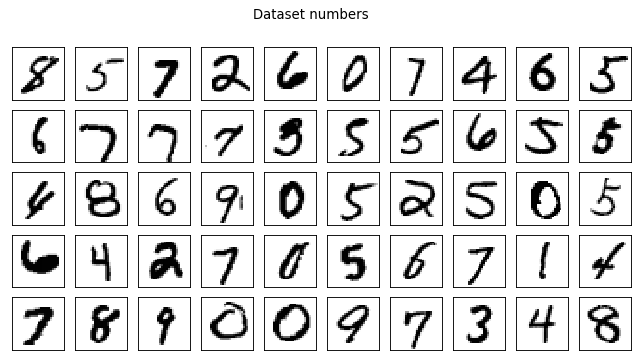

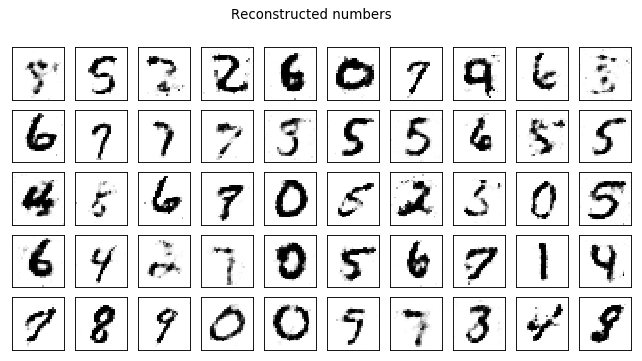

Test losses. G: 1.3509, D: 0.4559
Train Epoch: 148 [0/50000 (0%)]	Losses G: 1.3596, D: 0.5299
Train Epoch: 148 [25000/50000 (50%)]	Losses G: 1.2181, D: 0.5817
Train Epoch: 148 [50000/50000 (100%)]	Losses G: 1.1176, D: 0.6179


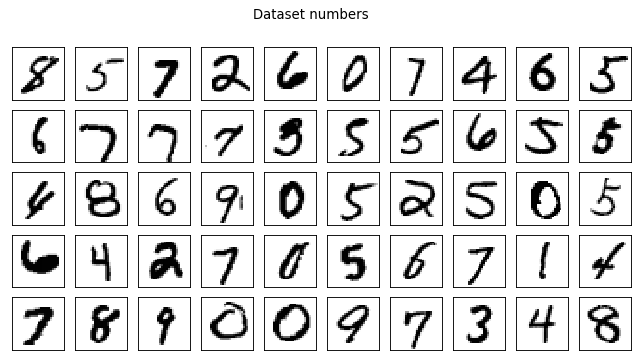

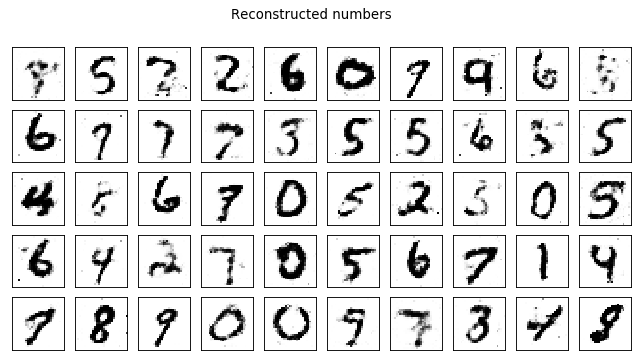

Test losses. G: 1.0551, D: 0.5566
Train Epoch: 149 [0/50000 (0%)]	Losses G: 1.1711, D: 0.5870
Train Epoch: 149 [25000/50000 (50%)]	Losses G: 1.0877, D: 0.5650
Train Epoch: 149 [50000/50000 (100%)]	Losses G: 1.2695, D: 0.5516


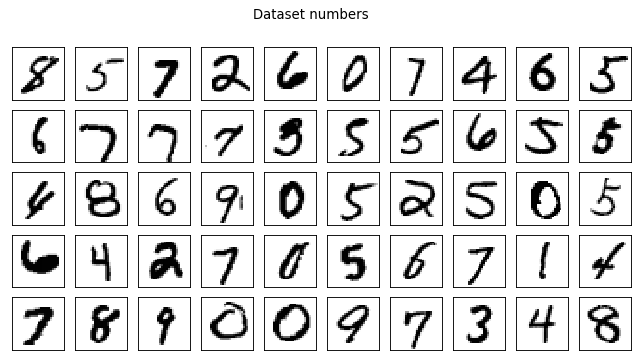

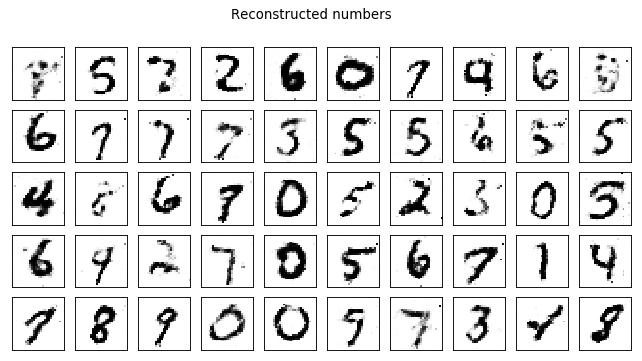

Test losses. G: 1.1962, D: 0.4958
Train Epoch: 150 [0/50000 (0%)]	Losses G: 1.3055, D: 0.5271
Train Epoch: 150 [25000/50000 (50%)]	Losses G: 1.2796, D: 0.5581
Train Epoch: 150 [50000/50000 (100%)]	Losses G: 1.0884, D: 0.5431


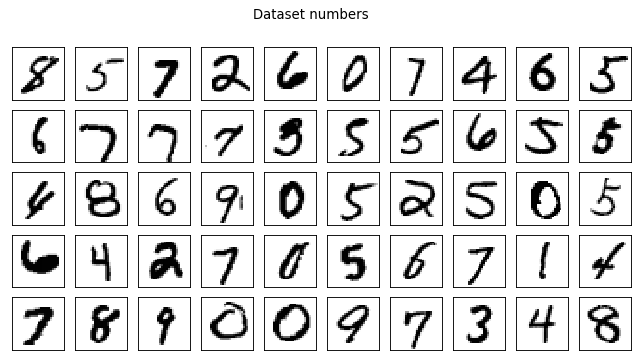

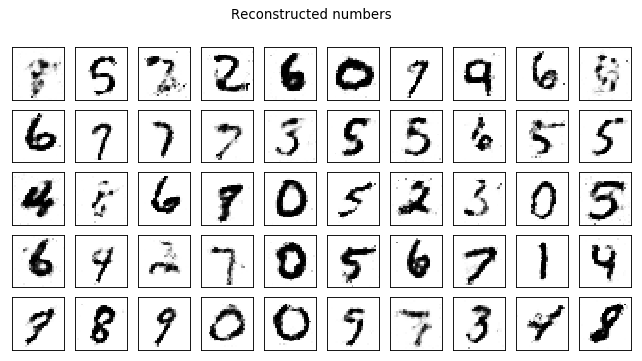

Test losses. G: 1.1089, D: 0.4952


In [11]:
with torch.cuda.device(0):
    for epoch in range(1, 151):
        G.train()
        D.train()
        train(epoch, G, D, train_log)
        G.eval()
        D.eval()
        test(G, D, valid_loader, epoch, test_log)

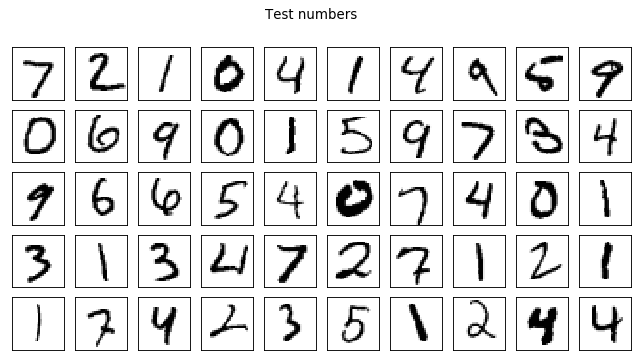

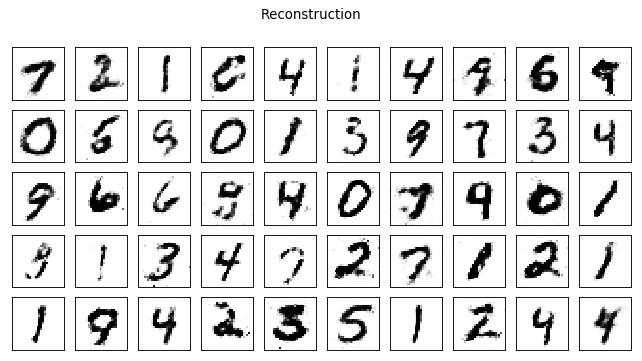

In [13]:
# testing reconstruction

_, _, test_loader = mnist(batch_size=50, valid=10000, transform=mnist_tanh)
test_data, labels = next(iter(test_loader))
    
test_z = torch.randn((50, 100))
test_y = torch.eye(10)[labels]

test_gen = G(torch.cat((test_z, test_y), 1)).data.numpy().reshape(50, 1, 28, 28)
plot_mnist(test_data, (5, 10), 'Test numbers')
plot_mnist(test_gen, (5, 10), 'Reconstruction')

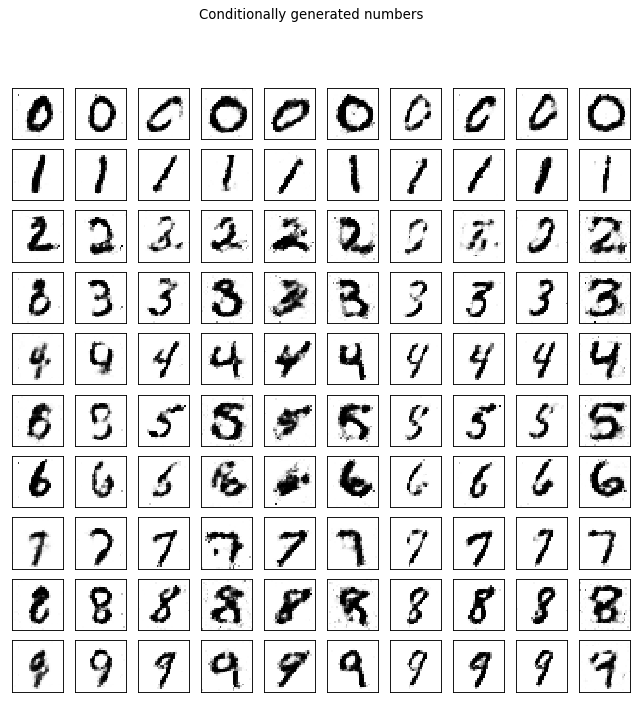

In [15]:
# testing conditional generation

sampled_data = torch.randn((10, 100)) # 10 sampled data points
classes = torch.eye(10) # one-hot encoded label classes

to_plot = []

for i in range(classes.shape[0]):
    for j in range(sampled_data.shape[0]):
        # adding label conditions to sampled data
        concat = torch.cat((sampled_data[j, :], classes[i, :]), 0)
        decoded = G(concat).data.numpy()
        to_plot.append(decoded)

to_plot = np.array(to_plot).reshape(-1, 1, 28, 28)
plot_mnist(to_plot, (10, 10), 'Conditionally generated numbers')